In [1]:
import pickle
import numpy as np
from matplotlib import pyplot as plt
import datetime as dt
import os
import pandas as pd
import sys
sys.path.append("/home/konajain/code")

In [2]:
import osqp
cols = ["lo_deep_Ask", "co_deep_Ask", "lo_top_Ask","co_top_Ask", "mo_Ask", "lo_inspread_Ask" ,
            "lo_inspread_Bid" , "mo_Bid", "co_top_Bid", "lo_top_Bid", "co_deep_Bid","lo_deep_Bid" ]

In [11]:
# ASLSD

with open("/SAN/fca/Konark_PhD_Experiments/extracted/aslsd_params_fit_2exp_2019-01-03_2019-01-03_fitted_mu", "rb") as f:
    mu = pickle.load(f)
with open("/SAN/fca/Konark_PhD_Experiments/extracted/aslsd_params_fit_2exp_2019-01-03_2019-01-03_fitted_ker", "rb") as f:
    phi = pickle.load(f)
with open("/SAN/fca/Konark_PhD_Experiments/extracted/aslsd_params_fit_2exp_2019-01-03_2019-01-03_fitted_adj", "rb") as f:
    adj = pickle.load(f)

In [16]:
with open("/SAN/fca/Konark_PhD_Experiments/extracted/aslsd_params_fit_2exp_2019-01-03_2019-01-03_fit_log", "rb") as f:
    log = pickle.load(f)

In [25]:
log.param_logs[0][-1]

array([1.77066800e-01, 1.85119012e-01, 1.25351464e+01, 1.00000000e-10,
       3.94677599e+00, 1.47094382e-01, 1.99128615e-01, 1.00000000e-10,
       7.01352646e+00, 1.00000000e-10, 3.63828448e+00, 1.00000000e-10,
       3.28149802e+00, 1.00000000e-10, 5.08499951e+00, 1.00000000e-10,
       2.75756270e+00, 1.00000000e-10, 1.19617708e+00, 1.00000000e-10,
       2.18426093e+00, 1.00000000e-10, 6.04516998e+00, 4.62265144e-01,
       1.62447522e+01, 1.00000000e-10, 4.83344267e+00, 1.00000000e-10,
       2.28097311e+00, 1.00000000e-10, 1.35169434e+00, 1.05013270e-02,
       1.20386599e+01, 1.00000000e-10, 2.21133874e+00, 1.00000000e-10,
       2.35403794e+00, 1.00000000e-10, 1.07335789e+00, 1.00000000e-10,
       3.77016487e+00, 1.00000000e-10, 1.45984206e+00, 1.00000000e-10,
       4.00822758e+00, 1.00000000e-10, 1.68216506e+00, 1.00000000e-10,
       4.60672692e+00])

In [1]:
with open("/SAN/fca/Konark_PhD_Experiments/extracted/INTC.OQ_Params_2019-01-02_2019-03-31_IS_osqpSparseTODNorm_bounds", "rb") as f:
    thetas = pickle.load(f)
    for k, v in thetas.items():
            theta1, theta2, theta3 = v
            # thetas[k] = np.hstack([theta1[:,:5], theta2, theta3, theta1[:,5:]])
            thetas[k] = np.hstack([theta2.transpose()[:,:5], theta1.transpose(), theta3.transpose(), theta2.transpose()[:,5:]])

NameError: name 'pickle' is not defined

In [3]:
thetas = {}
for d in pd.date_range(dt.date(2019,1,2), dt.date(2019,3,31)):
    if not os.path.exists("/SAN/fca/Konark_PhD_Experiments/extracted/AAPL.OQ_Params_"+d.strftime("%Y-%m-%d")+"_" + d.strftime("%Y-%m-%d")+ "_IS_osqpSparse_boundsInt"):
        continue
    with open("/SAN/fca/Konark_PhD_Experiments/extracted/AAPL.OQ_Params_"+d.strftime("%Y-%m-%d")+"_" + d.strftime("%Y-%m-%d")+ "_IS_osqpSparse_boundsInt", "rb") as f:
        v = pickle.load(f)
        thetas[d.strftime("%Y-%m-%d")] = v
    
with open("/SAN/fca/Konark_PhD_Experiments/extracted/AAPL.OQ_Params_2019-01-02_2019-03-31_IS_osqpSparseTODNorm_boundsInt", "wb") as f:
    pickle.dump(thetas, f)

In [6]:
thetas = {}
for i in range(1,101):
    if not os.path.exists("/SAN/fca/Konark_PhD_Experiments/extracted/fake_Params_"+str(i)+"_" + str(i)+ "_IS_osqpSparse_bounds_new"):
        continue
    with open("/SAN/fca/Konark_PhD_Experiments/extracted/fake_Params_"+str(i)+"_" + str(i)+ "_IS_osqpSparse_bounds_new", "rb") as f:
        v = pickle.load(f)
        thetas[str(i)] = v
# thetas['2019-01-02'] = thetas['1']
with open("/SAN/fca/Konark_PhD_Experiments/extracted/fake_Params_2019-01-02_2019-03-31_IS_osqpSparseTODNorm_bounds", "wb") as f:
    pickle.dump(thetas, f)

In [43]:
sum(thetas['2019-01-02'][1:,0][[i*12 for i in range(18)]]*timegrid_len/timegrid_len[0])

0.6692884178401096

In [44]:
timegrid_len/timegrid_len[0]

array([1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 2.96777675e+01, 1.27541088e+02, 5.48111618e+02,
       2.35552597e+03, 1.01229429e+04, 4.35036479e+04, 1.86958220e+05,
       8.03458509e+05, 3.45288682e+06])

In [9]:
# Special Date:
specDate = {
            "MEXP" : [dt.date(2019,1,18), dt.date(2019,2,15), dt.date(2019,4,18), dt.date(2019,5,17), dt.date(2019,7,19), dt.date(2019,8,16), dt.date(2019,10,18), dt.date(2019,11,15), dt.date(2020,1,17), dt.date(2020,2,21), dt.date(2020,4,17), dt.date(2020,5,15)],
            "FOMC3" : [dt.date(2019,1,30), dt.date(2019,3,20), dt.date(2019,5,1), dt.date(2019,6,19), dt.date(2019,7,31), dt.date(2019,9,18), dt.date(2019,10,30), dt.date(2019,12,11), dt.date(2020,1,29), dt.date(2020,3,18), dt.date(2020,4,29), dt.date(2020,6,10)],
            "MEND" : [dt.date(2019,1,31), dt.date(2019,4,30), dt.date(2019,5,31), dt.date(2019,10,31), dt.date(2020,1,31), dt.date(2020,4, 30)],
            "MSCIQ" : [dt.date(2019,2,28), dt.date(2019,8,27), dt.date(2020,2,28)],
            "QEXP" : [dt.date(2019,3,15), dt.date(2019,6,21), dt.date(2019,9,20), dt.date(2019,12,20), dt.date(2020,3,20), dt.date(2020,6,19) ],
            "QEND" : [dt.date(2019,3,29), dt.date(2019,6,28), dt.date(2019,9,30), dt.date(2019,12,31), dt.date(2020,3,31), dt.date(2020,6,30)],
            "MSCIS" : [dt.date(2019,5,28), dt.date(2019,11,26), dt.date(2020,5,29)],
            "HALF" : [dt.date(2019,7,3), dt.date(2019,11,29), dt.date(2019,12,24)],
            "DISRUPTION" : [dt.date(2020,3,9), dt.date(2020,3,12), dt.date(2020,3,16)],
            "RSL" : [dt.date(2020,6,26)]
            }

specDates = []
for ds in specDate.values():
            specDates += [i.strftime("%Y-%m-%d") for i in ds]

In [10]:
res = {}
norms = {}

for d, theta in thetas.items():
        if d=="2019-01-09": continue
        if d in specDates: continue
        for i, col in zip(np.arange(12), cols):
            exo = theta[0,i]
            phi = theta[1:,i]
            # res[col] = res.get(col, []) + [exo]
            phi = phi.reshape((len(phi)//12,12))
            num_datapoints = (phi.shape[0] + 2)//2
            min_lag =  1e-3
            max_lag = 500
            timegridLin = np.linspace(0,min_lag, num_datapoints)
            timegridLog = np.exp(np.linspace(np.log(min_lag), np.log(max_lag), num_datapoints))
            timegrid = np.append(timegridLin[:-1], timegridLog)
            timegrid_len = np.diff(timegrid)
            timegrid_mid = timegrid[:-1] + timegrid_len/2
            res[col] = res.get(col, []) + [exo/timegrid_len[0]]
            for j in range(len(cols)):
                col2 = cols[j]
                points = phi[:,j]
                
                norms[col2 + '->' + col] = norms.get(col2 + '->' + col, []) + [points.sum()]
                points = points / timegrid_len
                
                res[col2 + '->' + col] =  res.get(col2 + '->' + col, []) + [(t,p) for t,p in zip(timegrid_mid, points)]

In [16]:
res = {}
norms = {}

for d, theta in thetas.items():
        if d=="2019-01-09": continue
        if d in specDates: continue
        for i, col in zip(np.arange(12), cols):
            exo = theta[0,i]
            phi = theta[1:,i]
            # res[col] = res.get(col, []) + [exo]
            phi = phi.reshape((len(phi)//12,12))
            num_datapoints = (phi.shape[0] + 2)//2
            min_lag =  1e-3
            max_lag = 500
            timegridLin = np.linspace(0,min_lag, num_datapoints)
            timegridLog = np.exp(np.linspace(np.log(min_lag), np.log(max_lag), num_datapoints))
            timegrid = np.append(timegridLin[:-1], timegridLog)
            timegrid_len = np.diff(timegrid)
            timegrid_mid = timegrid[:-1] + timegrid_len/2
            res[col] = res.get(col, []) + [exo/timegrid_len[0]]
            for j in range(len(cols)):
                col2 = cols[j]
                points = phi[:,j]
                points = points / timegrid_len[0]
                norms[col2 + '->' + col] = norms.get(col2 + '->' + col, []) + [np.multiply(timegrid_len,points).sum()]
                
                
                res[col2 + '->' + col] =  res.get(col2 + '->' + col, []) + [(t,p) for t,p in zip(timegrid_mid, points)]

In [56]:
res = {}
norms = {}

for d, theta in thetas.items():
        if d=="2019-01-09": continue
        if d in specDates: continue
        for i, col in zip(np.arange(12), cols):
            theta[theta == None] = np.inf
            exo = theta[0,i]
            phi = theta[1:,i]
            
            
            # res[col] = res.get(col, []) + [exo]
            phi = phi.reshape((len(phi)//12,12))
            num_datapoints = (phi.shape[0] + 2)//2
            min_lag =  1e-3
            max_lag = 500
            timegridLin = np.linspace(0,min_lag, num_datapoints)
            timegridLog = np.exp(np.linspace(np.log(min_lag), np.log(max_lag), num_datapoints))
            timegrid = np.append(timegridLin[:-1], timegridLog)
            timegrid_len = np.diff(timegrid)
            timegrid_mid = timegrid[:-1] + timegrid_len/2
            res[col] = res.get(col, []) + [exo/timegrid_len[0]]
            for j in range(len(cols)):
                col2 = cols[j]
                points = phi[:,j]
                points = points*timegrid_len/timegrid_len[0]
                if points.sum() != np.inf:
                    norms[col2 + '->' + col] = norms.get(col2 + '->' + col, []) + [points.sum()]


                res[col2 + '->' + col] =  res.get(col2 + '->' + col, []) + [(t,p) for t,p in zip(timegrid[2:], points[1:])]

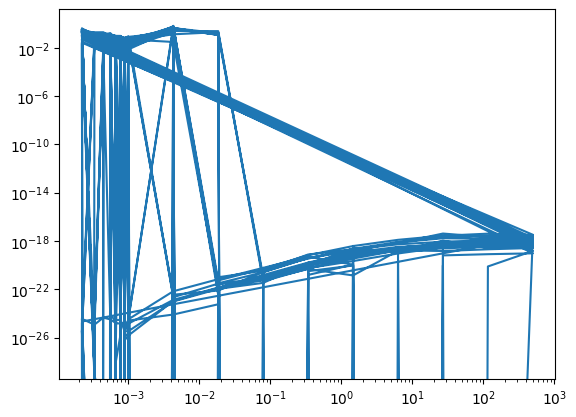

In [57]:
plt.plot(np.array(res["lo_deep_Ask->lo_deep_Ask"])[:,0], np.array(res["lo_deep_Ask->lo_deep_Ask"])[:,1])
plt.xscale("log")
plt.yscale("log")

In [19]:
mat = np.zeros((12,12))
for i in range(len(cols)):
    for j in range(len(cols)):
        mat[i][j] = np.average(norms[cols[i]+"->"+cols[j]])
# mat[:,5] = mat[:,5]*(0.0169)**0.7479
# mat[:,6] = mat[:,6]*(0.0169)**0.7479

In [20]:
mat

array([[ 6.69628096e-01,  8.70093529e-10, -4.23977860e-10,
        -6.62289509e-01, -3.81437954e-10,  5.04041073e+00,
        -8.72153317e+00, -6.60432094e-10,  2.29294209e-01,
         3.81722109e-01, -6.76927688e-01, -6.50437202e-01],
       [ 6.55370806e-01,  7.20056134e-01, -1.63104611e-10,
         2.25693069e-01, -1.37303711e-10, -8.84043074e+00,
         4.70849390e+00, -1.95180103e-10, -6.06062185e-01,
         1.50170436e-09,  6.72789577e-01,  6.52072472e-01],
       [-6.48233252e-01,  2.67604245e-10,  5.92562309e-01,
        -6.50492943e-01,  4.55452232e-11, -7.47812680e-09,
        -8.74468173e+00,  4.90206083e-11, -6.05952076e-01,
         5.41803695e-11,  5.65428958e-01,  5.79575027e-11],
       [ 6.56165188e-01,  5.19740383e-01, -5.75370314e-01,
         6.73662727e-01,  1.20011719e-10, -6.68666681e-09,
         2.33291201e+00,  1.17800070e-10,  2.25293586e-01,
         4.76815610e-11,  1.38871037e-11,  1.85023427e-11],
       [ 7.84040194e-11,  2.73479529e-10, -7.8305269

In [21]:
with open("/SAN/fca/Konark_PhD_Experiments/extracted/INTC.OQ_Params_2019-01-02_2019-03-29_dictTOD", "rb") as f:
    tod = pickle.load(f)

In [11]:
with open("/SAN/fca/Konark_PhD_Experiments/extracted/AAPL.OQ_ParamsInferredWCutoff_2019-01-02_2019-03-31_CLSLogLin_10", "rb") as f:
    params = pickle.load(f)
mat = np.zeros((12,12))
for i in range(12):
        for j in range(12):
            kernelParams = params.get(cols[i] + "->" + cols[j], None)
            if kernelParams is None: continue
            if np.isnan(kernelParams[1][2]): continue
            # print(cols[i] + "->" + cols[j])
            # print((kernelParams[0]*np.exp(kernelParams[1][0]) , kernelParams[1][1] , kernelParams[1][2]))
            # todMult = tod[cols[j]][0]
            mat[i][j]  = kernelParams[0]*kernelParams[1][0]/((-1 + kernelParams[1][1])*kernelParams[1][2]) # alpha/(beta -1)*gamma]

5101.228313363821
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 1.57969914e+03]
 [5.00000000e-04 1.78820460e+03]
 ...
 [2.17500738e+01 5.56144967e+03]
 [9.34593984e+01 5.56144967e+03]
 [4.01632353e+02 5.56144967e+03]]


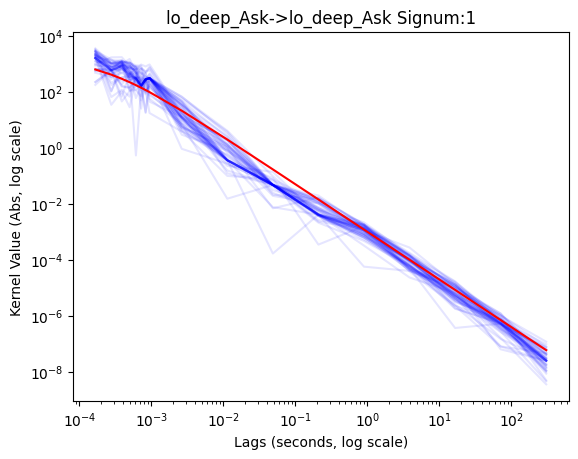

1.1646127050701956e-07
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 1.93743146e-08]
 [5.00000000e-04 3.09942553e-08]
 ...
 [2.17500738e+01 1.14221631e-07]
 [9.34593984e+01 1.14221631e-07]
 [4.01632353e+02 1.14221631e-07]]


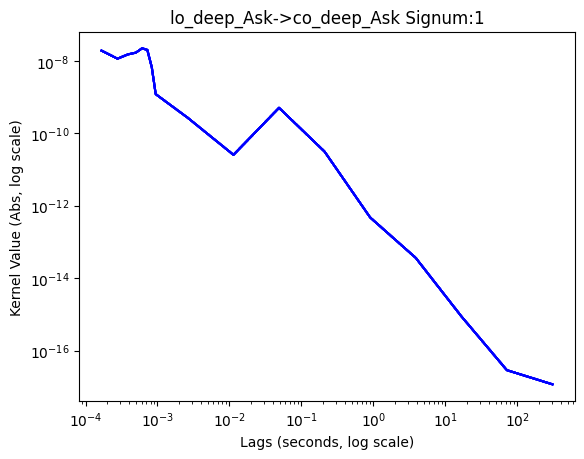

7.346800745087002e-08
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 1.66337757e-08]
 [5.00000000e-04 3.44631957e-08]
 ...
 [2.17500738e+01 7.20555267e-08]
 [9.34593984e+01 7.20551852e-08]
 [4.01632353e+02 7.20551612e-08]]


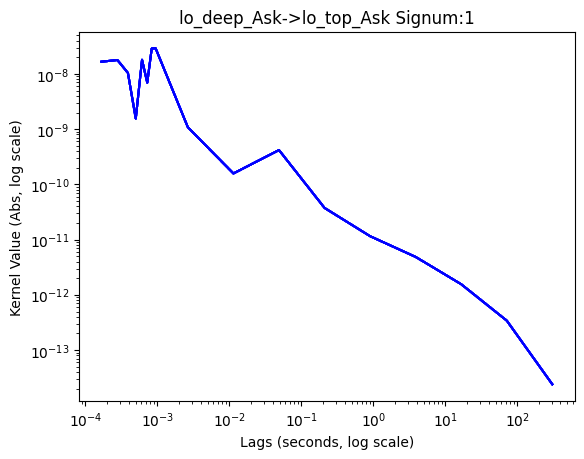

-3386.6024616032896
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -7.91831339e-04]
 [ 5.00000000e-04 -1.60013620e-03]
 ...
 [ 2.17500738e+01 -3.07430522e+03]
 [ 9.34593984e+01 -3.07430522e+03]
 [ 4.01632353e+02 -3.07430522e+03]]


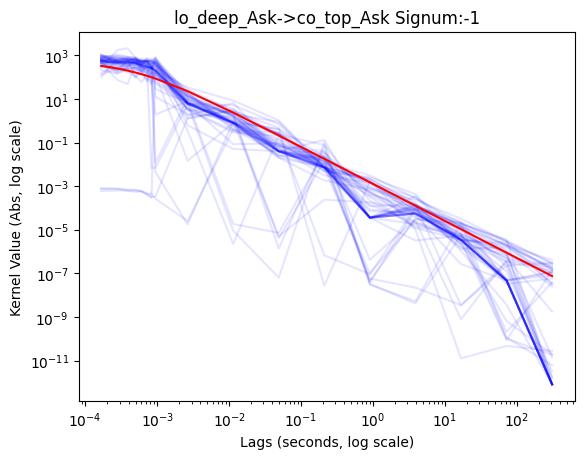

-1.8402840226850317e-23
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -2.10009234e-22]
 [ 5.00000000e-04 -3.94325391e-22]
 ...
 [ 2.17500738e+01  1.00386957e-21]
 [ 9.34593984e+01  1.00386992e-21]
 [ 4.01632353e+02  1.00386994e-21]]


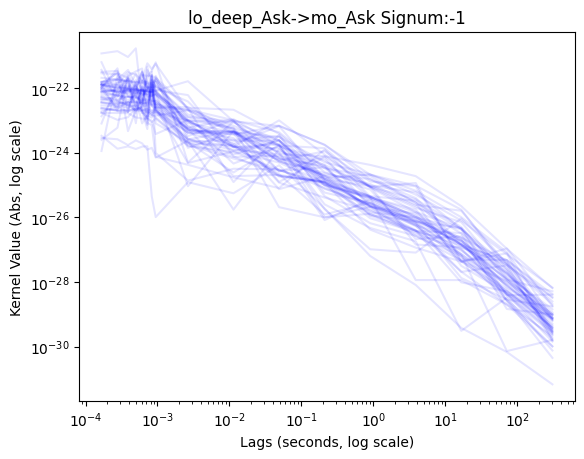

51063.153314394134
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 2.37490210e+04]
 [5.00000000e-04 3.68899318e+04]
 ...
 [2.17500738e+01 4.73594352e+04]
 [9.34593984e+01 4.73594352e+04]
 [4.01632353e+02 4.73594352e+04]]


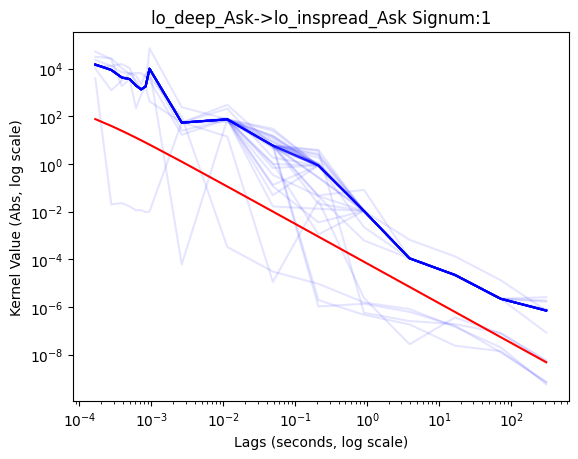

-37112.28983585244
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -6.24727501e+03]
 [ 5.00000000e-04 -1.17919769e+04]
 ...
 [ 2.17500738e+01 -1.70590801e+04]
 [ 9.34593984e+01 -1.70590801e+04]
 [ 4.01632353e+02 -1.70590801e+04]]


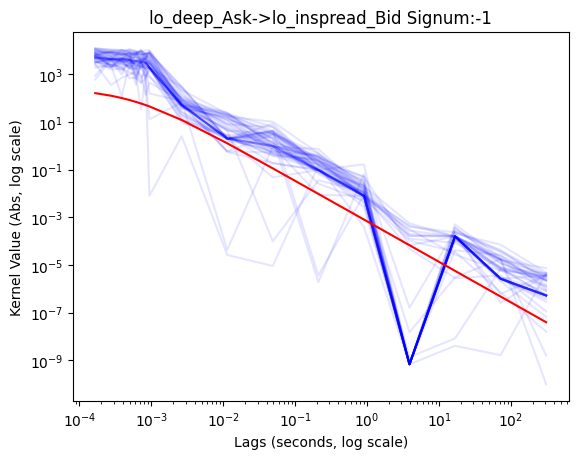

1.907636671052337e-06
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 3.42057717e-07]
 [5.00000000e-04 4.22092990e-07]
 ...
 [2.17500738e+01 1.87095093e-06]
 [9.34593984e+01 1.87095132e-06]
 [4.01632353e+02 1.87095135e-06]]


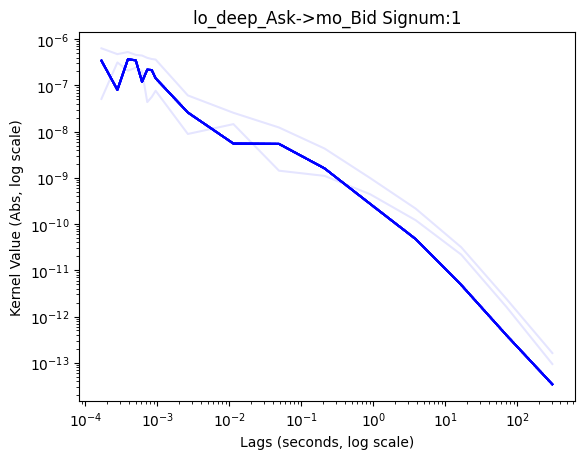

1195.073838332677
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 1.14885038e+02]
 [5.00000000e-04 3.23803785e+02]
 ...
 [2.17500738e+01 1.09954033e+03]
 [9.34593984e+01 1.09954033e+03]
 [4.01632353e+02 1.09954033e+03]]


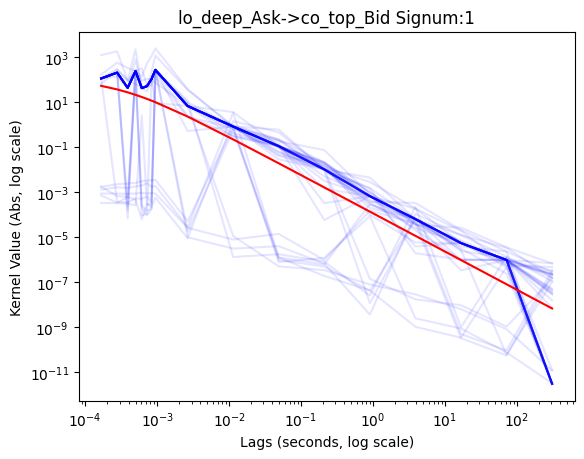

3258.7886513115395
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 4.47105731e+02]
 [5.00000000e-04 1.17927271e+03]
 ...
 [2.17500738e+01 7.32303964e+02]
 [9.34593984e+01 7.32303964e+02]
 [4.01632353e+02 7.32303964e+02]]


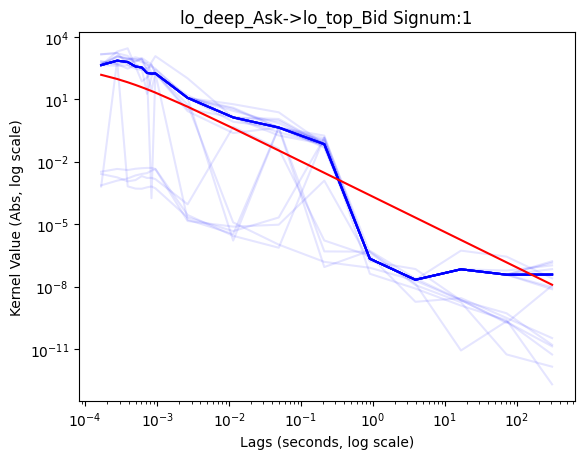

-1531.80402489691
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -3.41947817e+02]
 [ 5.00000000e-04 -7.72903233e+02]
 ...
 [ 2.17500738e+01 -1.13572327e+03]
 [ 9.34593984e+01 -1.13572327e+03]
 [ 4.01632353e+02 -1.13572327e+03]]


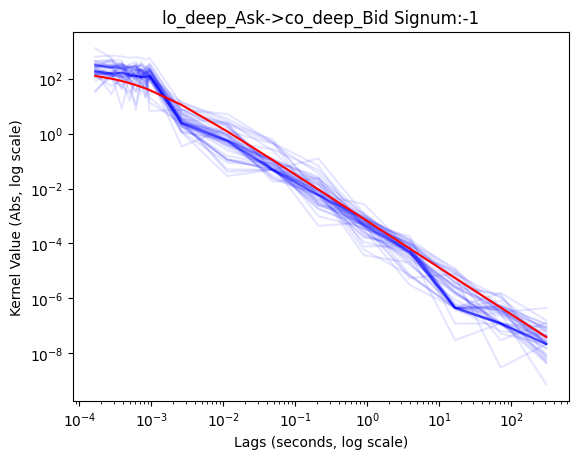

-1476.2975861150662
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -4.97882995e+02]
 [ 5.00000000e-04 -9.74099990e+02]
 ...
 [ 2.17500738e+01 -1.58011214e+03]
 [ 9.34593984e+01 -1.58011214e+03]
 [ 4.01632353e+02 -1.58011214e+03]]


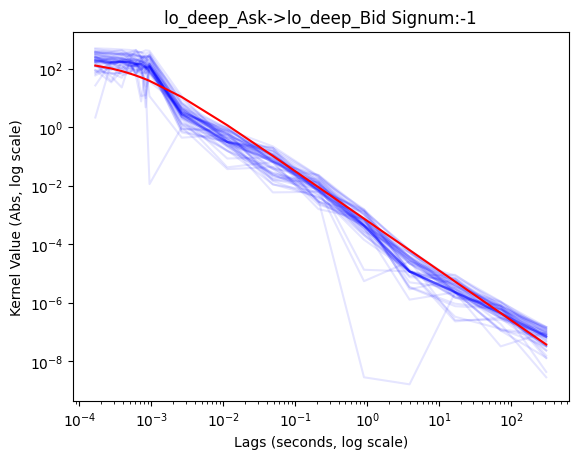

457.15707460012686
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 7.83749770e+01]
 [5.00000000e-04 1.86206467e+02]
 ...
 [2.17500738e+01 4.48400410e+02]
 [9.34593984e+01 4.48400410e+02]
 [4.01632353e+02 4.48400410e+02]]


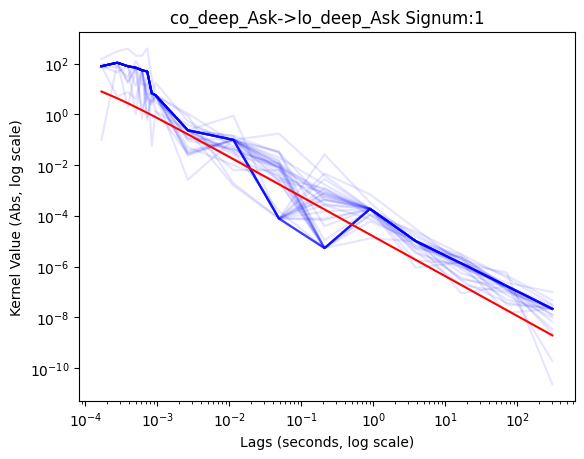

4797.934347237061
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 1.45757405e+03]
 [5.00000000e-04 2.02887301e+03]
 ...
 [2.17500738e+01 5.13751883e+03]
 [9.34593984e+01 5.13751883e+03]
 [4.01632353e+02 5.13751883e+03]]


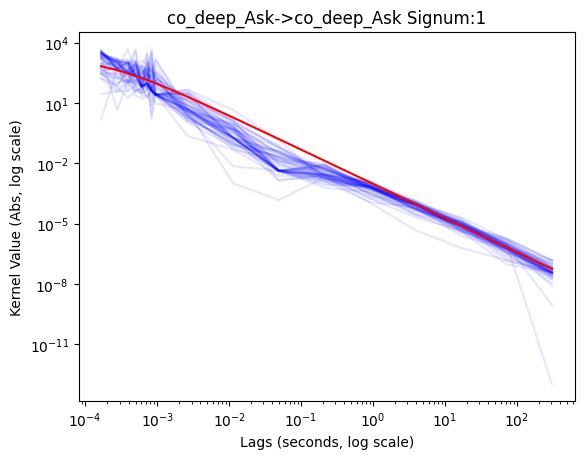

-6.001463066231883e-07
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -1.21794270e-07]
 [ 5.00000000e-04 -2.21847977e-07]
 ...
 [ 2.17500738e+01 -5.88604761e-07]
 [ 9.34593984e+01 -5.88605011e-07]
 [ 4.01632353e+02 -5.88605031e-07]]


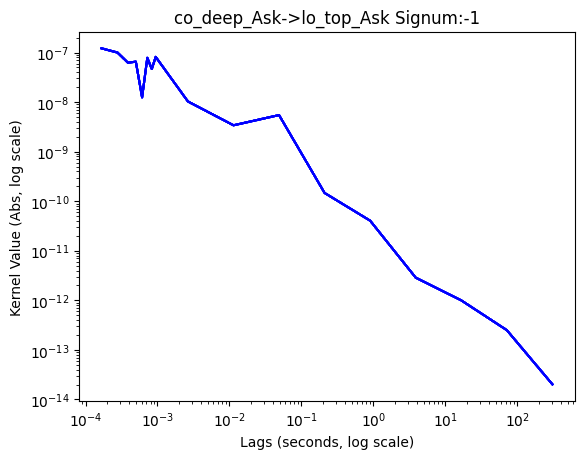

307.250344565271
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 1.89391510e-03]
 [5.00000000e-04 6.90336227e-03]
 ...
 [2.17500738e+01 2.99963651e+02]
 [9.34593984e+01 2.99963651e+02]
 [4.01632353e+02 2.99963651e+02]]


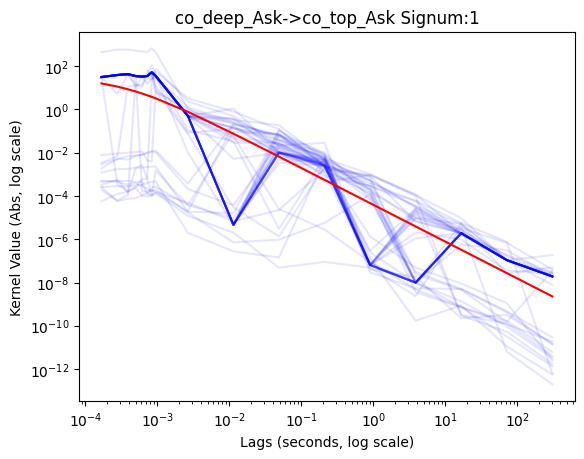

-3.63229025877852e-23
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -2.94599062e-22]
 [ 5.00000000e-04 -5.43015483e-22]
 ...
 [ 2.17500738e+01  7.49995244e-22]
 [ 9.34593984e+01  7.49996125e-22]
 [ 4.01632353e+02  7.49996151e-22]]


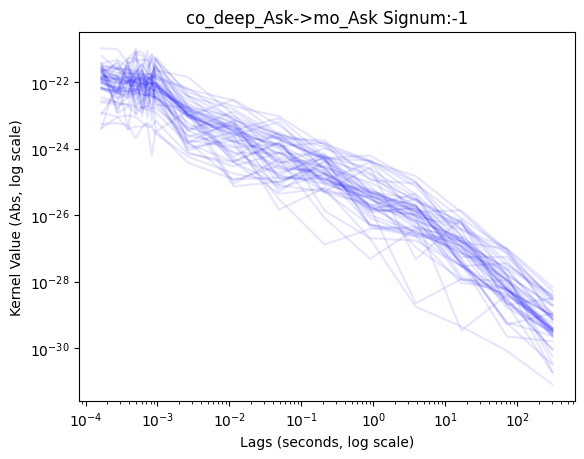

-9855.411630178336
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -2.71844586e+03]
 [ 5.00000000e-04 -4.84258282e+03]
 ...
 [ 2.17500738e+01 -1.61040200e+04]
 [ 9.34593984e+01 -1.61040201e+04]
 [ 4.01632353e+02 -1.61040201e+04]]


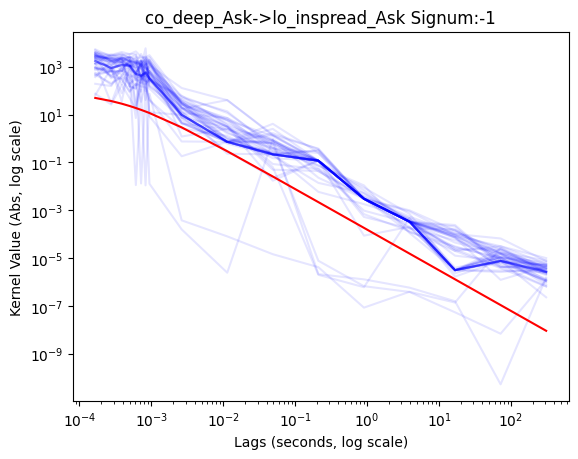

27115.049261776072
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 3.11252310e+04]
 [5.00000000e-04 5.38497665e+04]
 ...
 [2.17500738e+01 2.55924092e+04]
 [9.34593984e+01 2.55924092e+04]
 [4.01632353e+02 2.55924092e+04]]


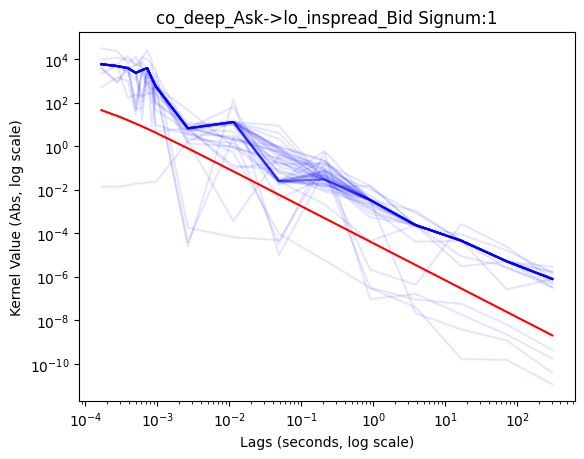

-1.724716080304798e-05
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04  1.56912672e-07]
 [ 5.00000000e-04 -6.41271304e-07]
 ...
 [ 2.17500738e+01 -1.69154852e-05]
 [ 9.34593984e+01 -1.69154847e-05]
 [ 4.01632353e+02 -1.69154846e-05]]


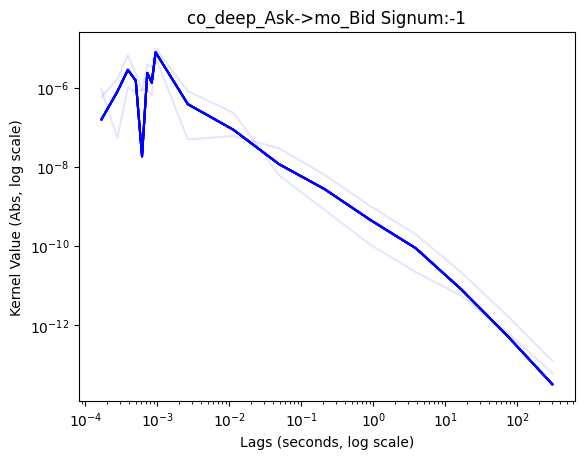

-936.0478027333425
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -3.69260262e+02]
 [ 5.00000000e-04 -5.93617393e+02]
 ...
 [ 2.17500738e+01 -5.98720621e+02]
 [ 9.34593984e+01 -5.98720624e+02]
 [ 4.01632353e+02 -5.98720625e+02]]


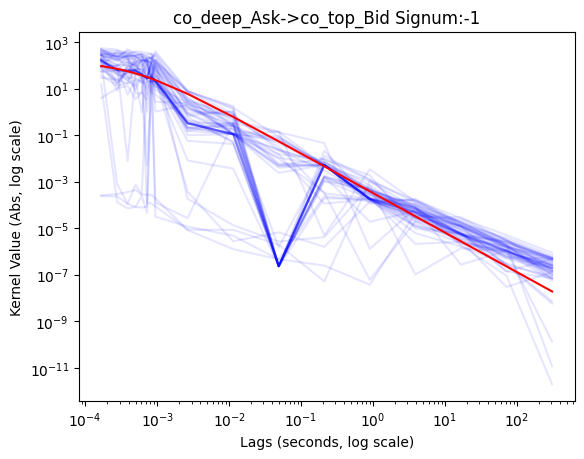

6.723628927750454e-05
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04  3.02218678e-06]
 [ 5.00000000e-04  7.96509271e-06]
 ...
 [ 2.17500738e+01 -2.63595661e-06]
 [ 9.34593984e+01 -2.63595687e-06]
 [ 4.01632353e+02 -2.63595688e-06]]


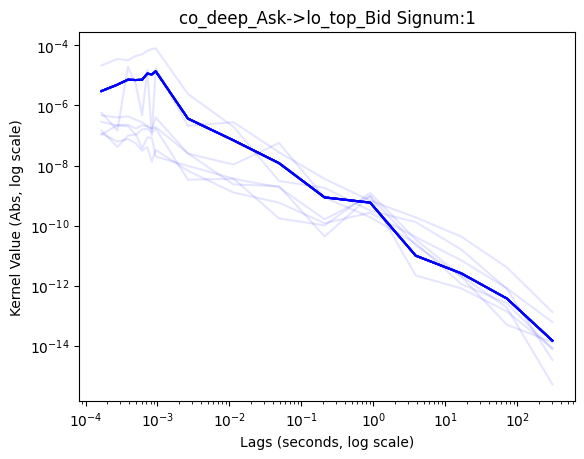

736.3289331208528
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 2.62669104e+01]
 [5.00000000e-04 1.59678336e+02]
 ...
 [2.17500738e+01 7.71751542e+02]
 [9.34593984e+01 7.71751543e+02]
 [4.01632353e+02 7.71751543e+02]]


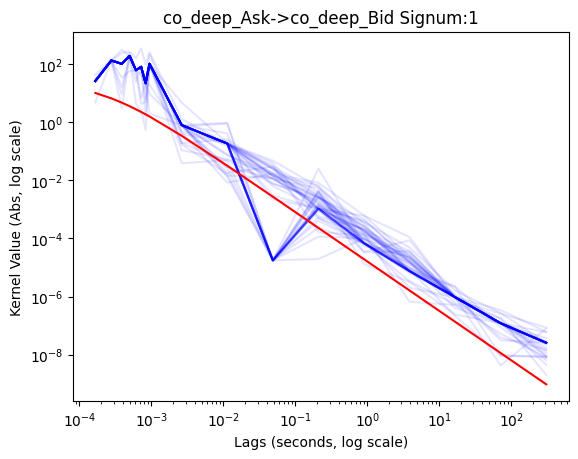

1404.883939691459
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 3.62320261e+02]
 [5.00000000e-04 4.88390115e+02]
 ...
 [2.17500738e+01 1.37808261e+03]
 [9.34593984e+01 1.37808261e+03]
 [4.01632353e+02 1.37808261e+03]]


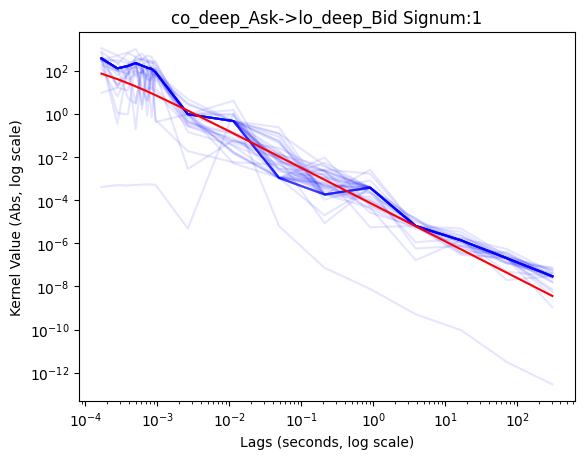

-831.8106311419714
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -2.14531477e+02]
 [ 5.00000000e-04 -3.65321117e+02]
 ...
 [ 2.17500738e+01 -5.66162027e+02]
 [ 9.34593984e+01 -5.66162027e+02]
 [ 4.01632353e+02 -5.66162027e+02]]


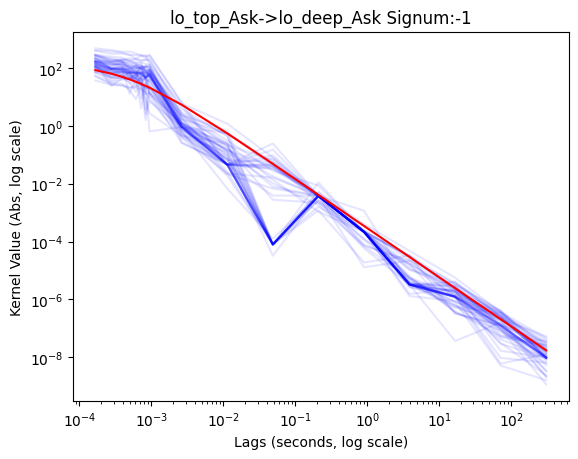

-2.337576358711076e-09
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -1.28872613e-08]
 [ 5.00000000e-04 -1.86617105e-08]
 ...
 [ 2.17500738e+01 -2.29262350e-09]
 [ 9.34593984e+01 -2.29262297e-09]
 [ 4.01632353e+02 -2.29262297e-09]]


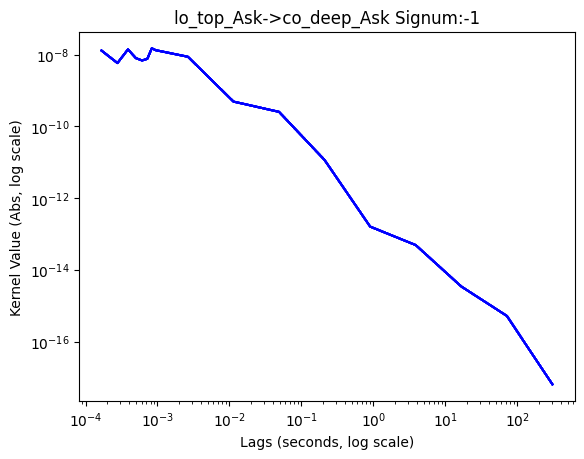

5274.875191762512
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 3.29561548e+03]
 [5.00000000e-04 3.70401129e+03]
 ...
 [2.17500738e+01 5.69493122e+03]
 [9.34593984e+01 5.69493122e+03]
 [4.01632353e+02 5.69493122e+03]]


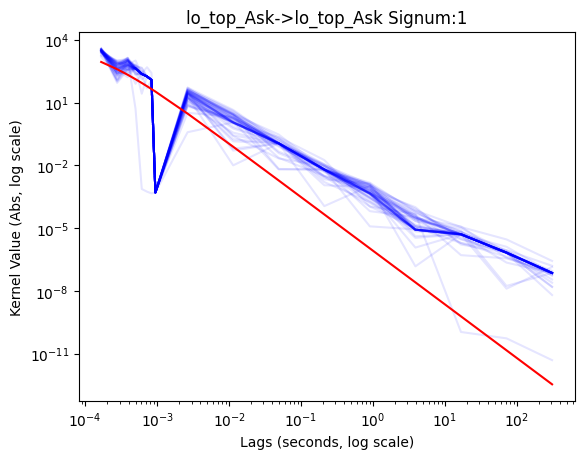

-2961.0550594470524
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -5.98183965e+02]
 [ 5.00000000e-04 -1.03974804e+03]
 ...
 [ 2.17500738e+01 -3.38072122e+03]
 [ 9.34593984e+01 -3.38072122e+03]
 [ 4.01632353e+02 -3.38072122e+03]]


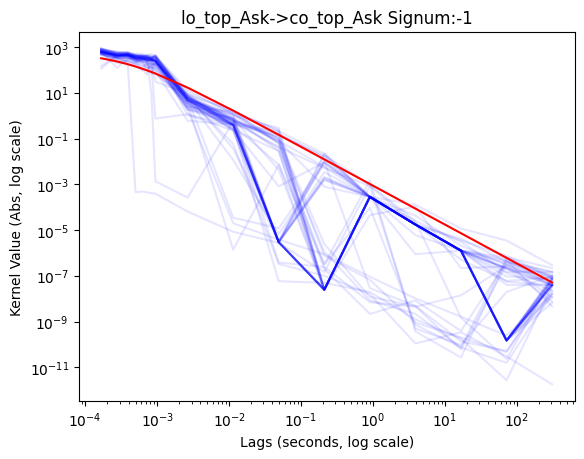

-2.125065471934134e-22
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -2.09700219e-22]
 [ 5.00000000e-04 -3.58220490e-22]
 ...
 [ 2.17500738e+01  2.30587404e-21]
 [ 9.34593984e+01  2.30587418e-21]
 [ 4.01632353e+02  2.30587419e-21]]


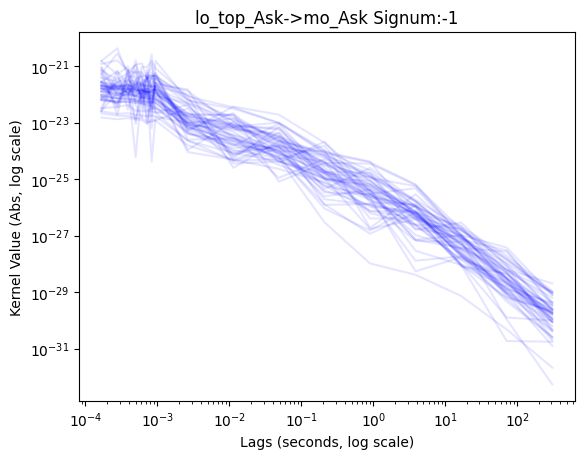

2.87229812965001e-07
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 1.92603058e-06]
 [5.00000000e-04 2.74548270e-06]
 ...
 [2.17500738e+01 2.81708062e-07]
 [9.34593984e+01 2.81706153e-07]
 [4.01632353e+02 2.81706163e-07]]


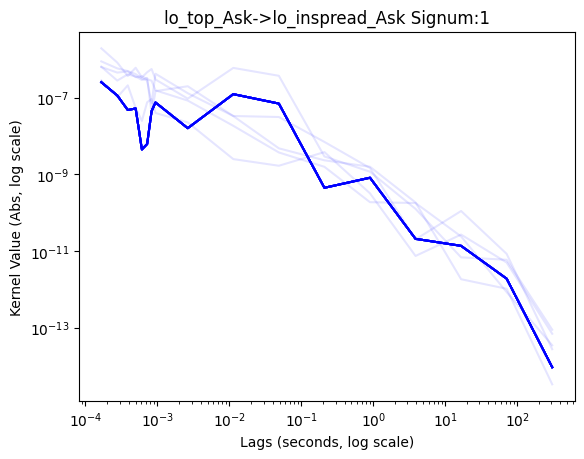

-28927.36059861117
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -5.26529746e+03]
 [ 5.00000000e-04 -9.25653352e+03]
 ...
 [ 2.17500738e+01 -3.98513247e+04]
 [ 9.34593984e+01 -3.98513247e+04]
 [ 4.01632353e+02 -3.98513247e+04]]


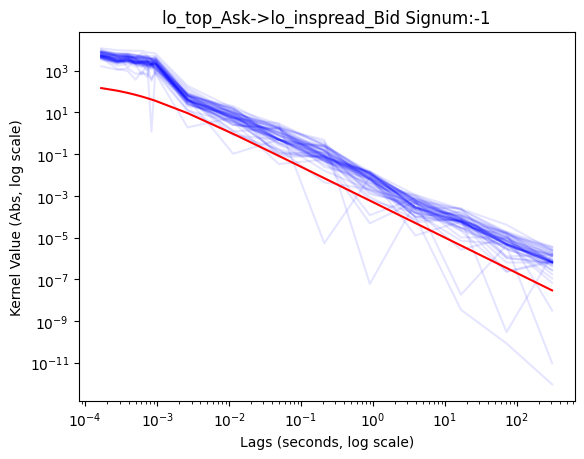

6.698076001262756e-06
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 1.55709950e-06]
 [5.00000000e-04 2.69342090e-06]
 ...
 [2.17500738e+01 6.56926657e-06]
 [9.34593984e+01 6.56926683e-06]
 [4.01632353e+02 6.56926685e-06]]


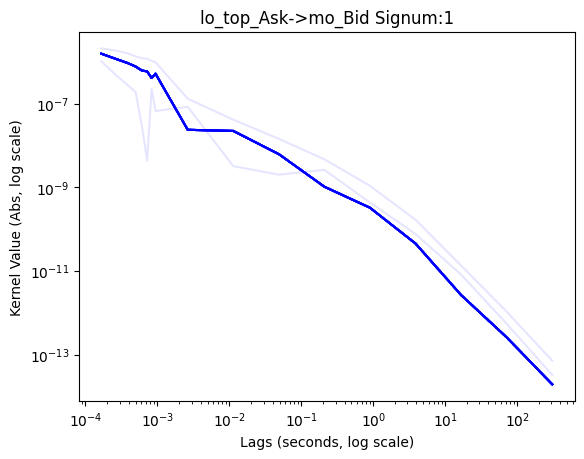

-3118.613810532553
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -7.58785626e+02]
 [ 5.00000000e-04 -1.36540553e+03]
 ...
 [ 2.17500738e+01 -3.19117555e+03]
 [ 9.34593984e+01 -3.19117555e+03]
 [ 4.01632353e+02 -3.19117555e+03]]


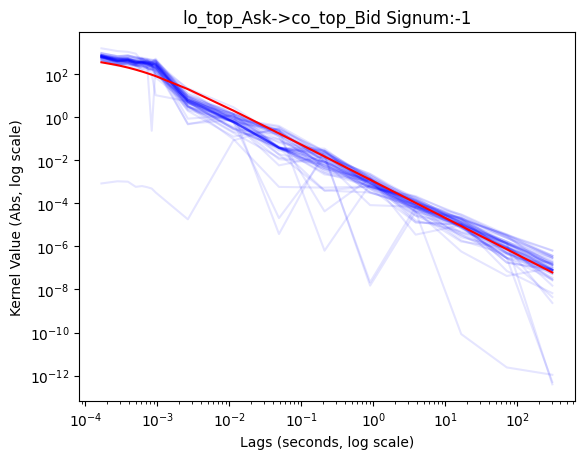

0.00011299825761371331
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04  1.10950598e-05]
 [ 5.00000000e-04  2.54599746e-05]
 ...
 [ 2.17500738e+01 -3.73079826e-06]
 [ 9.34593984e+01 -3.73079840e-06]
 [ 4.01632353e+02 -3.73079841e-06]]


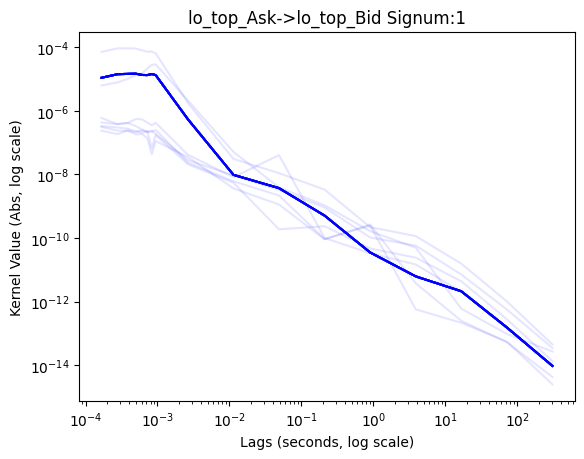

5223.798651159723
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -1.86757533e-21]
 [ 5.00000000e-04  3.46024874e+02]
 ...
 [ 2.17500738e+01  6.27051830e+03]
 [ 9.34593984e+01  6.27051830e+03]
 [ 4.01632353e+02  6.27051830e+03]]


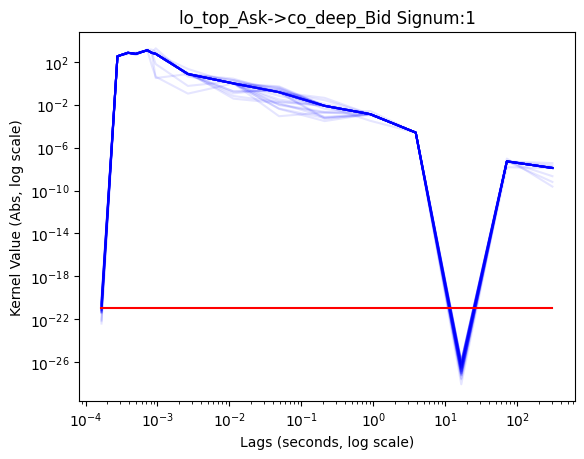

-6.443401778764957e-08
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04  2.68958160e-09]
 [ 5.00000000e-04  5.20035691e-08]
 ...
 [ 2.17500738e+01 -6.31949023e-08]
 [ 9.34593984e+01 -6.31949021e-08]
 [ 4.01632353e+02 -6.31949021e-08]]


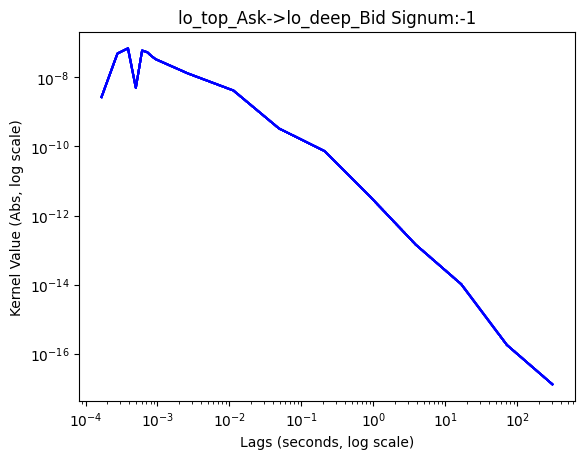

3181.834934453715
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 2.63171135e+03]
 [5.00000000e-04 3.79231101e+03]
 ...
 [2.17500738e+01 3.12030590e+03]
 [9.34593984e+01 3.12030590e+03]
 [4.01632353e+02 3.12030590e+03]]


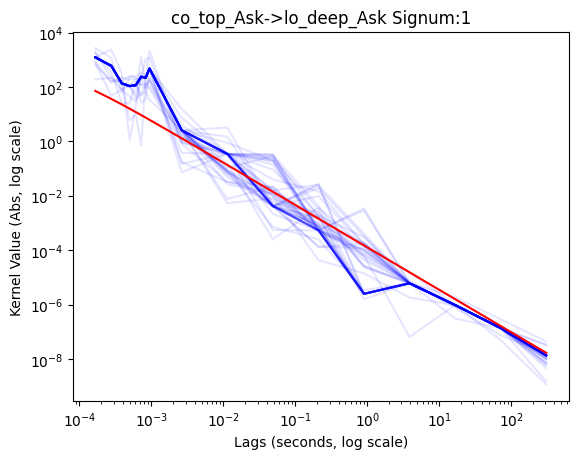

392.4319256659535
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 4.70708582e+00]
 [5.00000000e-04 1.91614768e+01]
 ...
 [2.17500738e+01 3.78007554e+02]
 [9.34593984e+01 3.78007554e+02]
 [4.01632353e+02 3.78007554e+02]]


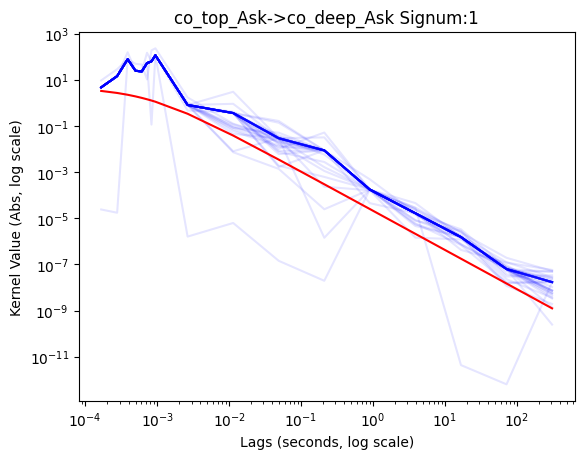

-1895.6984806114228
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -6.58466568e+02]
 [ 5.00000000e-04 -1.12749223e+03]
 ...
 [ 2.17500738e+01 -1.84868307e+03]
 [ 9.34593984e+01 -1.84868307e+03]
 [ 4.01632353e+02 -1.84868307e+03]]


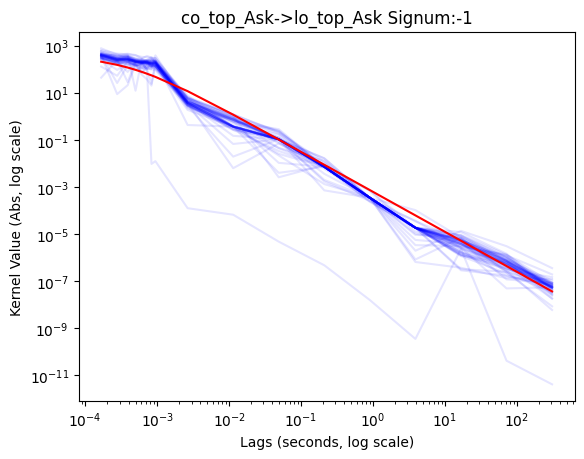

5960.185055598397
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 2.70407808e+02]
 [5.00000000e-04 6.36473362e+02]
 ...
 [2.17500738e+01 5.93063799e+03]
 [9.34593984e+01 5.93063799e+03]
 [4.01632353e+02 5.93063799e+03]]


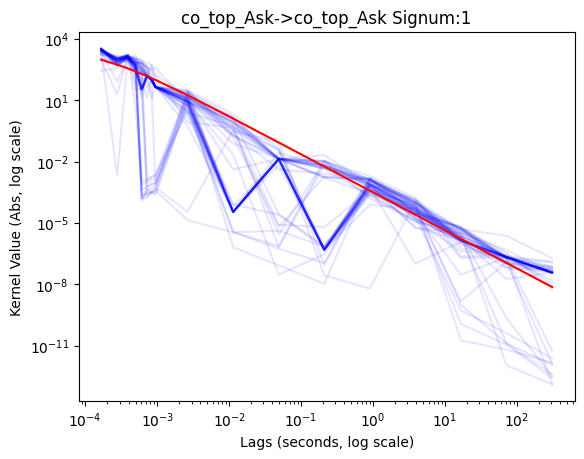

1.0177492806355999e-22
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -4.90227238e-22]
 [ 5.00000000e-04 -8.18694739e-22]
 ...
 [ 2.17500738e+01  7.60148224e-22]
 [ 9.34593984e+01  7.60148398e-22]
 [ 4.01632353e+02  7.60148408e-22]]


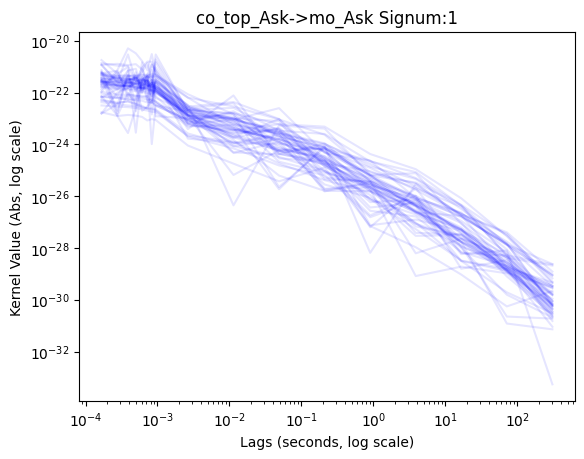

-0.00010298668953887463
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -3.27853717e-05]
 [ 5.00000000e-04 -7.79482261e-05]
 ...
 [ 2.17500738e+01 -1.01006176e-04]
 [ 9.34593984e+01 -1.01006176e-04]
 [ 4.01632353e+02 -1.01006176e-04]]


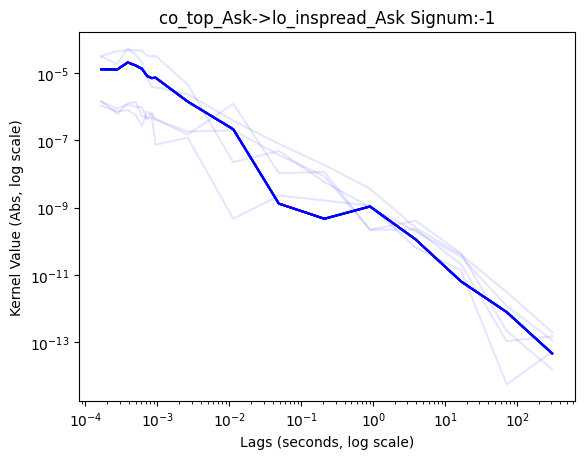

963.8531839920471
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 4.35934295e+02]
 [5.00000000e-04 4.35937994e+02]
 ...
 [2.17500738e+01 2.15970505e+00]
 [9.34593984e+01 2.15970505e+00]
 [4.01632353e+02 2.15970505e+00]]


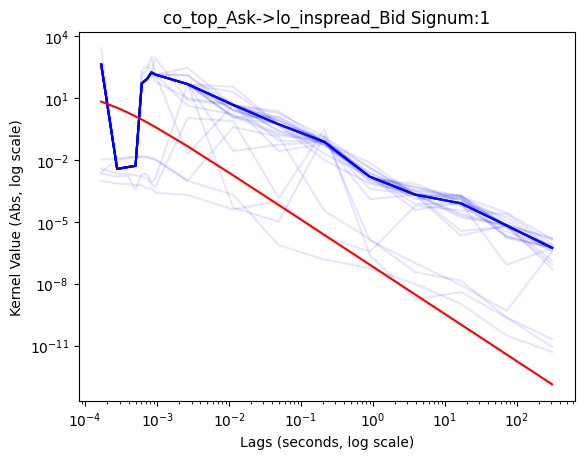

-8.540416219067993e-06
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04  4.97801410e-07]
 [ 5.00000000e-04  5.98024227e-07]
 ...
 [ 2.17500738e+01 -8.37617775e-06]
 [ 9.34593984e+01 -8.37617747e-06]
 [ 4.01632353e+02 -8.37617745e-06]]


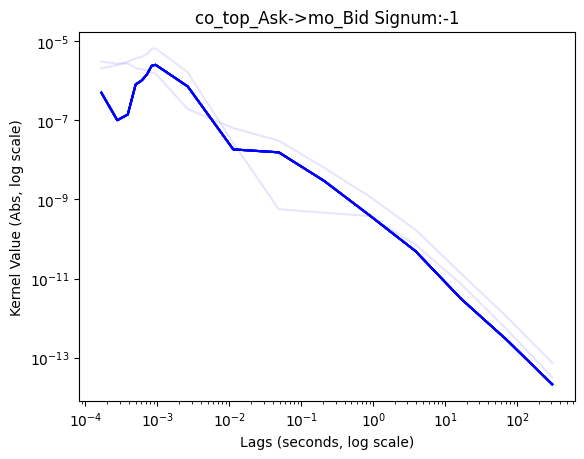

35.77773227050837
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -1.42095912e-03]
 [ 5.00000000e-04  2.55783935e+00]
 ...
 [ 2.17500738e+01  3.43460627e+01]
 [ 9.34593984e+01  3.43460638e+01]
 [ 4.01632353e+02  3.43460639e+01]]


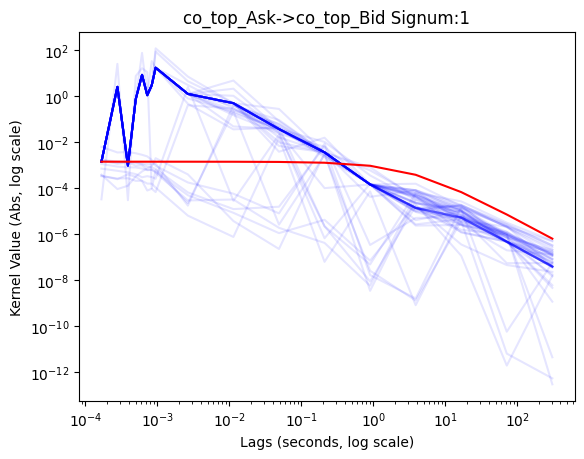

-1.1332380474983375e-05
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -2.36665592e-06]
 [ 5.00000000e-04 -4.13822083e-06]
 ...
 [ 2.17500738e+01 -3.70633341e-07]
 [ 9.34593984e+01 -3.70633522e-07]
 [ 4.01632353e+02 -3.70633533e-07]]


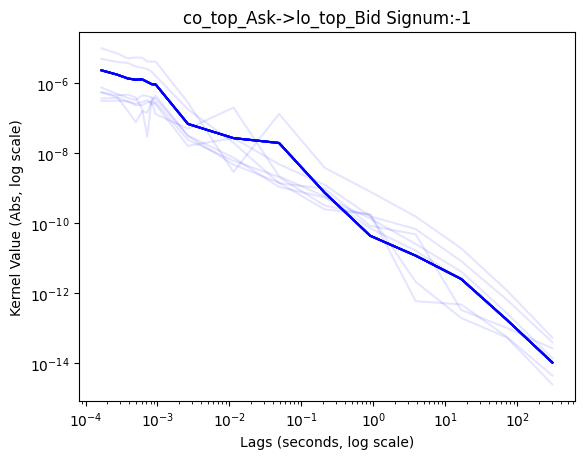

-5.796271796385555e-22
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04  5.01294561e-20]
 [ 5.00000000e-04  3.38445537e-20]
 ...
 [ 2.17500738e+01 -2.28468040e-20]
 [ 9.34593984e+01 -2.28468042e-20]
 [ 4.01632353e+02 -2.28468042e-20]]


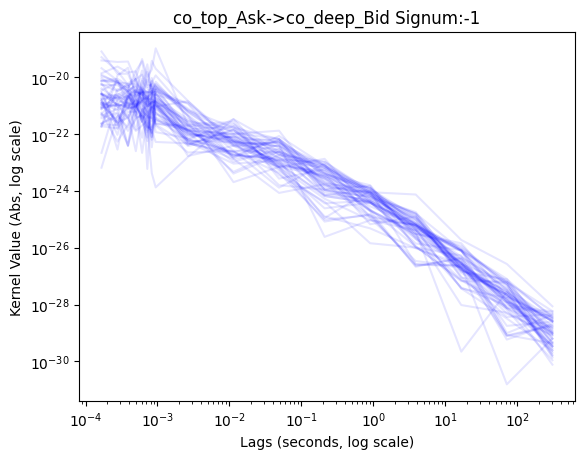

-7.132504610959807e-07
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -1.68801856e-07]
 [ 5.00000000e-04 -3.04119806e-07]
 ...
 [ 2.17500738e+01 -6.99534106e-07]
 [ 9.34593984e+01 -6.99534106e-07]
 [ 4.01632353e+02 -6.99534106e-07]]


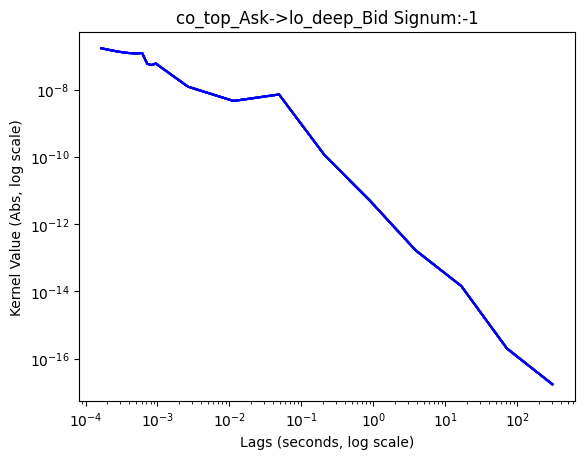

-1.5448433393112459e-22
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 1.46612614e-21]
 [5.00000000e-04 2.23998213e-21]
 ...
 [2.17500738e+01 9.91231387e-21]
 [9.34593984e+01 9.91231405e-21]
 [4.01632353e+02 9.91231405e-21]]


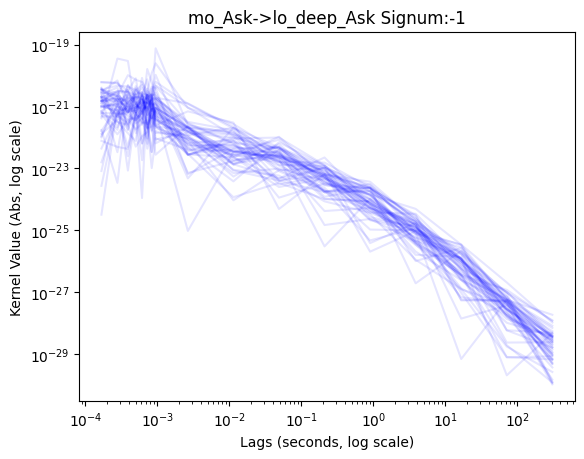

1.1305561123084004e-07
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 3.52309467e-09]
 [5.00000000e-04 1.83179054e-08]
 ...
 [2.17500738e+01 1.10881465e-07]
 [9.34593984e+01 1.10881465e-07]
 [4.01632353e+02 1.10881465e-07]]


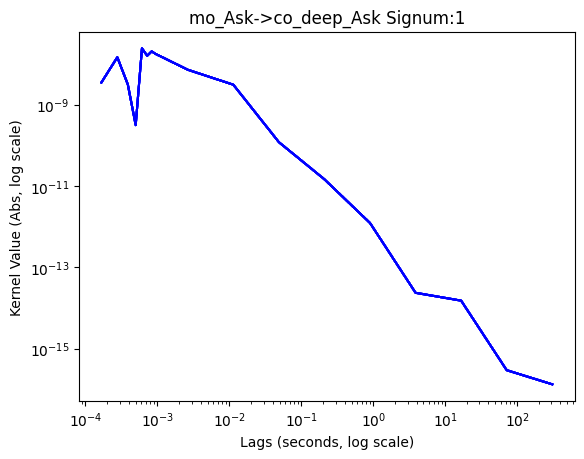

2.783754422719242e-05
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 5.60743408e-06]
 [5.00000000e-04 1.00814590e-05]
 ...
 [2.17500738e+01 2.73022070e-05]
 [9.34593984e+01 2.73022068e-05]
 [4.01632353e+02 2.73022068e-05]]


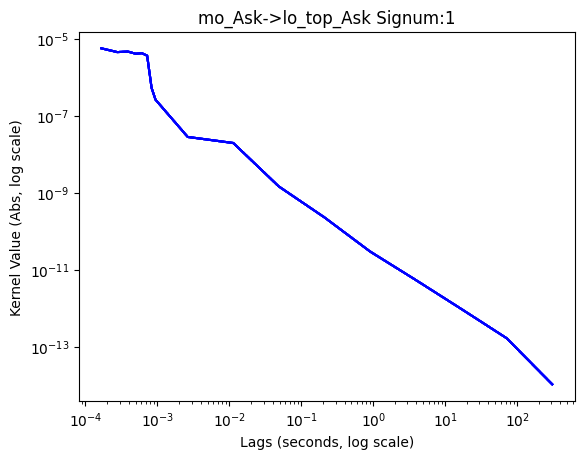

7.972615776341263e-06
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 7.59238446e-06]
 [5.00000000e-04 1.43226749e-05]
 ...
 [2.17500738e+01 7.81929635e-06]
 [9.34593984e+01 7.81929625e-06]
 [4.01632353e+02 7.81929624e-06]]


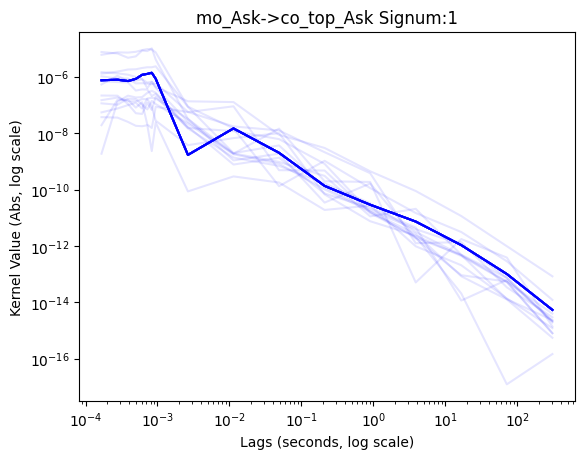

4679.986437968868
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 1.71619809e+03]
 [5.00000000e-04 2.46984261e+03]
 ...
 [2.17500738e+01 5.33915878e+03]
 [9.34593984e+01 5.33915878e+03]
 [4.01632353e+02 5.33915878e+03]]


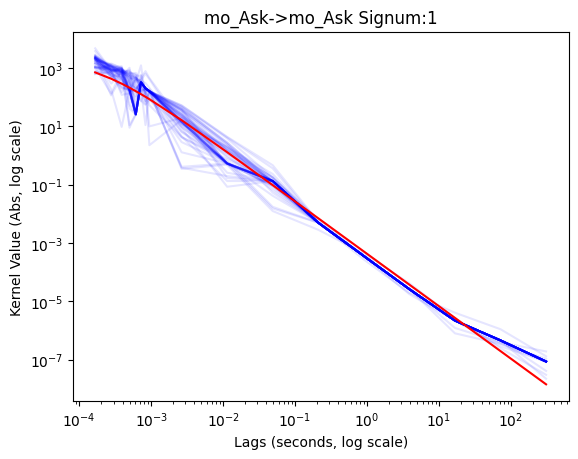

7.879459848647722e-07
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 6.29851077e-07]
 [5.00000000e-04 1.16486520e-06]
 ...
 [2.17500738e+01 7.72796734e-07]
 [9.34593984e+01 7.72793196e-07]
 [4.01632353e+02 7.72793177e-07]]


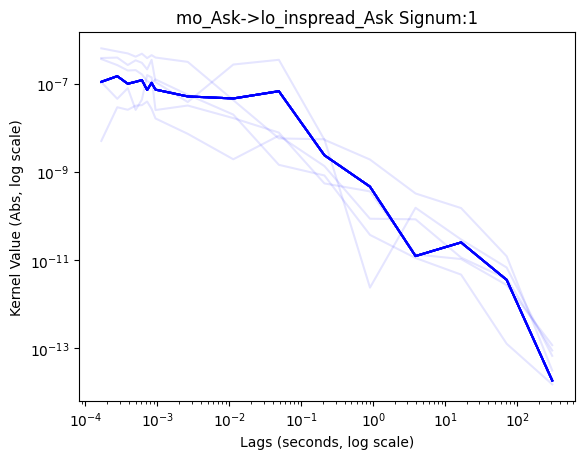

2.706871276496682e-06
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04  2.97578982e-07]
 [ 5.00000000e-04  6.16621477e-07]
 ...
 [ 2.17500738e+01 -4.77519342e-06]
 [ 9.34593984e+01 -4.77519454e-06]
 [ 4.01632353e+02 -4.77519460e-06]]


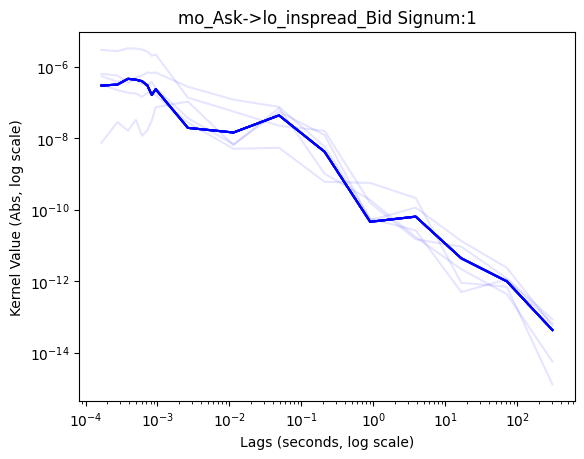

4.891388184708034e-06
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 9.88936880e-07]
 [5.00000000e-04 1.63324499e-06]
 ...
 [2.17500738e+01 4.79732251e-06]
 [9.34593984e+01 4.79732299e-06]
 [4.01632353e+02 4.79732303e-06]]


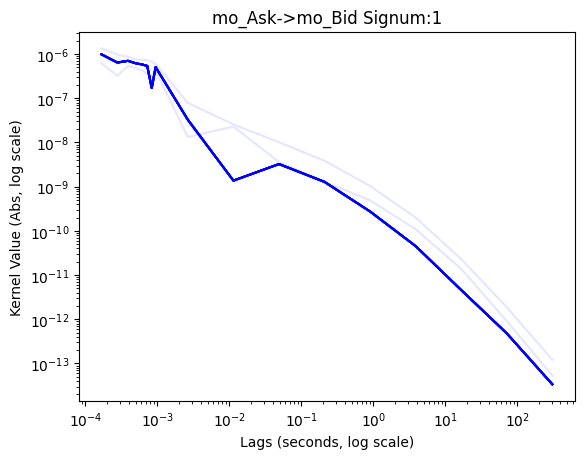

-6.219718691078078e-07
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -3.14241276e-07]
 [ 5.00000000e-04 -4.80610562e-07]
 ...
 [ 2.17500738e+01 -6.10010666e-07]
 [ 9.34593984e+01 -6.10010854e-07]
 [ 4.01632353e+02 -6.10010872e-07]]


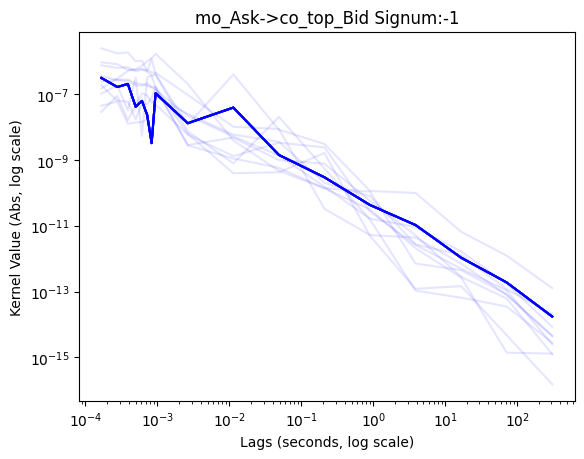

-2.5372646585309615e-06
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -4.61356524e-07]
 [ 5.00000000e-04 -7.74825845e-07]
 ...
 [ 2.17500738e+01 -9.27087513e-07]
 [ 9.34593984e+01 -9.27087704e-07]
 [ 4.01632353e+02 -9.27087716e-07]]


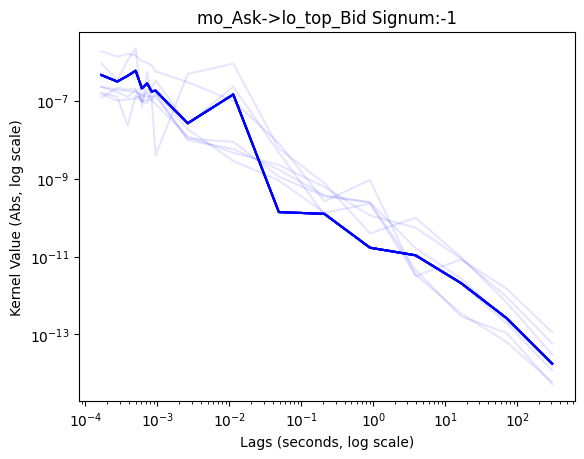

1.398991962051372e-21
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -7.35689918e-24]
 [ 5.00000000e-04  7.85100245e-22]
 ...
 [ 2.17500738e+01 -1.68063500e-20]
 [ 9.34593984e+01 -1.68063498e-20]
 [ 4.01632353e+02 -1.68063498e-20]]


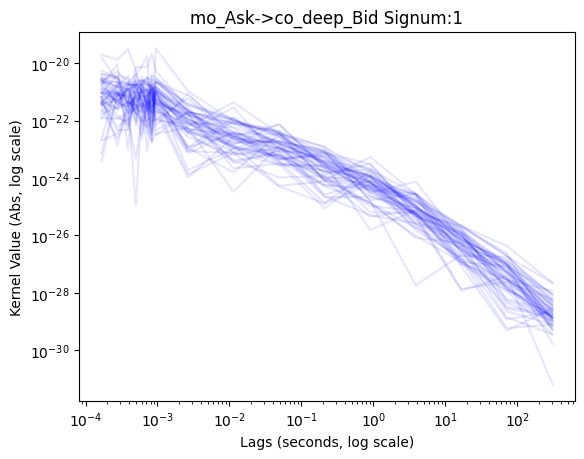

-1.0699040767514326e-07
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -4.01532714e-08]
 [ 5.00000000e-04 -8.48930596e-08]
 ...
 [ 2.17500738e+01 -1.04932899e-07]
 [ 9.34593984e+01 -1.04932900e-07]
 [ 4.01632353e+02 -1.04932900e-07]]


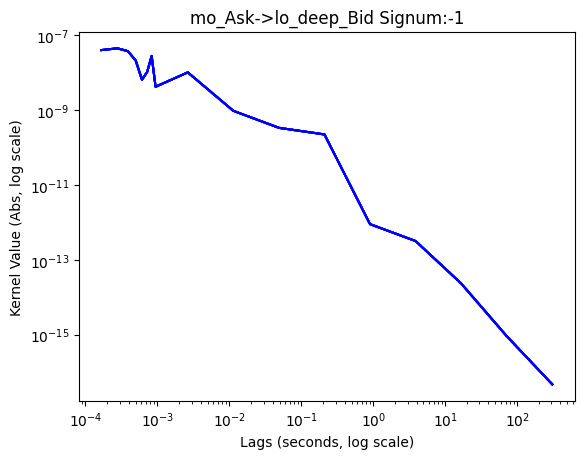

-1176.4567547670067
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -1.66513538e+02]
 [ 5.00000000e-04 -3.00029718e+02]
 ...
 [ 2.17500738e+01 -9.82032575e+02]
 [ 9.34593984e+01 -9.82032575e+02]
 [ 4.01632353e+02 -9.82032575e+02]]


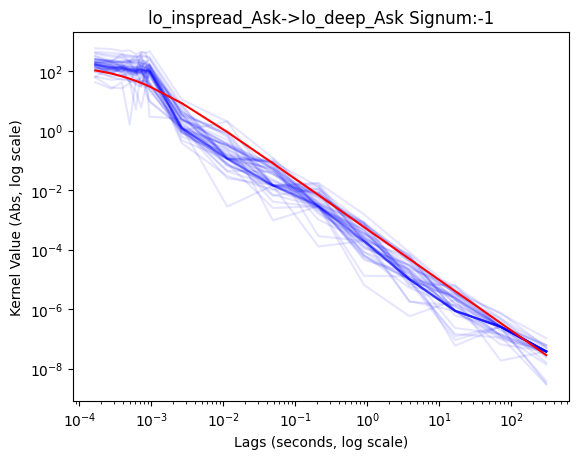

-1239.6600834770088
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -2.52816666e+02]
 [ 5.00000000e-04 -3.47417051e+02]
 ...
 [ 2.17500738e+01 -9.04571472e+02]
 [ 9.34593984e+01 -9.04571472e+02]
 [ 4.01632353e+02 -9.04571472e+02]]


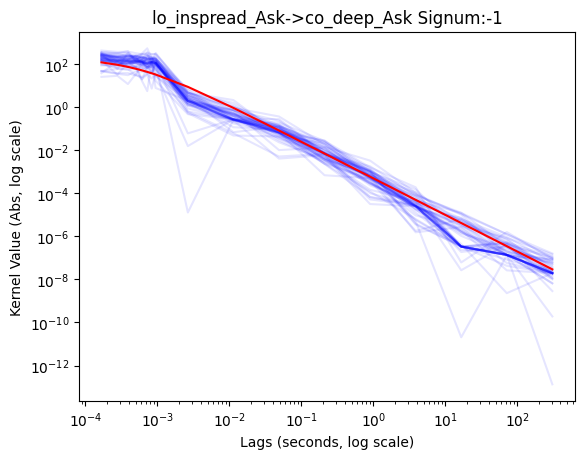

3850.692013346708
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 7.69145523e+02]
 [5.00000000e-04 1.41265412e+03]
 ...
 [2.17500738e+01 3.70539095e+03]
 [9.34593984e+01 3.70539095e+03]
 [4.01632353e+02 3.70539095e+03]]


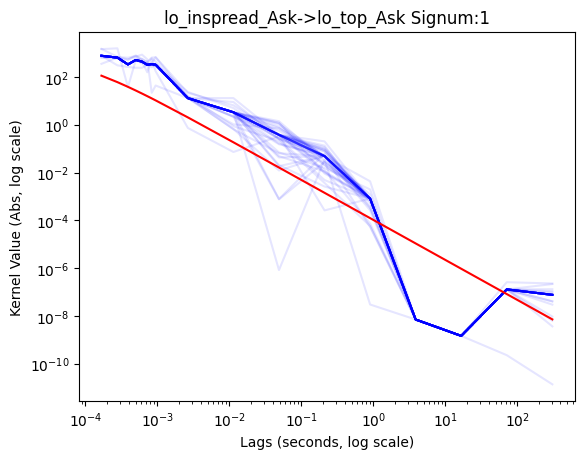

2424.883852342219
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 1.30186104e+03]
 [5.00000000e-04 1.30186044e+03]
 ...
 [2.17500738e+01 5.62505533e+03]
 [9.34593984e+01 5.62505533e+03]
 [4.01632353e+02 5.62505533e+03]]


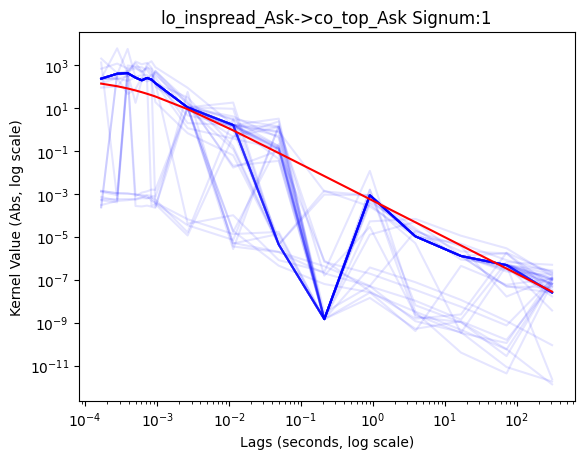

-2.272242737257369e-22
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -3.04324365e-22]
 [ 5.00000000e-04 -5.52816987e-22]
 ...
 [ 2.17500738e+01  7.53745630e-22]
 [ 9.34593984e+01  7.53745870e-22]
 [ 4.01632353e+02  7.53745886e-22]]


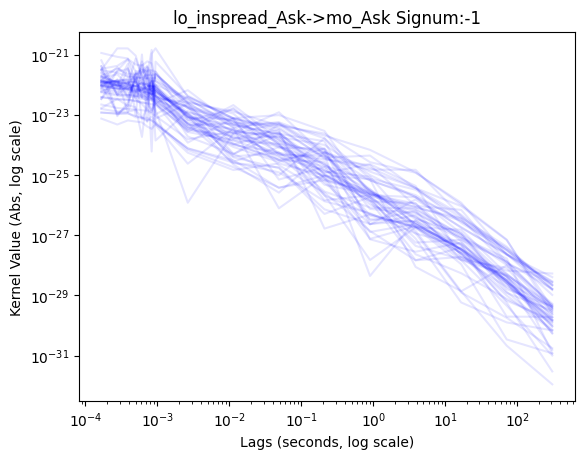

90330.60708533874
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 7.96881241e+03]
 [5.00000000e-04 1.03154323e+04]
 ...
 [2.17500738e+01 8.30433918e+04]
 [9.34593984e+01 8.30433918e+04]
 [4.01632353e+02 8.30433918e+04]]


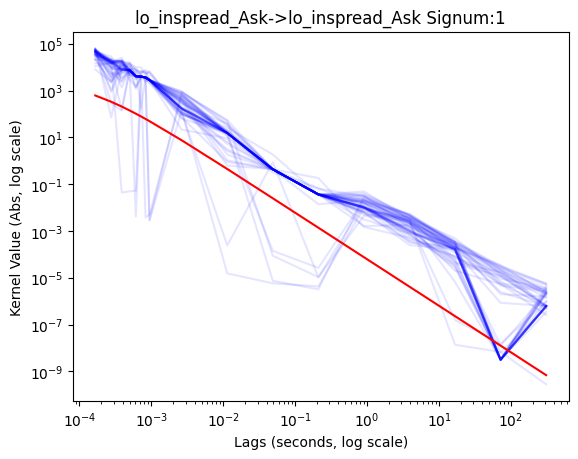

4.454897010986699e-06
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04  2.79841136e-07]
 [ 5.00000000e-04  7.00992476e-07]
 ...
 [ 2.17500738e+01 -5.57383459e-06]
 [ 9.34593984e+01 -5.57383650e-06]
 [ 4.01632353e+02 -5.57383658e-06]]


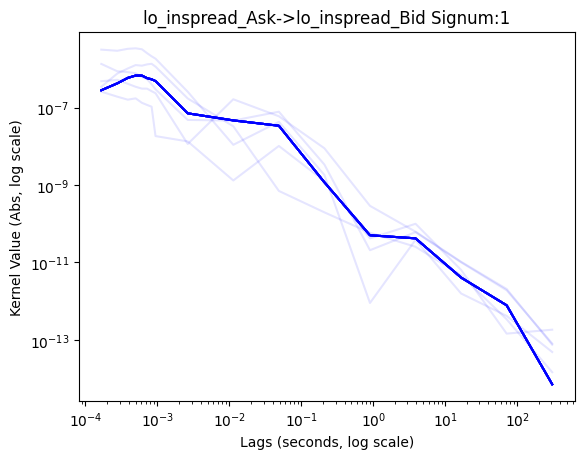

2.6681159618294067e-06
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 6.63550264e-07]
 [5.00000000e-04 1.12942018e-06]
 ...
 [2.17500738e+01 2.61680563e-06]
 [9.34593984e+01 2.61680601e-06]
 [4.01632353e+02 2.61680604e-06]]


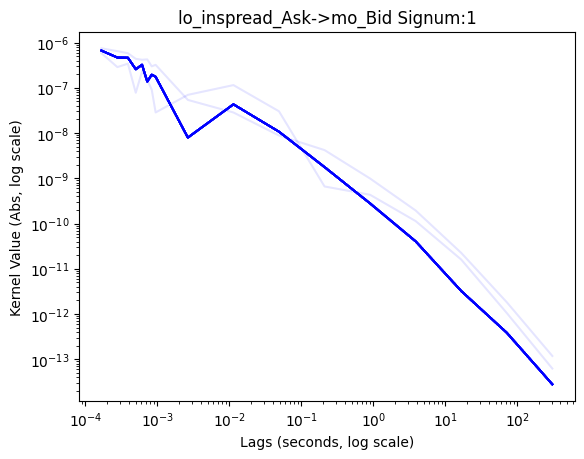

-3949.706499602438
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -5.86817965e+02]
 [ 5.00000000e-04 -1.02957436e+03]
 ...
 [ 2.17500738e+01 -2.47828970e+03]
 [ 9.34593984e+01 -2.47828970e+03]
 [ 4.01632353e+02 -2.47828970e+03]]


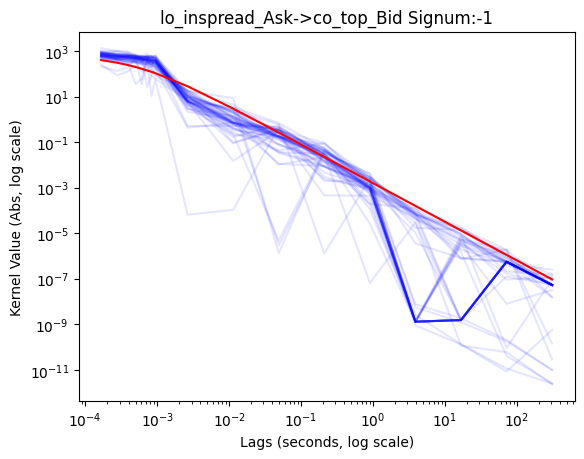

-3.987999568473979e-06
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -7.91136066e-07]
 [ 5.00000000e-04 -1.52600833e-06]
 ...
 [ 2.17500738e+01 -1.15437522e-06]
 [ 9.34593984e+01 -1.15437538e-06]
 [ 4.01632353e+02 -1.15437539e-06]]


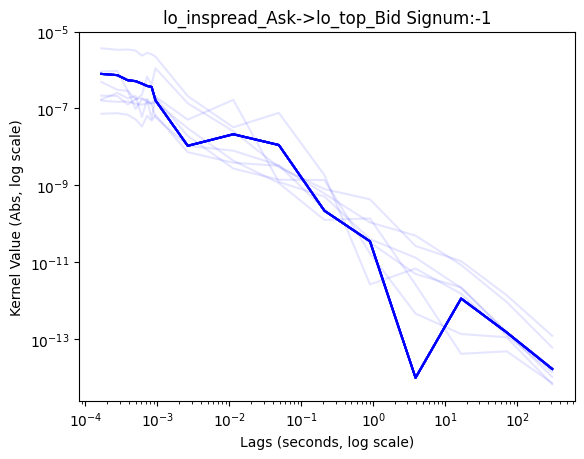

7622.360628924627
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 4.70031998e+03]
 [5.00000000e-04 6.31455912e+03]
 ...
 [2.17500738e+01 7.47577677e+03]
 [9.34593984e+01 7.47577677e+03]
 [4.01632353e+02 7.47577677e+03]]


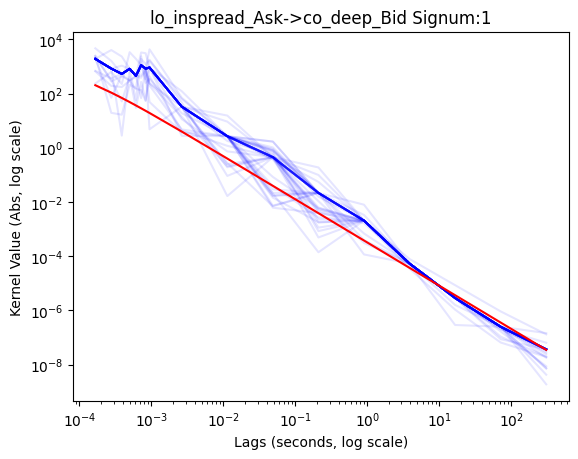

-5.593286061450332e-07
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -1.23866252e-07]
 [ 5.00000000e-04 -1.98216557e-07]
 ...
 [ 2.17500738e+01 -5.48572284e-07]
 [ 9.34593984e+01 -5.48572287e-07]
 [ 4.01632353e+02 -5.48572287e-07]]


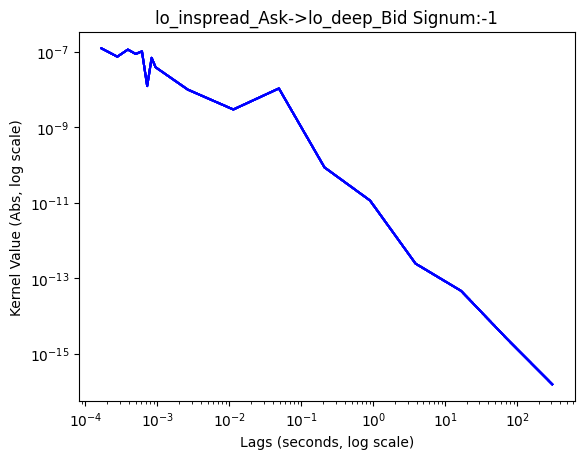

-1045.9103482202013
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -2.04514544e+02]
 [ 5.00000000e-04 -3.67600093e+02]
 ...
 [ 2.17500738e+01 -7.40529858e+02]
 [ 9.34593984e+01 -7.40529858e+02]
 [ 4.01632353e+02 -7.40529858e+02]]


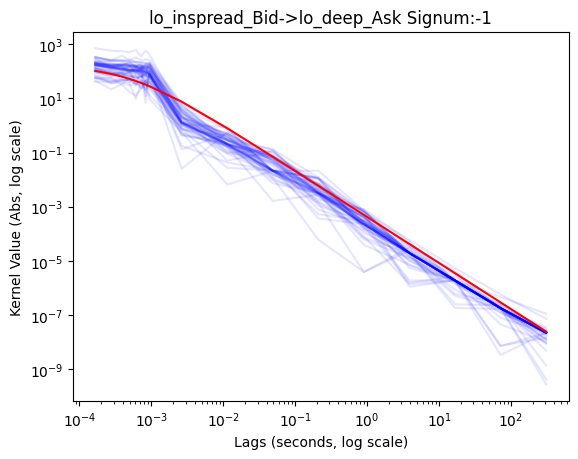

4195.680537392786
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 2.19088543e+02]
 [5.00000000e-04 8.45147927e+02]
 ...
 [2.17500738e+01 4.03590542e+03]
 [9.34593984e+01 4.03590542e+03]
 [4.01632353e+02 4.03590542e+03]]


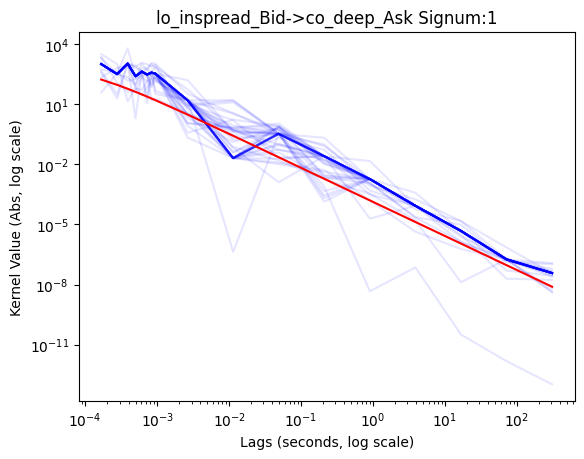

-7.705839451812373e-07
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -1.09437871e-07]
 [ 5.00000000e-04 -2.02764720e-07]
 ...
 [ 2.17500738e+01 -7.55764817e-07]
 [ 9.34593984e+01 -7.55765012e-07]
 [ 4.01632353e+02 -7.55765023e-07]]


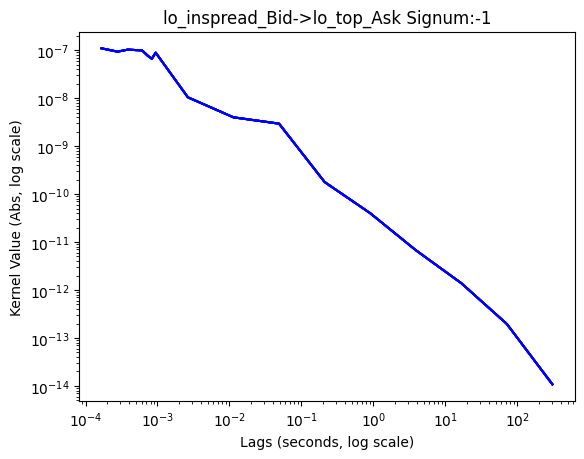

-3527.8502438955543
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -5.59323820e+02]
 [ 5.00000000e-04 -1.05110221e+03]
 ...
 [ 2.17500738e+01 -2.85653976e+03]
 [ 9.34593984e+01 -2.85653976e+03]
 [ 4.01632353e+02 -2.85653976e+03]]


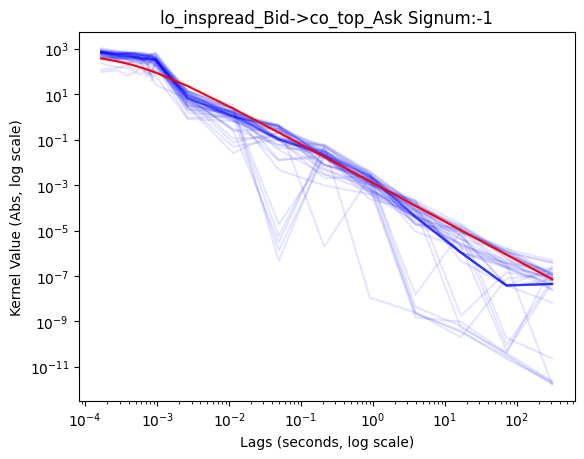

-8.935106765640296e-23
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -1.56631620e-22]
 [ 5.00000000e-04 -3.25304043e-22]
 ...
 [ 2.17500738e+01  5.00416141e-22]
 [ 9.34593984e+01  5.00416397e-22]
 [ 4.01632353e+02  5.00416410e-22]]


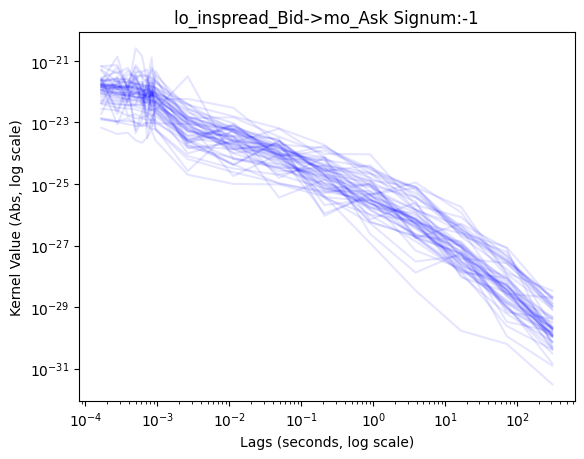

14980.39932556812
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 3.25597070e+03]
 [5.00000000e-04 5.02903066e+03]
 ...
 [2.17500738e+01 1.34284245e+04]
 [9.34593984e+01 1.34284245e+04]
 [4.01632353e+02 1.34284245e+04]]


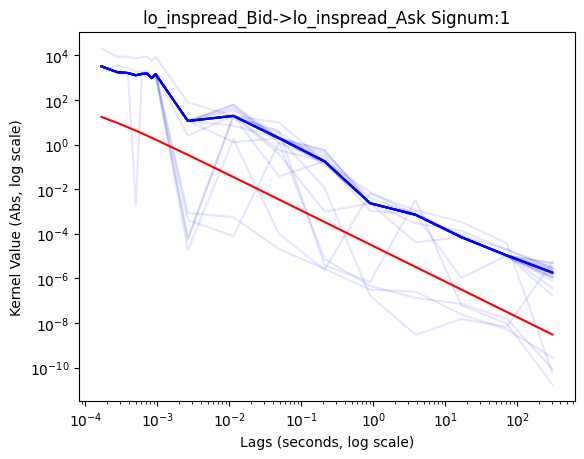

88796.35215937554
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 3.91275550e+04]
 [5.00000000e-04 5.79866275e+04]
 ...
 [2.17500738e+01 8.30969092e+04]
 [9.34593984e+01 8.30969092e+04]
 [4.01632353e+02 8.30969092e+04]]


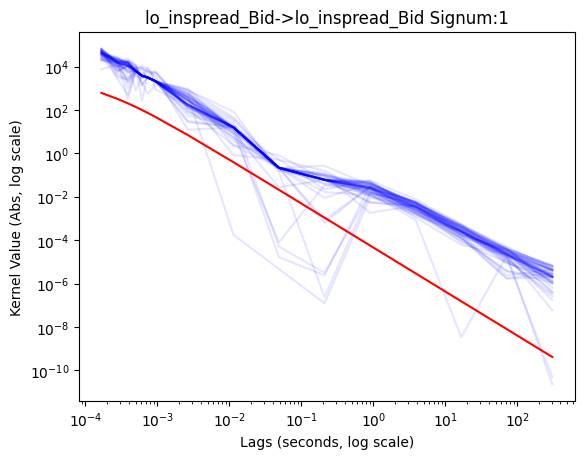

-0.00010278704641911798
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -8.54156247e-06]
 [ 5.00000000e-04 -1.94780416e-05]
 ...
 [ 2.17500738e+01 -1.00810373e-04]
 [ 9.34593984e+01 -1.00810372e-04]
 [ 4.01632353e+02 -1.00810372e-04]]


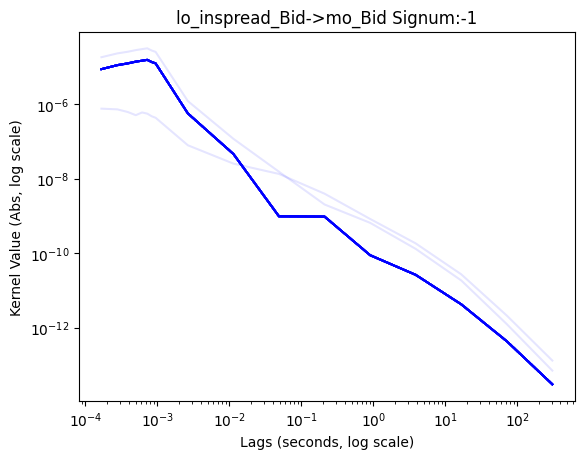

-4169.481794340575
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -4.22569714e+02]
 [ 5.00000000e-04 -7.26360096e+02]
 ...
 [ 2.17500738e+01 -5.35928967e+03]
 [ 9.34593984e+01 -5.35928967e+03]
 [ 4.01632353e+02 -5.35928967e+03]]


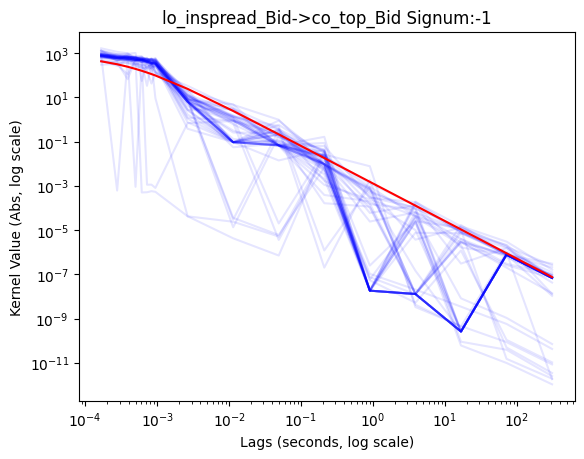

-1.7098537628858543e-06
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -3.46568995e-07]
 [ 5.00000000e-04 -6.73849938e-07]
 ...
 [ 2.17500738e+01 -1.98912162e-06]
 [ 9.34593984e+01 -1.98912174e-06]
 [ 4.01632353e+02 -1.98912174e-06]]


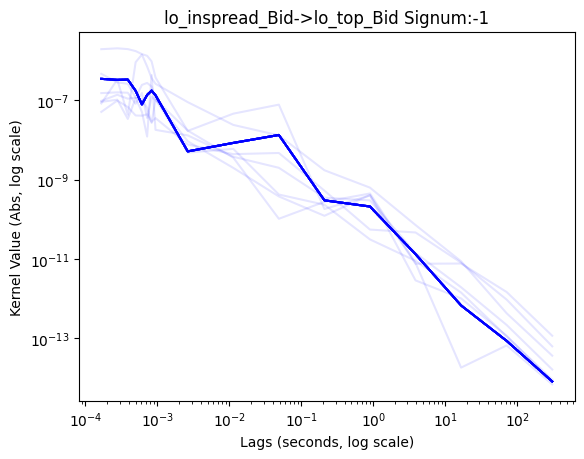

-1162.7654361240197
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -1.03905114e+02]
 [ 5.00000000e-04 -2.23702426e+02]
 ...
 [ 2.17500738e+01 -4.32339621e+02]
 [ 9.34593984e+01 -4.32339621e+02]
 [ 4.01632353e+02 -4.32339621e+02]]


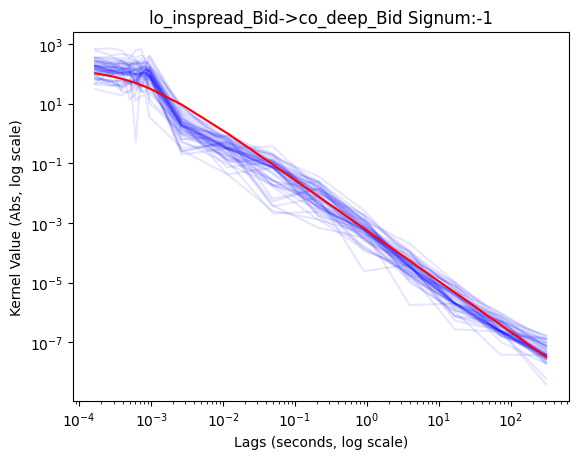

3815.7162952371136
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 7.80088862e+02]
 [5.00000000e-04 1.17004181e+03]
 ...
 [2.17500738e+01 3.68713673e+03]
 [9.34593984e+01 3.68713673e+03]
 [4.01632353e+02 3.68713673e+03]]


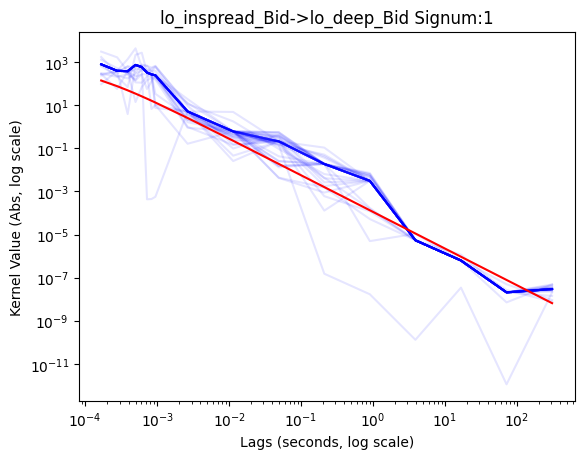

-5.493892347674772e-21
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04  6.21302610e-22]
 [ 5.00000000e-04 -1.48963152e-21]
 ...
 [ 2.17500738e+01  7.34261396e-22]
 [ 9.34593984e+01  7.34261227e-22]
 [ 4.01632353e+02  7.34261234e-22]]


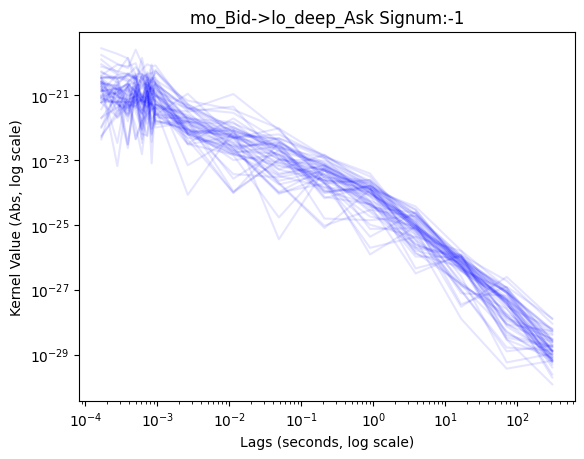

4.170448205599939e-07
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -2.23072154e-08]
 [ 5.00000000e-04 -3.89438489e-08]
 ...
 [ 2.17500738e+01  4.09024729e-07]
 [ 9.34593984e+01  4.09024728e-07]
 [ 4.01632353e+02  4.09024728e-07]]


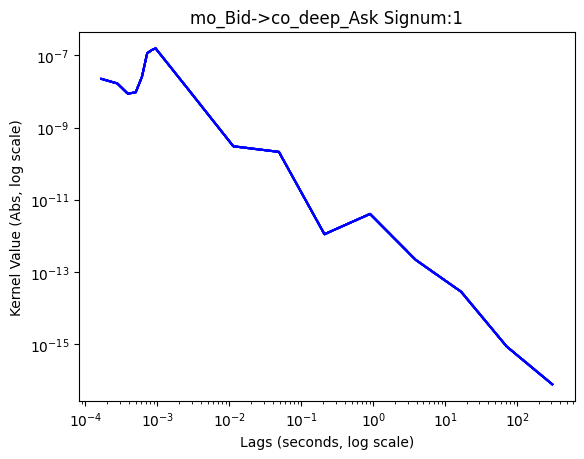

-4.329890558685074e-07
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -6.82347963e-08]
 [ 5.00000000e-04 -1.41207417e-07]
 ...
 [ 2.17500738e+01 -4.24662204e-07]
 [ 9.34593984e+01 -4.24662335e-07]
 [ 4.01632353e+02 -4.24662343e-07]]


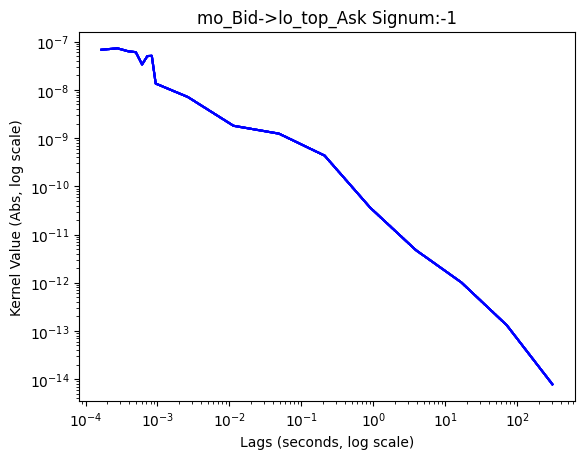

1.4795432656591589e-05
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 1.06048256e-05]
 [5.00000000e-04 2.18040169e-05]
 ...
 [2.17500738e+01 1.45109051e-05]
 [9.34593984e+01 1.45109051e-05]
 [4.01632353e+02 1.45109051e-05]]


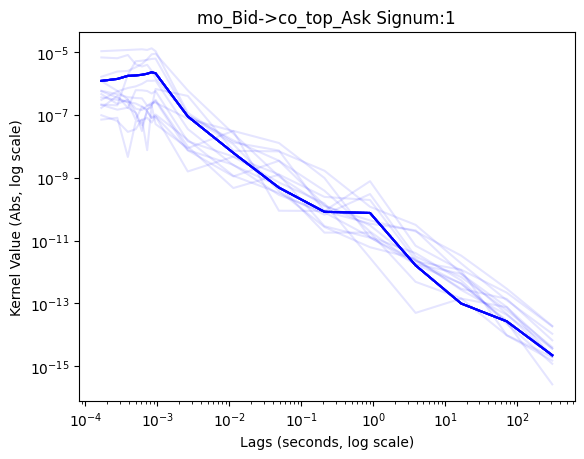

-1.5867894721791414e-22
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -1.51743294e-22]
 [ 5.00000000e-04 -2.75575960e-22]
 ...
 [ 2.17500738e+01  9.34072141e-23]
 [ 9.34593984e+01  9.34074474e-23]
 [ 4.01632353e+02  9.34074612e-23]]


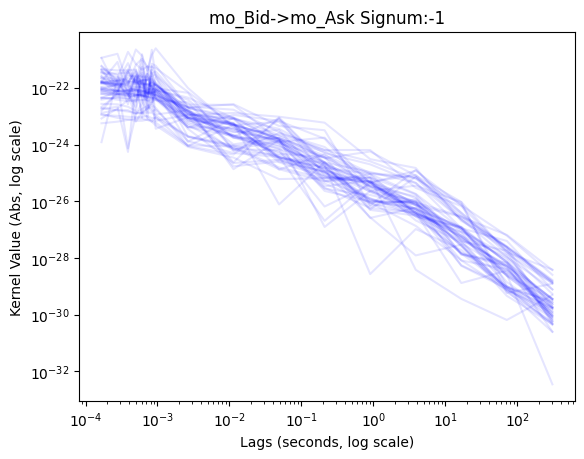

-2.025206843052265e-06
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -3.93634441e-08]
 [ 5.00000000e-04 -6.78812520e-07]
 ...
 [ 2.17500738e+01 -1.98625845e-06]
 [ 9.34593984e+01 -1.98626057e-06]
 [ 4.01632353e+02 -1.98626056e-06]]


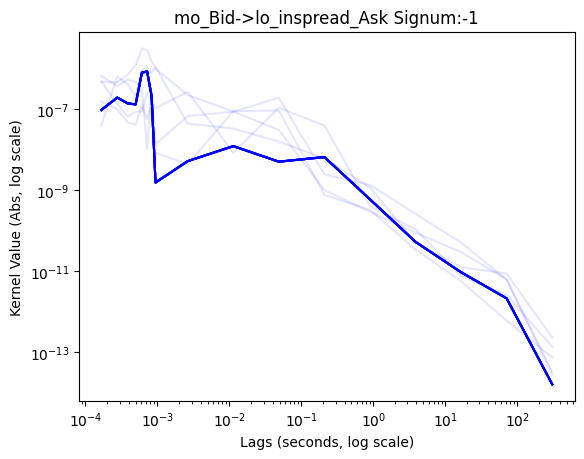

1.0097450767776462e-05
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -1.01675885e-06]
 [ 5.00000000e-04 -4.58680265e-07]
 ...
 [ 2.17500738e+01 -1.84189623e-06]
 [ 9.34593984e+01 -1.84189680e-06]
 [ 4.01632353e+02 -1.84189681e-06]]


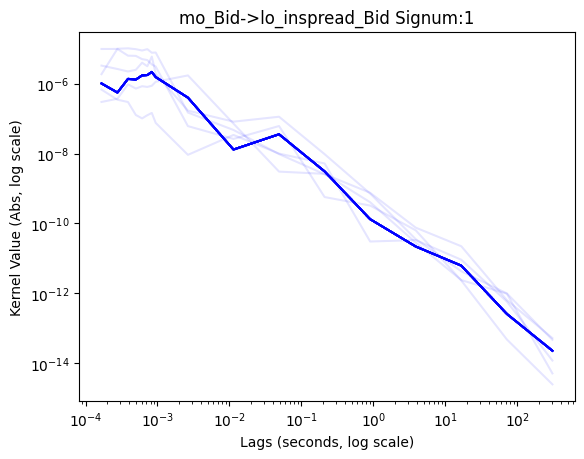

4677.5895565808605
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 1.08918855e+03]
 [5.00000000e-04 2.25550517e+03]
 ...
 [2.17500738e+01 4.91466262e+03]
 [9.34593984e+01 4.91466262e+03]
 [4.01632353e+02 4.91466262e+03]]


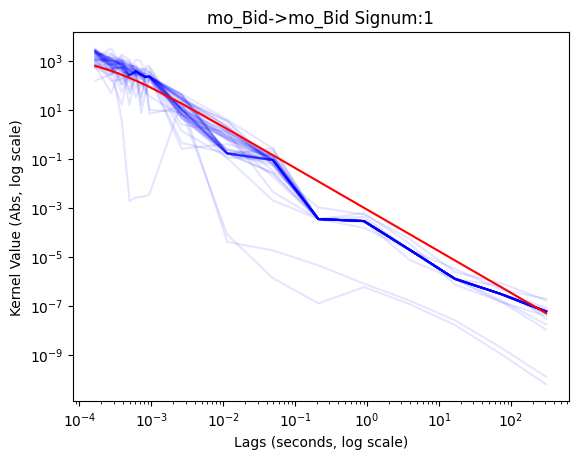

1.627854927987634e-05
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 8.43014878e-07]
 [5.00000000e-04 2.30040793e-06]
 ...
 [2.17500738e+01 1.59655004e-05]
 [9.34593984e+01 1.59655003e-05]
 [4.01632353e+02 1.59655003e-05]]


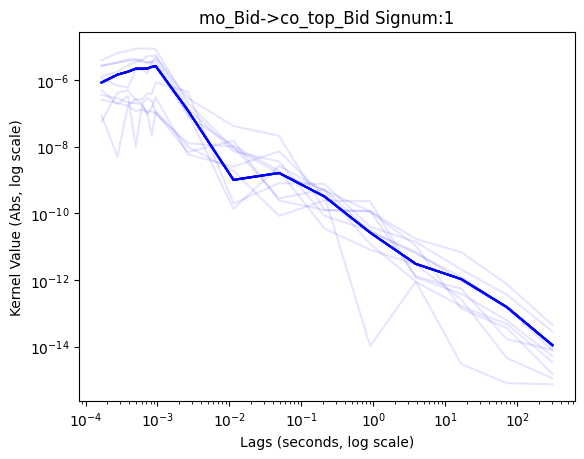

4.192740115773001e-06
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -2.48344810e-07]
 [ 5.00000000e-04 -7.13746982e-08]
 ...
 [ 2.17500738e+01 -2.84823456e-06]
 [ 9.34593984e+01 -2.84823469e-06]
 [ 4.01632353e+02 -2.84823470e-06]]


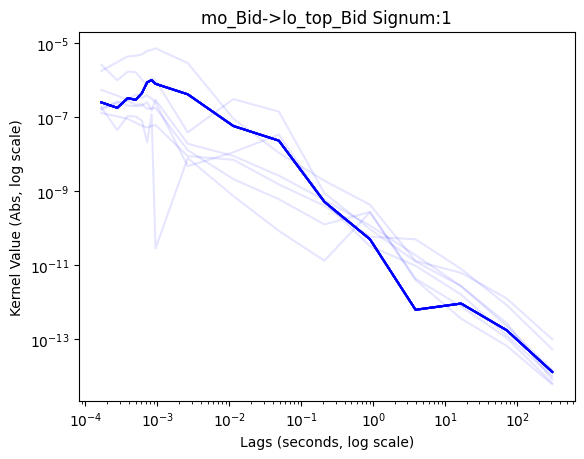

-2.5055413097152256e-22
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -8.13307711e-22]
 [ 5.00000000e-04 -7.45142660e-22]
 ...
 [ 2.17500738e+01  2.32033542e-21]
 [ 9.34593984e+01  2.32033530e-21]
 [ 4.01632353e+02  2.32033530e-21]]


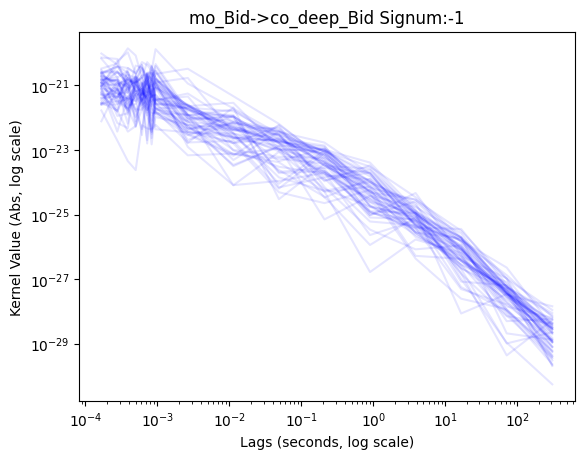

-6.648718809517796e-07
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -2.06552975e-08]
 [ 5.00000000e-04 -1.17380269e-07]
 ...
 [ 2.17500738e+01 -6.52085882e-07]
 [ 9.34593984e+01 -6.52085883e-07]
 [ 4.01632353e+02 -6.52085883e-07]]


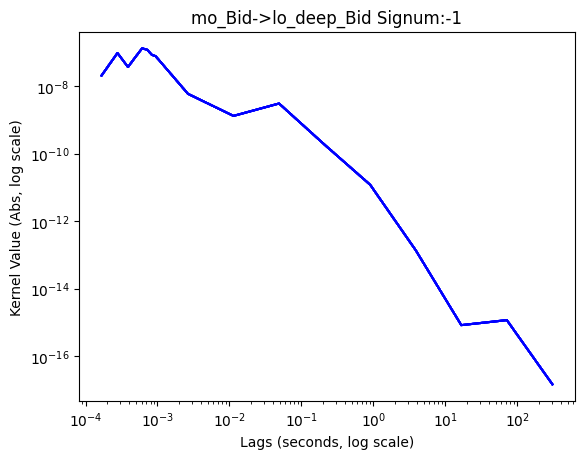

646.0866491143274
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 2.13227884e+02]
 [5.00000000e-04 2.13227884e+02]
 ...
 [2.17500738e+01 6.32769104e+02]
 [9.34593984e+01 6.32769104e+02]
 [4.01632353e+02 6.32769104e+02]]


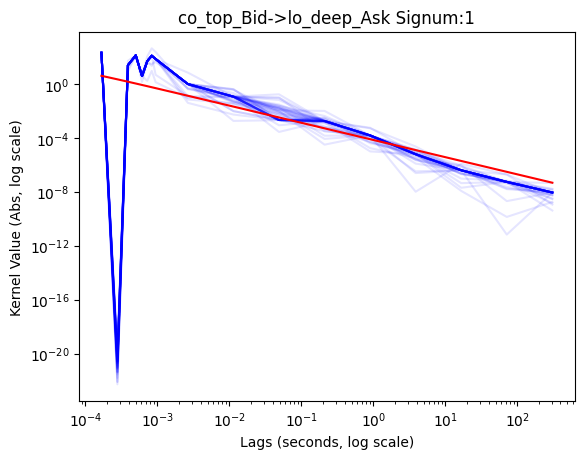

-611.5698705802318
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -3.79187074e+02]
 [ 5.00000000e-04 -5.55577721e+02]
 ...
 [ 2.17500738e+01 -2.64340148e+02]
 [ 9.34593984e+01 -2.64340148e+02]
 [ 4.01632353e+02 -2.64340148e+02]]


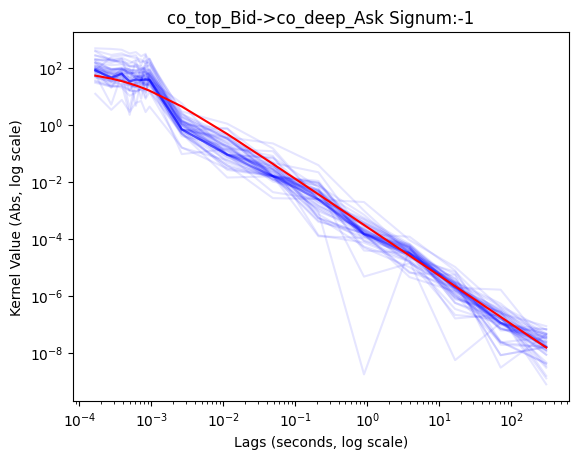

-1.7550180559718279e-06
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -2.82835382e-07]
 [ 5.00000000e-04 -5.34578760e-07]
 ...
 [ 2.17500738e+01 -1.72126767e-06]
 [ 9.34593984e+01 -1.72126771e-06]
 [ 4.01632353e+02 -1.72126771e-06]]


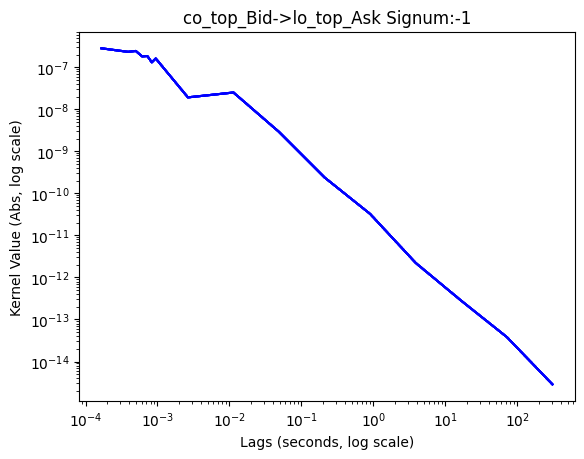

1.1452278885163619e-06
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -8.64354718e-07]
 [ 5.00000000e-04 -1.78663220e-06]
 ...
 [ 2.17500738e+01  1.12320429e-06]
 [ 9.34593984e+01  1.12320428e-06]
 [ 4.01632353e+02  1.12320428e-06]]


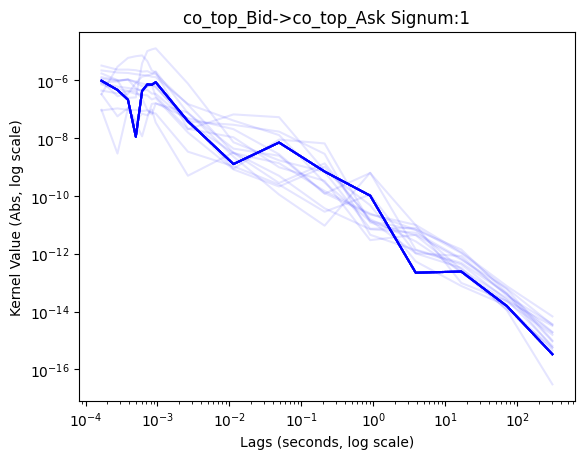

-4.3183443344768927e-23
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -2.76388213e-22]
 [ 5.00000000e-04 -4.89141979e-22]
 ...
 [ 2.17500738e+01  2.75117454e-21]
 [ 9.34593984e+01  2.75117466e-21]
 [ 4.01632353e+02  2.75117467e-21]]


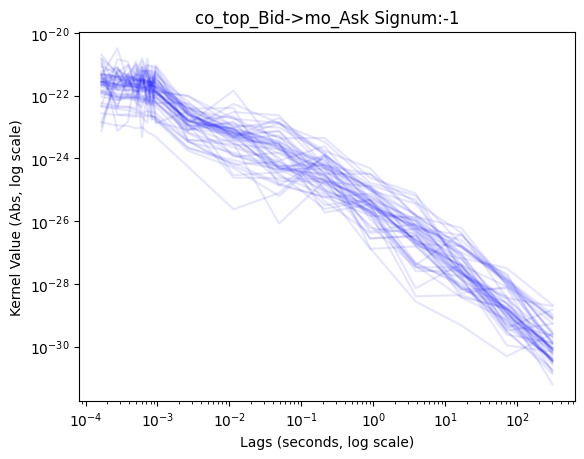

-16274.807869748609
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -3.12636217e+03]
 [ 5.00000000e-04 -5.13815231e+03]
 ...
 [ 2.17500738e+01 -1.29729546e+04]
 [ 9.34593984e+01 -1.29729546e+04]
 [ 4.01632353e+02 -1.29729546e+04]]


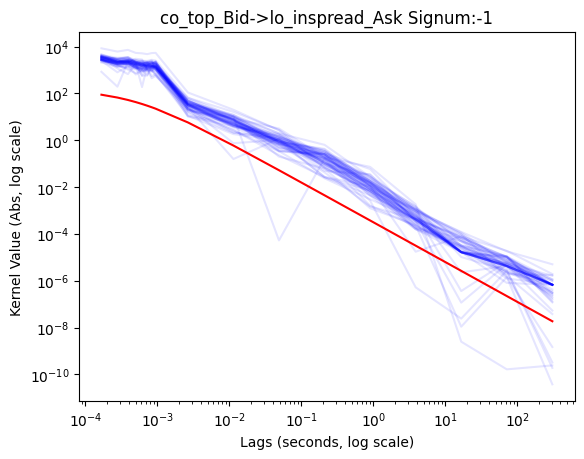

17082.185230963216
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 6.86691092e+03]
 [5.00000000e-04 1.03880242e+04]
 ...
 [2.17500738e+01 1.03898298e+04]
 [9.34593984e+01 1.03898298e+04]
 [4.01632353e+02 1.03898298e+04]]


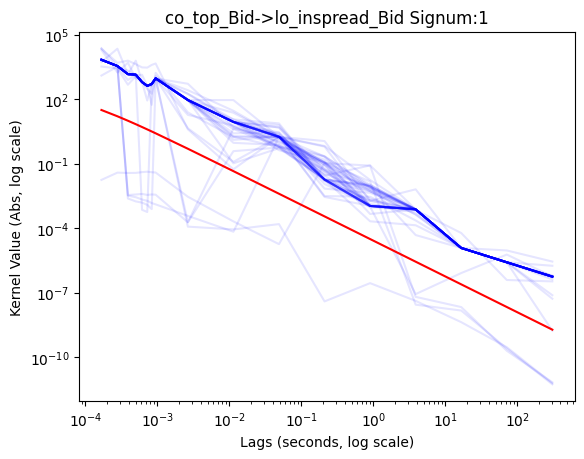

-0.0002834041376151908
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -1.54054481e-05]
 [ 5.00000000e-04 -3.94139142e-05]
 ...
 [ 2.17500738e+01 -2.77954058e-04]
 [ 9.34593984e+01 -2.77954058e-04]
 [ 4.01632353e+02 -2.77954058e-04]]


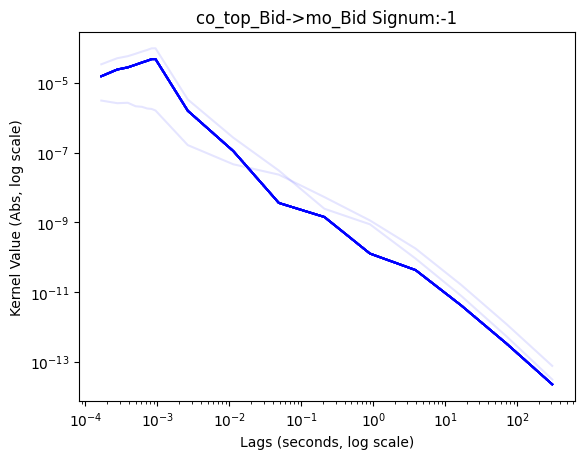

5345.651939395621
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 3.00825225e+03]
 [5.00000000e-04 3.54883735e+03]
 ...
 [2.17500738e+01 5.55515436e+03]
 [9.34593984e+01 5.55515436e+03]
 [4.01632353e+02 5.55515436e+03]]


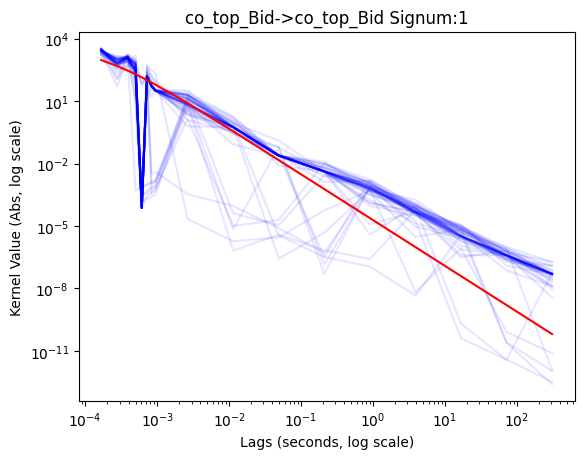

-6.719217248244899e-06
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -1.13177985e-06]
 [ 5.00000000e-04 -2.09709697e-06]
 ...
 [ 2.17500738e+01 -1.65336869e-06]
 [ 9.34593984e+01 -1.65336885e-06]
 [ 4.01632353e+02 -1.65336886e-06]]


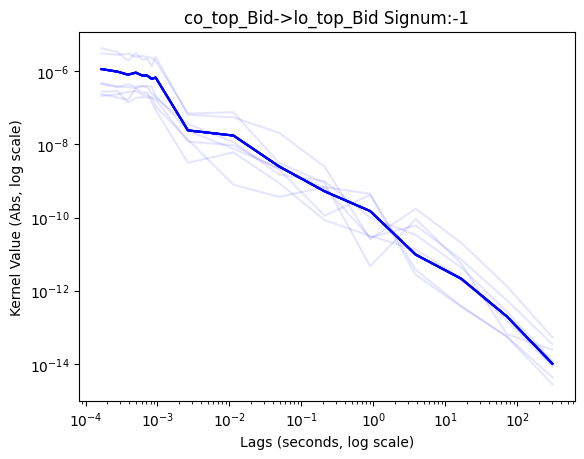

-5.958167987791389e-21
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -1.99880673e-21]
 [ 5.00000000e-04 -5.15599184e-21]
 ...
 [ 2.17500738e+01  1.17668488e-20]
 [ 9.34593984e+01  1.17668488e-20]
 [ 4.01632353e+02  1.17668488e-20]]


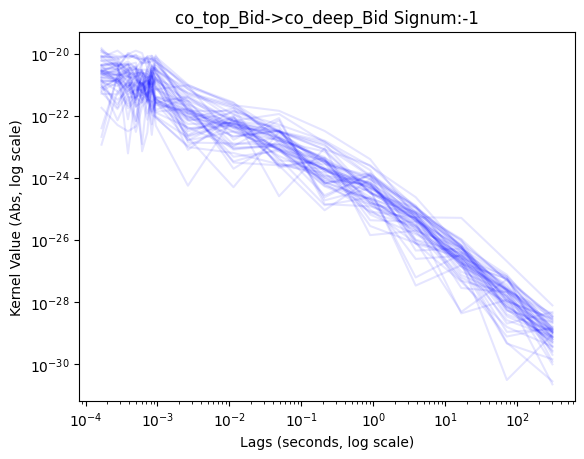

-441.35200491786003
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -2.13479597e+02]
 [ 5.00000000e-04 -3.77902572e+02]
 ...
 [ 2.17500738e+01 -3.36262661e+02]
 [ 9.34593984e+01 -3.36262661e+02]
 [ 4.01632353e+02 -3.36262661e+02]]


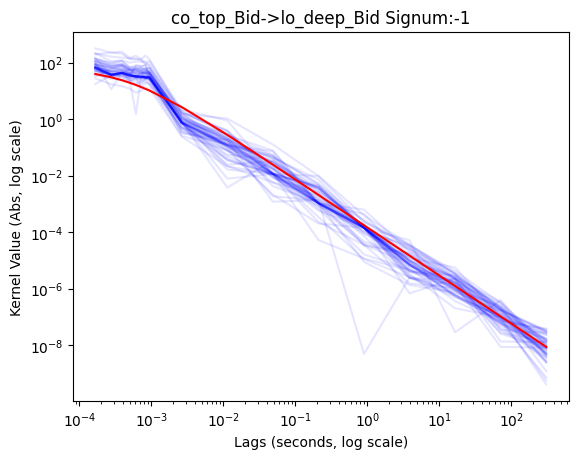

-727.0450212034233
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -1.99971046e+02]
 [ 5.00000000e-04 -3.44405824e+02]
 ...
 [ 2.17500738e+01 -7.60357813e+02]
 [ 9.34593984e+01 -7.60357813e+02]
 [ 4.01632353e+02 -7.60357813e+02]]


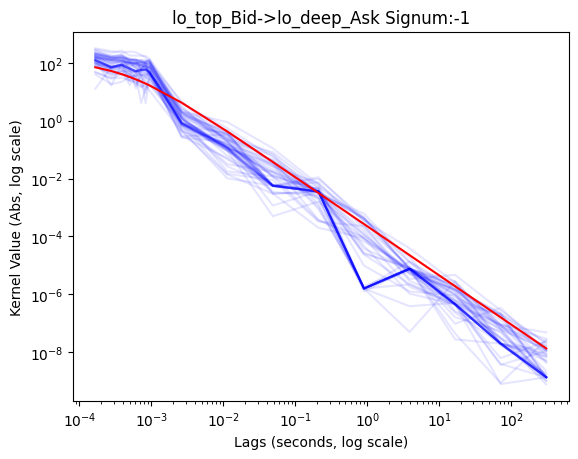

3092.7716202125666
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 5.48466553e+02]
 [5.00000000e-04 1.00696659e+03]
 ...
 [2.17500738e+01 2.97606326e+03]
 [9.34593984e+01 2.97606326e+03]
 [4.01632353e+02 2.97606326e+03]]


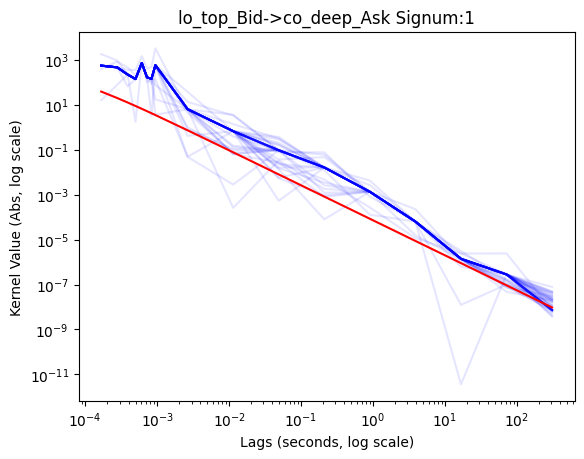

-1.080277232813325e-06
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -1.95599944e-07]
 [ 5.00000000e-04 -3.23568809e-07]
 ...
 [ 2.17500738e+01 -1.05950261e-06]
 [ 9.34593984e+01 -1.05950267e-06]
 [ 4.01632353e+02 -1.05950267e-06]]


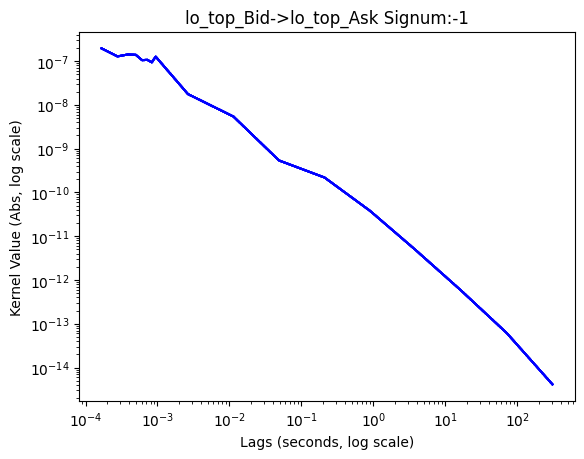

7.974391797260408e-06
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 2.82623863e-06]
 [5.00000000e-04 8.09534424e-06]
 ...
 [2.17500738e+01 7.82103812e-06]
 [9.34593984e+01 7.82103811e-06]
 [4.01632353e+02 7.82103811e-06]]


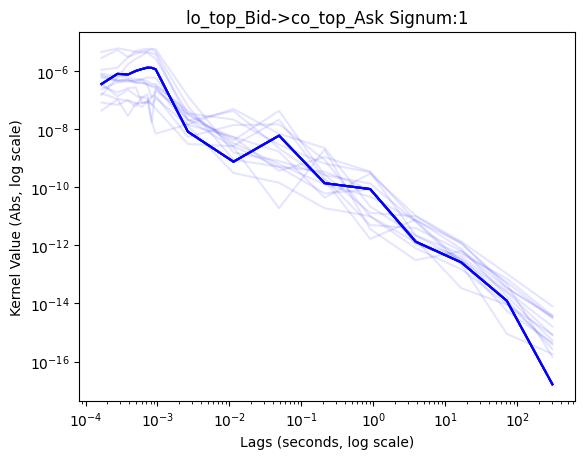

-3.985065989560866e-22
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -4.48511170e-22]
 [ 5.00000000e-04 -5.94644735e-22]
 ...
 [ 2.17500738e+01  8.92355425e-22]
 [ 9.34593984e+01  8.92355546e-22]
 [ 4.01632353e+02  8.92355553e-22]]


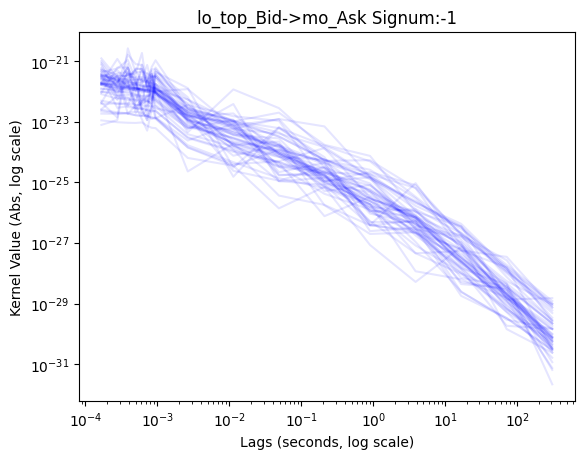

16158.351392898703
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 5.38175982e+03]
 [5.00000000e-04 7.25716654e+03]
 ...
 [2.17500738e+01 1.48859097e+04]
 [9.34593984e+01 1.48859097e+04]
 [4.01632353e+02 1.48859097e+04]]


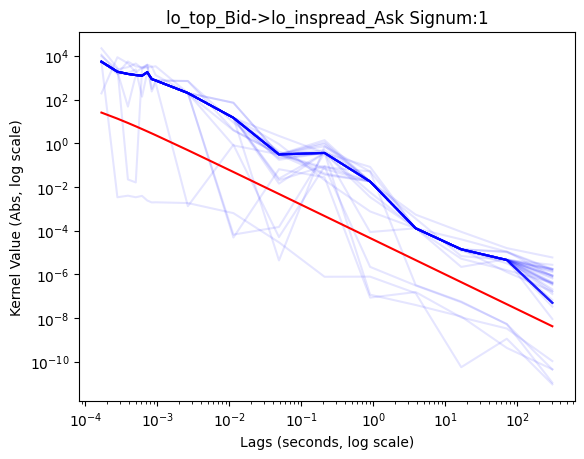

-32079.463809937737
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -3.39036279e+03]
 [ 5.00000000e-04 -5.91242694e+03]
 ...
 [ 2.17500738e+01 -3.87483511e+04]
 [ 9.34593984e+01 -3.87483511e+04]
 [ 4.01632353e+02 -3.87483511e+04]]


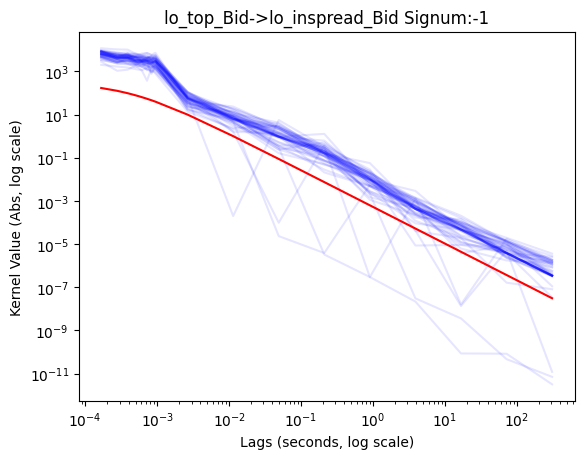

1.0249723881062885e-05
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 2.01132288e-06]
 [5.00000000e-04 3.42836819e-06]
 ...
 [2.17500738e+01 1.00526135e-05]
 [9.34593984e+01 1.00526138e-05]
 [4.01632353e+02 1.00526138e-05]]


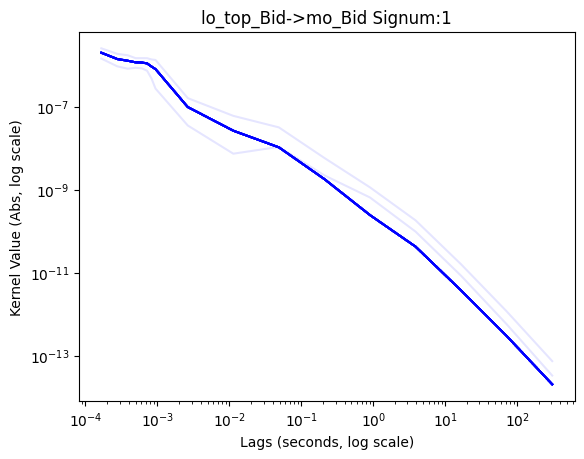

2444.320214984871
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 9.25520022e+02]
 [5.00000000e-04 1.35400906e+03]
 ...
 [2.17500738e+01 2.22452954e+03]
 [9.34593984e+01 2.22452954e+03]
 [4.01632353e+02 2.22452954e+03]]


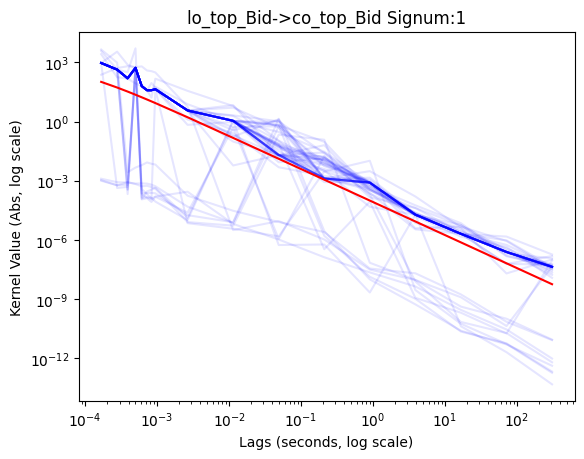

4811.680781189571
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 2.93259230e+03]
 [5.00000000e-04 3.28200907e+03]
 ...
 [2.17500738e+01 4.07236377e+03]
 [9.34593984e+01 4.07236377e+03]
 [4.01632353e+02 4.07236377e+03]]


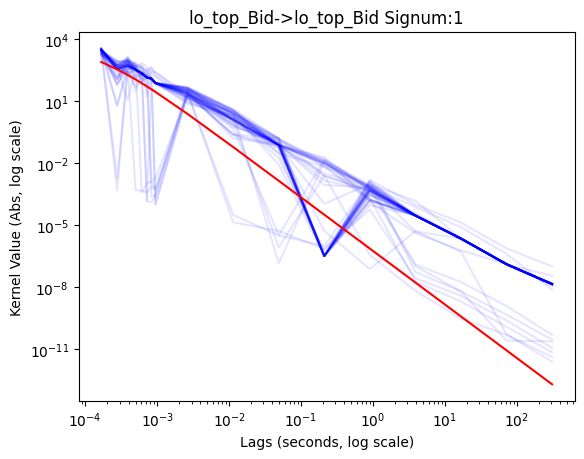

-2.3063961029101227e-21
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 4.47613755e-22]
 [5.00000000e-04 1.22939740e-21]
 ...
 [2.17500738e+01 5.48700492e-21]
 [9.34593984e+01 5.48700477e-21]
 [4.01632353e+02 5.48700477e-21]]


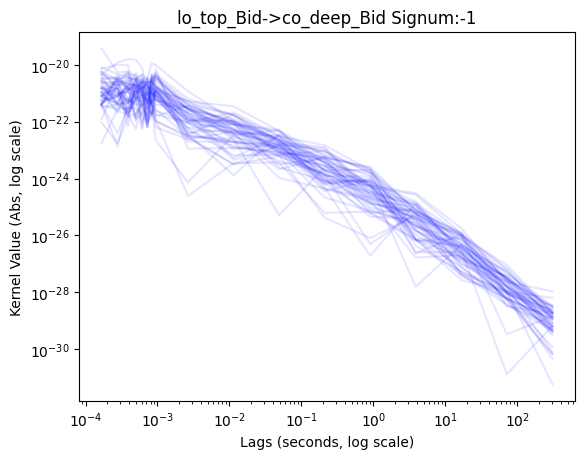

-5.402751038657212e-07
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -1.10627998e-07]
 [ 5.00000000e-04 -1.96968447e-07]
 ...
 [ 2.17500738e+01 -5.29885198e-07]
 [ 9.34593984e+01 -5.29885198e-07]
 [ 4.01632353e+02 -5.29885198e-07]]


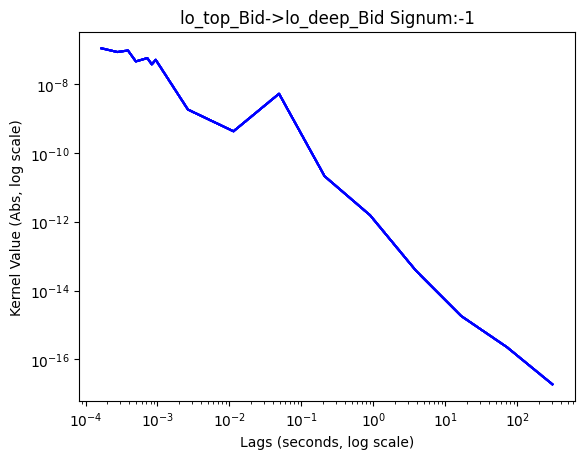

2748.808996024543
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 8.08008885e+02]
 [5.00000000e-04 1.08433683e+03]
 ...
 [2.17500738e+01 5.96763837e+03]
 [9.34593984e+01 5.96763837e+03]
 [4.01632353e+02 5.96763837e+03]]


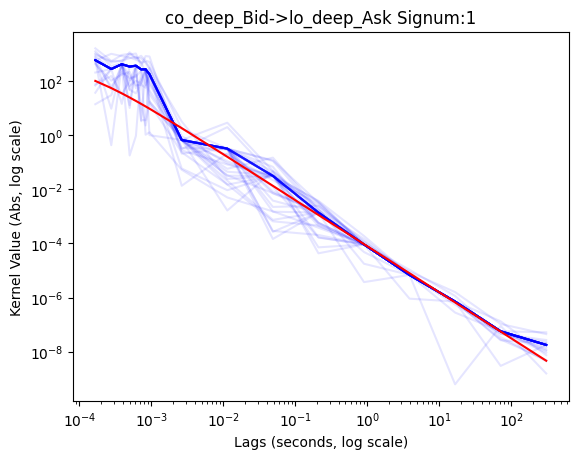

-428.00613588108195
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -1.04409793e+02]
 [ 5.00000000e-04 -1.75340944e+02]
 ...
 [ 2.17500738e+01 -4.58368895e+02]
 [ 9.34593984e+01 -4.58368895e+02]
 [ 4.01632353e+02 -4.58368895e+02]]


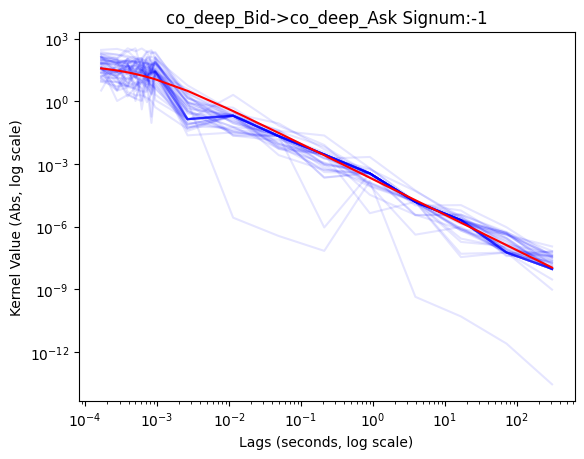

-9.511918195126987e-07
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -1.32331743e-07]
 [ 5.00000000e-04 -2.70143704e-07]
 ...
 [ 2.17500738e+01 -9.32899585e-07]
 [ 9.34593984e+01 -9.32899659e-07]
 [ 4.01632353e+02 -9.32899669e-07]]


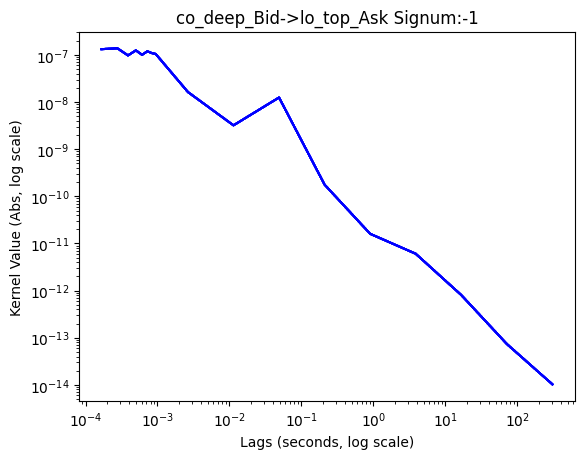

1794.4393650138045
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 2.59486198e+02]
 [5.00000000e-04 6.81232439e+02]
 ...
 [2.17500738e+01 1.61263056e+03]
 [9.34593984e+01 1.61263056e+03]
 [4.01632353e+02 1.61263056e+03]]


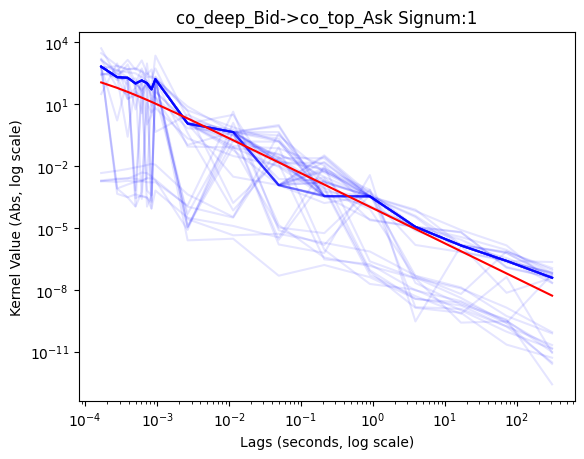

-1.6849030904528682e-22
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -3.18646338e-22]
 [ 5.00000000e-04 -5.62698550e-22]
 ...
 [ 2.17500738e+01  3.00761978e-22]
 [ 9.34593984e+01  3.00762736e-22]
 [ 4.01632353e+02  3.00762777e-22]]


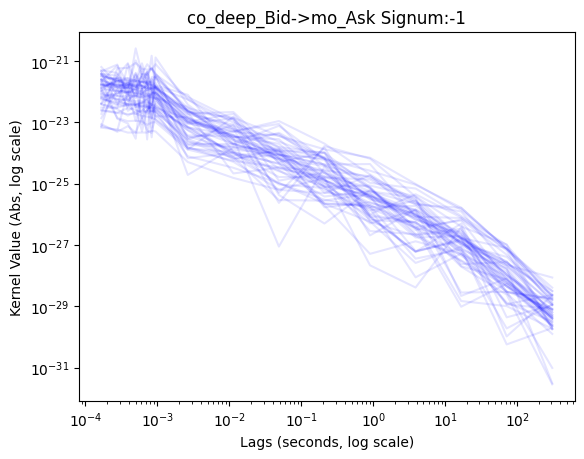

-12947.044607615118
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -4.44471355e-02]
 [ 5.00000000e-04 -9.47764928e-02]
 ...
 [ 2.17500738e+01 -2.05107470e+04]
 [ 9.34593984e+01 -2.05107470e+04]
 [ 4.01632353e+02 -2.05107470e+04]]


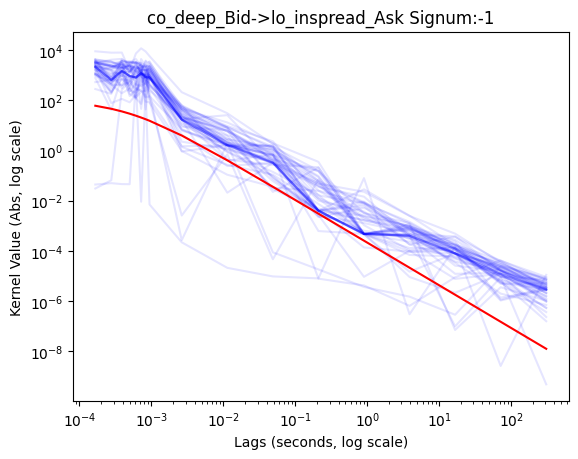

2895.7460773886614
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 4.57660783e+02]
 [5.00000000e-04 7.46841256e+02]
 ...
 [2.17500738e+01 3.99844148e+00]
 [9.34593984e+01 3.99844147e+00]
 [4.01632353e+02 3.99844147e+00]]


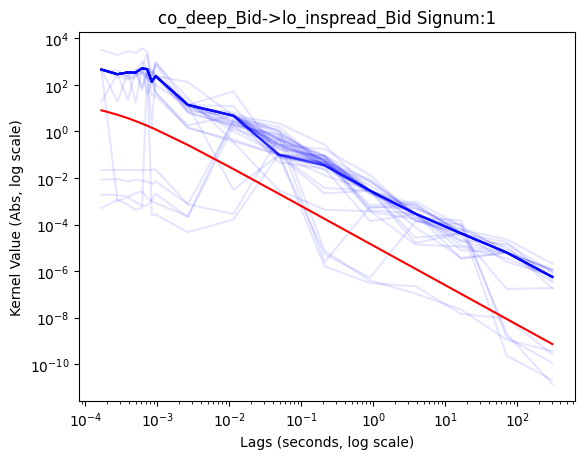

-6.859703112704039e-06
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04  4.64157619e-07]
 [ 5.00000000e-04  2.46468403e-07]
 ...
 [ 2.17500738e+01 -6.72778552e-06]
 [ 9.34593984e+01 -6.72778574e-06]
 [ 4.01632353e+02 -6.72778575e-06]]


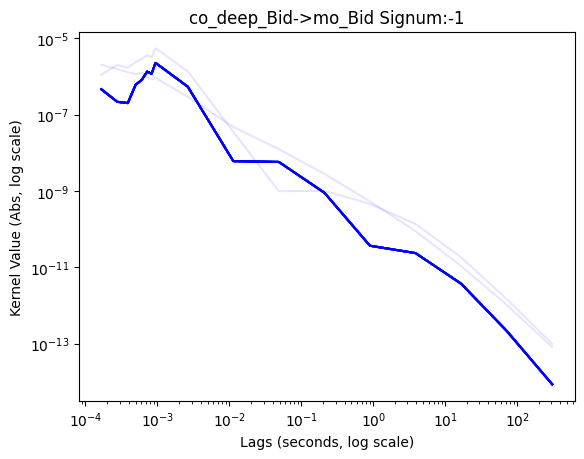

-1138.3714766797546
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -1.84389875e+02]
 [ 5.00000000e-04 -2.88099860e+02]
 ...
 [ 2.17500738e+01 -7.95475938e+02]
 [ 9.34593984e+01 -7.95475940e+02]
 [ 4.01632353e+02 -7.95475940e+02]]


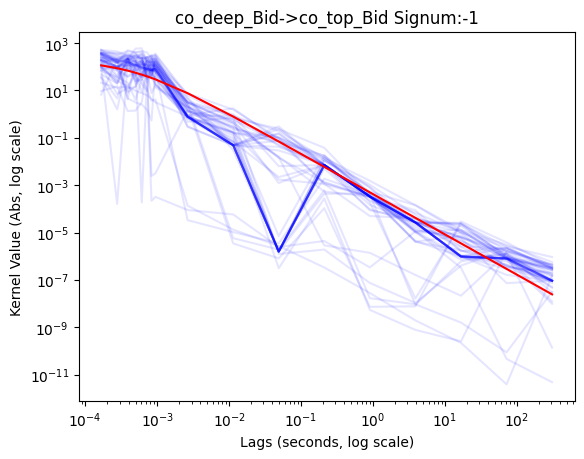

-3.0635536260606936e-06
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -8.62264351e-07]
 [ 5.00000000e-04 -1.28200219e-06]
 ...
 [ 2.17500738e+01 -2.72468900e-06]
 [ 9.34593984e+01 -2.72468923e-06]
 [ 4.01632353e+02 -2.72468925e-06]]


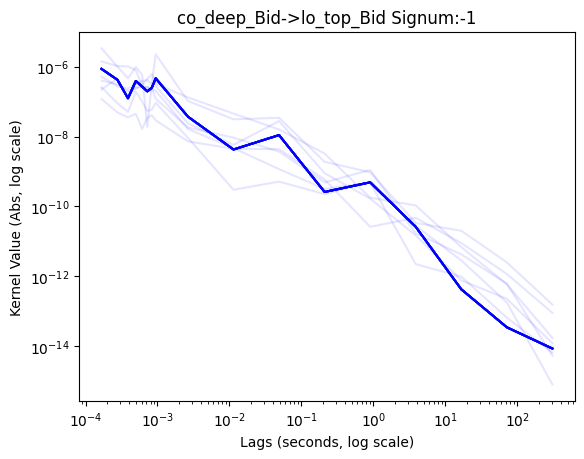

4338.524186262862
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 6.97633722e+02]
 [5.00000000e-04 1.03586556e+03]
 ...
 [2.17500738e+01 3.06900429e+03]
 [9.34593984e+01 3.06900429e+03]
 [4.01632353e+02 3.06900429e+03]]


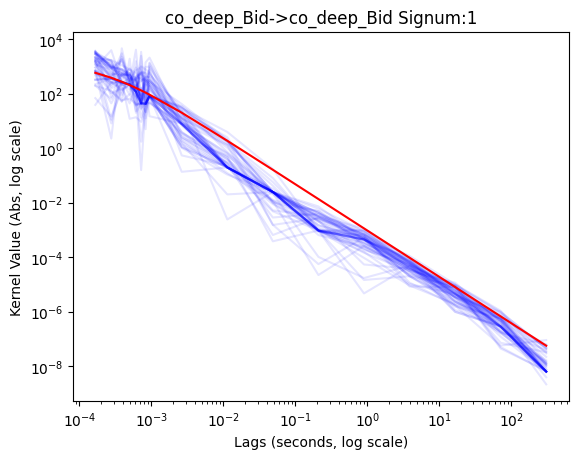

1235.3446830152661
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 2.36330973e+02]
 [5.00000000e-04 4.46397059e+02]
 ...
 [2.17500738e+01 1.20703528e+03]
 [9.34593984e+01 1.20703528e+03]
 [4.01632353e+02 1.20703528e+03]]


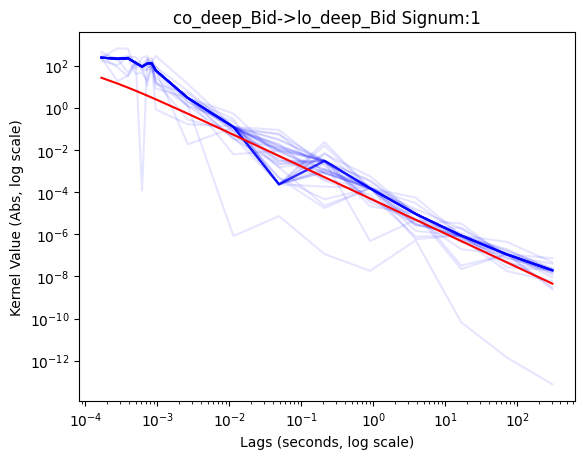

-2.745067303628888e-22
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04  2.01074930e-21]
 [ 5.00000000e-04  3.10974227e-21]
 ...
 [ 2.17500738e+01 -3.73997542e-22]
 [ 9.34593984e+01 -3.73996972e-22]
 [ 4.01632353e+02 -3.73996924e-22]]


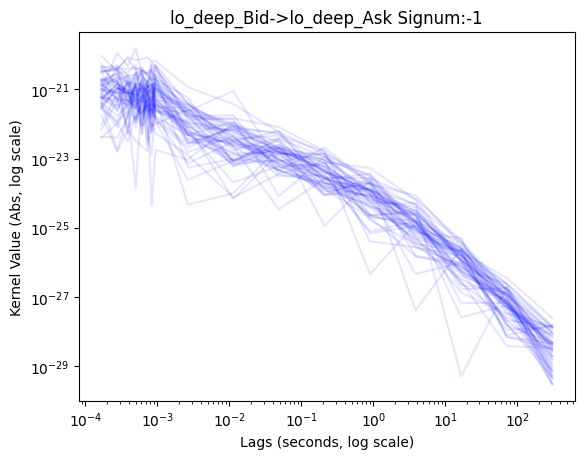

-1612.7271363320522
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -2.95377661e+02]
 [ 5.00000000e-04 -5.64012134e+02]
 ...
 [ 2.17500738e+01 -9.72489027e+02]
 [ 9.34593984e+01 -9.72489027e+02]
 [ 4.01632353e+02 -9.72489027e+02]]


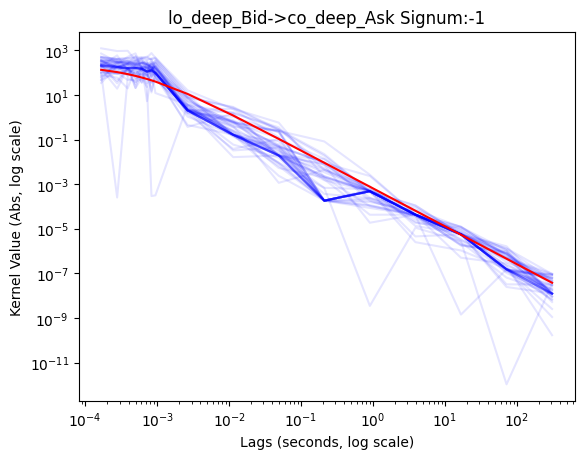

-2.4337997855013607e-07
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -2.02777742e-08]
 [ 5.00000000e-04 -4.25014565e-08]
 ...
 [ 2.17500738e+01 -2.38699212e-07]
 [ 9.34593984e+01 -2.38699570e-07]
 [ 4.01632353e+02 -2.38699594e-07]]


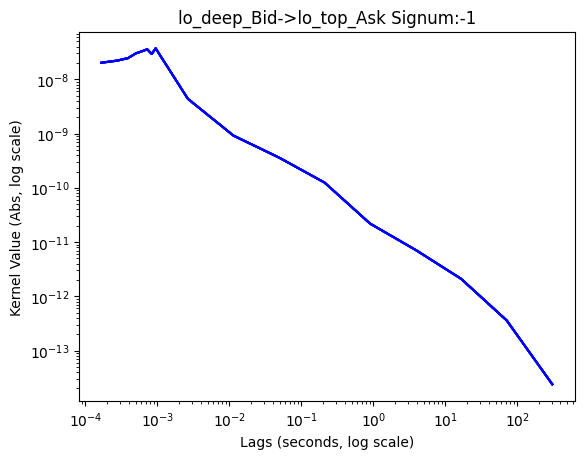

-3529.855604440621
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -6.79313466e+02]
 [ 5.00000000e-04 -1.33898447e+03]
 ...
 [ 2.17500738e+01 -5.19744257e+03]
 [ 9.34593984e+01 -5.19744257e+03]
 [ 4.01632353e+02 -5.19744257e+03]]


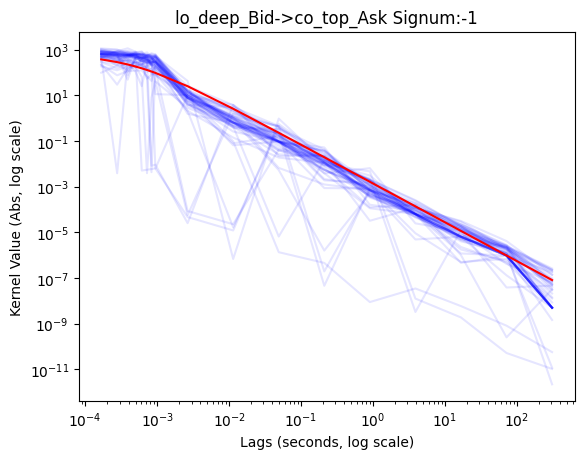

-7.766290802871128e-23
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04  1.09235504e-22]
 [ 5.00000000e-04 -2.26247953e-23]
 ...
 [ 2.17500738e+01  4.35010387e-22]
 [ 9.34593984e+01  4.35010862e-22]
 [ 4.01632353e+02  4.35010884e-22]]


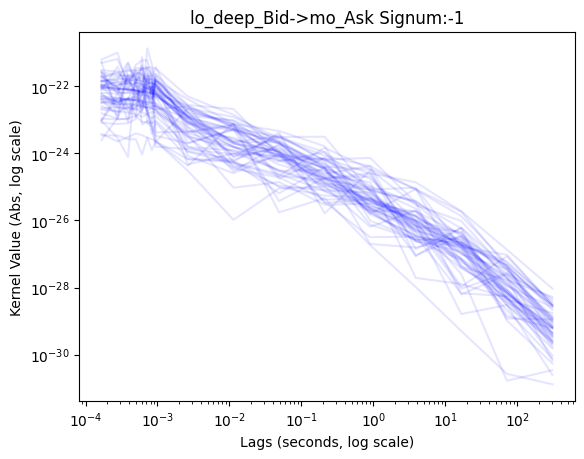

1137.3874052570247
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 1.41865168e-03]
 [5.00000000e-04 2.45104929e-03]
 ...
 [2.17500738e+01 1.05735806e+03]
 [9.34593984e+01 1.05735806e+03]
 [4.01632353e+02 1.05735806e+03]]


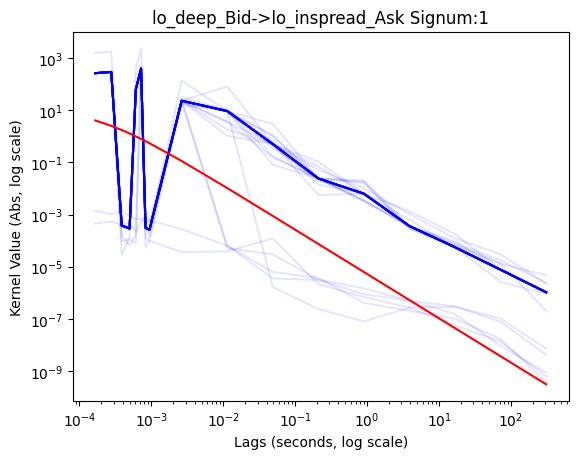

-38334.213256472925
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -2.86650249e+03]
 [ 5.00000000e-04 -6.29370888e+03]
 ...
 [ 2.17500738e+01 -8.72101397e+03]
 [ 9.34593984e+01 -8.72101400e+03]
 [ 4.01632353e+02 -8.72101400e+03]]


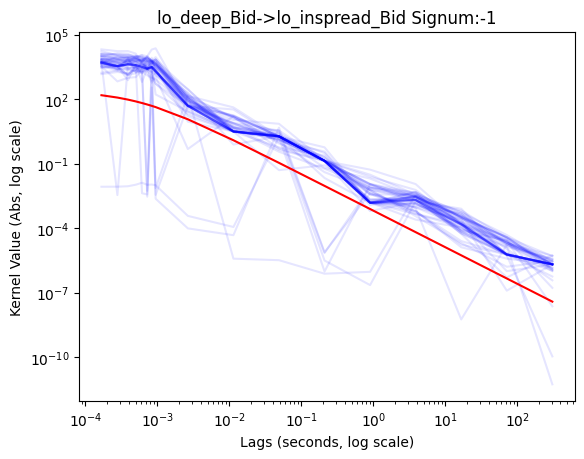

-8.995626205054715e-05
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -6.13033643e-06]
 [ 5.00000000e-04 -1.44409294e-05]
 ...
 [ 2.17500738e+01 -8.82263342e-05]
 [ 9.34593984e+01 -8.82263340e-05]
 [ 4.01632353e+02 -8.82263339e-05]]


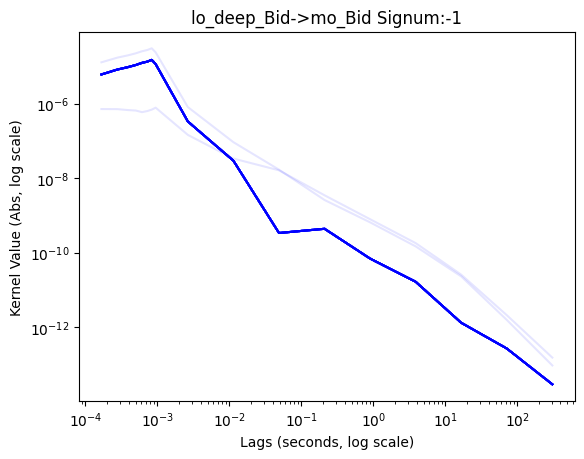

3344.599193436778
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 4.19715306e+02]
 [5.00000000e-04 7.27641196e+02]
 ...
 [2.17500738e+01 3.02622371e+03]
 [9.34593984e+01 3.02622371e+03]
 [4.01632353e+02 3.02622371e+03]]


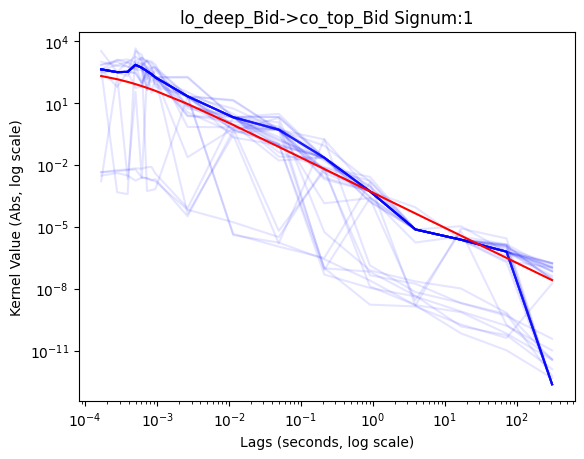

-3672.6456416420488
[[ 5.55555556e-05  0.00000000e+00]
 [ 2.22222222e-04 -6.99838106e+02]
 [ 5.00000000e-04 -1.43762044e+03]
 ...
 [ 2.17500738e+01 -3.50191959e+03]
 [ 9.34593984e+01 -3.50191959e+03]
 [ 4.01632353e+02 -3.50191959e+03]]


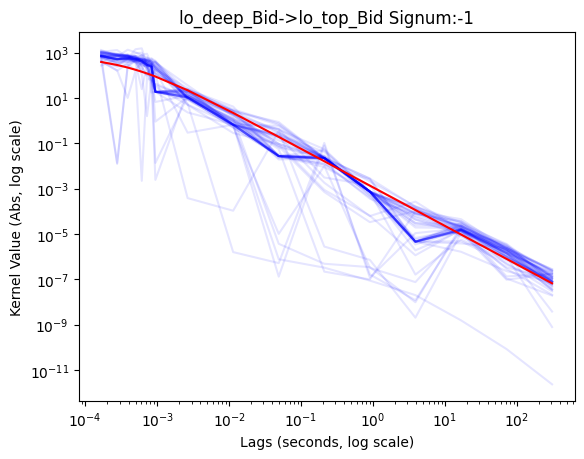

2573.993532685848
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 8.47100370e+02]
 [5.00000000e-04 1.47673739e+03]
 ...
 [2.17500738e+01 2.52449366e+03]
 [9.34593984e+01 2.52449366e+03]
 [4.01632353e+02 2.52449366e+03]]


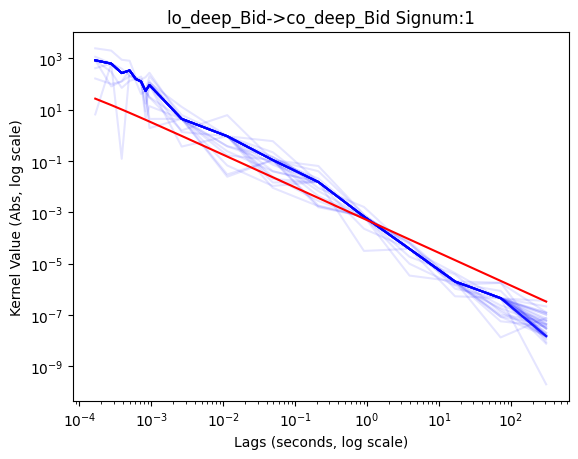

4652.035976613378
[[5.55555556e-05 0.00000000e+00]
 [2.22222222e-04 1.37449490e+03]
 [5.00000000e-04 2.03614292e+03]
 ...
 [2.17500738e+01 5.22521173e+03]
 [9.34593984e+01 5.22521173e+03]
 [4.01632353e+02 5.22521173e+03]]


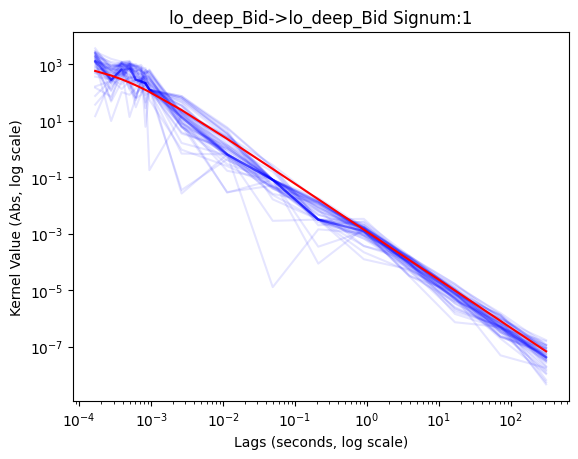

In [15]:
# with open("/SAN/fca/Konark_PhD_Experiments/extracted/AAPL.OQ_ParamsInferredWCutoff_2019-01-02_2019-03-31_CLSLogLinExp_10", "rb") as f:
#     params = pickle.load(f)

for col1 in cols:
    for col2 in cols:
        points = np.array(res[col1 + '->' + col2]).reshape((52,18,2))
        for j in range(18):
            t = points[:,j,1]
            # print(t)
            med = np.median(t)
            # if med == np.inf:
            #         t = t[t != np.inf]
            t[t == np.inf] = 1e6
            if np.abs(med) < 1e-18: med = np.mean(t[(np.abs(t)>1e-18)&(t < 1e6)])
            t[np.abs(med/t) > 1e6] = med
            t[np.abs(med/t) < 1e-6] = med
            # print(med)
            points[:,j,1] = t
        if points.sum() != np.inf:
                print(points[:,:,1].sum()/51)
                norms[col2 + '->' + col] = points[:,:,1].sum()/51
        points2 = np.cumsum(points, axis = 1)
        v = points2.reshape((52*18, 2))
        print(v)
        plt.figure()
        s = np.sign(np.sum(points,axis=1)[:,1].mean())
        plt.title(col1 + '->' + col2 + " Signum:" + str(int(s)))
        for p in points:
            plt.plot(p[:,0][1:], np.abs(p[:,1][1:]), alpha = 0.1, color='b')
        if col1 + '->' + col2 in params.keys():
            kernelParams = params[col1 + '->' + col2]
            gamma = kernelParams[1][2]
            beta = kernelParams[1][1]
            # norm = np.average(norms[col1+"->"+col2])
            # if "inspread" in col2: norm = norm*(0.0169)**0.7479
            alpha = kernelParams[1][0]
            
            # time = p[:,0][1:]
            plt.plot(p[:,0][1:], np.abs(alpha/((1 + gamma*p[:,0][1:])**beta)), color = "r")
            # kernelParams2= params2[col1 + '->' + col2]
            # plt.plot(p[:,0][1:], np.abs(np.exp(kernelParams[1][0])*np.exp(p[:,0][1:]*kernelParams[1][1])), color = "orange")
        plt.xscale("log")
        plt.yscale("log")
        plt.xlabel("Lags (seconds, log scale)") 
        plt.ylabel("Kernel Value (Abs, log scale)") 
        plt.show()



In [51]:
np.array(res['co_deep_Ask->lo_deep_Ask']).reshape((51,17,2))[0,:,:]

array([[ 2.22222222e-04,  2.31652434e-26],
       [ 3.33333333e-04, -1.00592698e-26],
       [ 4.44444444e-04, -2.36746479e-26],
       [ 5.55555556e-04, -3.68410066e-26],
       [ 6.66666667e-04, -4.82395873e-26],
       [ 7.77777778e-04, -2.66493976e-26],
       [ 8.88888889e-04,  5.10567943e-27],
       [ 1.00000000e-03, -7.75633082e-27],
       [ 4.29752973e-03,  2.65550745e-25],
       [ 1.84687617e-02, -5.27583718e-23],
       [ 7.93700526e-02,  6.28768065e-01],
       [ 3.41095160e-01,  6.28768065e-01],
       [ 1.46586659e+00,  6.28768065e-01],
       [ 6.29960525e+00,  6.28768065e-01],
       [ 2.70727408e+01,  6.28768065e-01],
       [ 1.16345908e+02,  6.28768065e-01],
       [ 5.00000000e+02,  6.28768065e-01]])

In [31]:
import statsmodels.api as sm
points_f = points[:,1:,:]
points_f = points_f.reshape((52*17, 2))
Xs = np.hstack([np.log(d[0]) for d in points_f])
Ys = np.hstack([np.log(d[1]) for d in points_f])
Xs = sm.add_constant(Xs)
model = sm.OLS(Ys, Xs)
res = model.fit()
print(res.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.894
Model:                            OLS   Adj. R-squared:                  0.893
Method:                 Least Squares   F-statistic:                     7407.
Date:                Thu, 15 Feb 2024   Prob (F-statistic):               0.00
Time:                        13:18:46   Log-Likelihood:                -1292.5
No. Observations:                 884   AIC:                             2589.
Df Residuals:                     882   BIC:                             2599.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.9363      0.045     43.406      0.0

In [33]:
thetas = res.params
t0 = np.exp(-1*np.log(0.45*(-1*thetas[1] - 1)/np.exp(thetas[0]))/(-1*thetas[1] - 1))
t0

nan

/home/konajain/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/konajain/.local/lib/python3.8/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


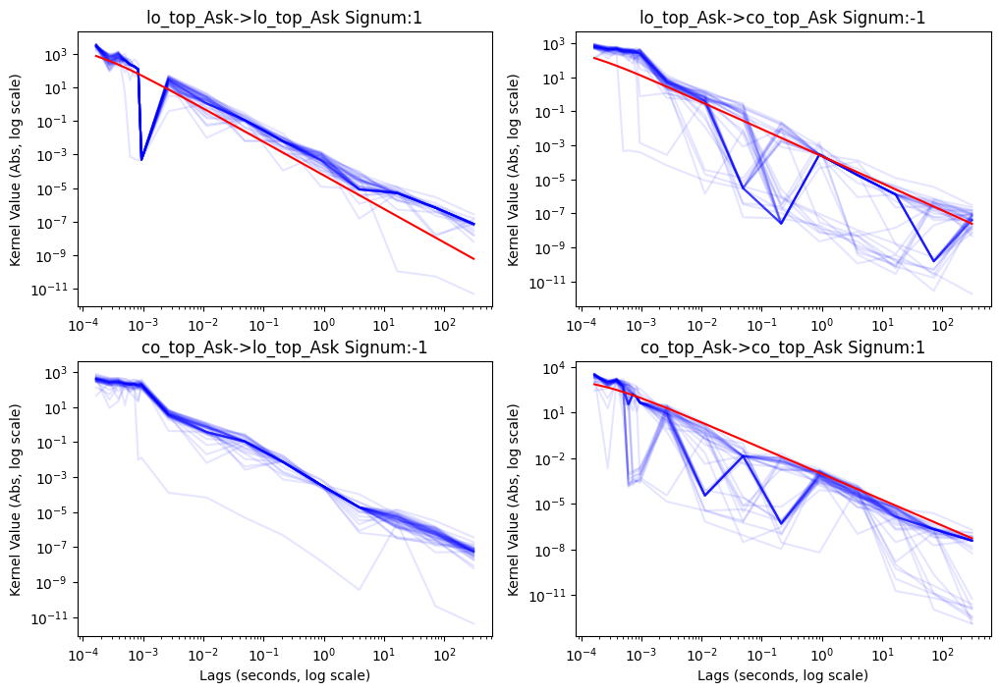

In [24]:

fig = plt.figure(figsize = (12,8))

fig.tight_layout()
counter = 1
for col1 in ["lo_top_Ask","co_top_Ask"]:
    for col2 in ["lo_top_Ask","co_top_Ask"]:
        points = np.array(res[col1 + '->' + col2]).reshape((52,18,2))
        for j in range(18):
            t = points[:,j,1]
            med = np.median(t)
            if np.abs(med) < 1e-18: med = np.mean(t[np.abs(t)>1e-18])
            t[np.abs(med/t) > 1e6] = med
            t[np.abs(med/t) < 1e-6] = med
            points[:,j,1] = t
        
        s = np.sign(np.sum(points,axis=1)[:,1].mean())
        plt.subplot(2,2,counter)
        counter+=1
        plt.title(col1 + '->' + col2 + " Signum:" + str(int(s)))
        for p in points:
            plt.plot(p[:,0][1:], np.abs(p[:,1][1:]), alpha = 0.1, color='b')
        if col1 + '->' + col2 in params.keys():
            kernelParams = params[col1 + '->' + col2]
            gamma = kernelParams[1][2]
            beta = kernelParams[1][1]
            # norm = np.average(norms[col1+"->"+col2])
            # if "inspread" in col2: norm = norm*(0.0169)**0.7479
            alpha = kernelParams[1][0]
            
            # time = p[:,0][1:]
            plt.plot(p[:,0][1:], np.abs(alpha/((1 + gamma*p[:,0][1:])**beta)), color = "r")
            # kernelParams2= params2[col1 + '->' + col2]
            # plt.plot(p[:,0][1:], np.abs(np.exp(kernelParams[1][0])*np.exp(p[:,0][1:]*kernelParams[1][1])), color = "orange")
        plt.xscale("log")
        plt.yscale("log")
        if counter > 3: plt.xlabel("Lags (seconds, log scale)") 
        plt.ylabel("Kernel Value (Abs, log scale)") 
plt.show()
fig.savefig('/SAN/fca/Konark_PhD_Experiments/results/kernelShapes.png', dpi=100)

In [28]:
mat = np.zeros((12,12))
for i in range(len(cols)):
    for j in range(len(cols)):
        mat[i][j] = np.average(norms[cols[i]+"->"+cols[j]])
mat[:,5] = mat[:,5]*(0.0169)**0.7479
mat[:,6] = mat[:,6]*(0.0169)**0.7479


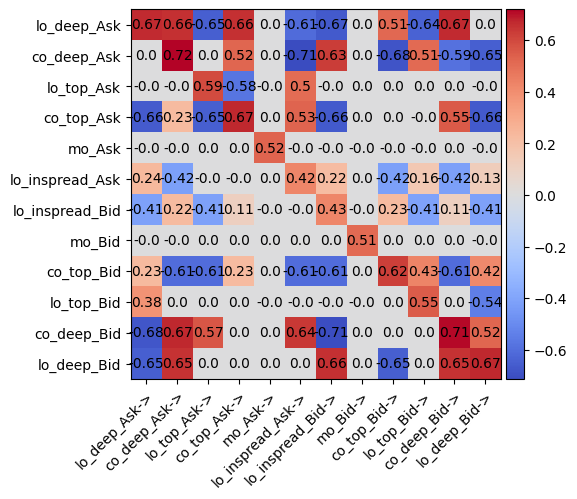

In [29]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig, ax = plt.subplots()
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
im = ax.imshow(mat.transpose(), cmap='coolwarm')
fig.colorbar(im, cax=cax, orientation='vertical')
# Show all ticks and label them with the respective list entries
ax.set_xticks(np.arange(len(cols)), labels=[c +"->" for c in cols])
ax.set_yticks(np.arange(len(cols)), labels=cols)

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(len(cols)):
    for j in range(len(cols)):
        text = ax.text(i,j, np.round(mat[i][j], decimals=2),
                               ha="center", va="center")
# fig.savefig("heatmap.png")
plt.show()


In [54]:
print(np.max(np.linalg.eig(mat)[0]))

(0.7615008834223231+0.07626698612559768j)


In [77]:
for c in cols:
    print(c, np.median(res[c]), np.std(res[c]))
    

lo_deep_Ask 428.59267178746717 156.02862307870103
co_deep_Ask 440.65823242106933 215.51889014563702
lo_top_Ask 1691.8042946456408 286.35994087363144
co_top_Ask 1981.9980748357648 410.80915418279517
mo_Ask 852.9430698189418 205.1073995887334
lo_inspread_Ask 18104.85056039782 5380.432318125008
lo_inspread_Bid 22480.082015429114 7826.537794636094
mo_Bid 877.5284420941741 202.16800715387197
co_top_Bid 2296.013300225726 507.5335195133673
lo_top_Bid 1750.1524427592694 264.47753280399183
co_deep_Bid 355.08599608213586 200.7314423732584
lo_deep_Bid 336.6339259963787 170.72467823292106


In [82]:
thetas['2019-01-02'][0]

array([0.05176265, 0.06640538, 0.14195354, 0.16167419, 0.08771898,
       1.76720089, 1.62137429, 0.08621747, 0.20826957, 0.16730915,
       0.04875842, 0.06712591])

In [3]:
import pandas as pd
thetas = {}
for d in pd.date_range(dt.date(2019,1,2), dt.date(2019,3,31)):
    try:
        with open("/SAN/fca/Konark_PhD_Experiments/extracted/AAPL.OQ_Params_"+d.strftime("%Y-%m-%d")+"_"+d.strftime("%Y-%m-%d")+"_IS_osqpSparse_bounds", "rb") as f:
            t = pickle.load(f)
        thetas[d.strftime("%Y-%m-%d")] = t
    except:
        continue
with open("/SAN/fca/Konark_PhD_Experiments/extracted/AAPL.OQ_Params_2019-01-02_2019-03-31_IS_osqpSparseTODNorm_bounds", "wb") as f:
    pickle.dump(thetas, f)

In [2]:
# intc : 0.941
# apple : 0.7479
# tsla: 0.5283
# amzn: 0.5966`

In [3]:
# aapl 0.01690555032073594
# intc 0.010145469326510061
# tsla 0.1617587373900753
# amzn 0.5183059875370096

In [4]:
# intc = [1.9273972715318866, 2.4140811965811966, 4.618395792241945, 4.459412393162392, 1.0594575936883628, 1.0259779750164364, 1.0003706443129519, 1.1384771531886917, 4.037223865877713, 4.167174556213017, 2.286552432610125, 1.8956147271531887]
# intc_s = 12*[0]
# for i in range(6):
#     intc_s[i] = (intc[i] + intc[11 -i ])*0.5
#     intc_s[11-i] = intc_s[i]

In [5]:
# intc_s = [1.3291742343304844,
#  2.2448482015669513,
#  7.89707621082621,
#  6.617852118945869,
#  0.5408440170940172,
#  0.1327911324786325,
#  0.1327911324786325,
#  0.5408440170940172,
#  6.617852118945869,
#  7.89707621082621,
#  2.2448482015669513,
#  1.3291742343304844]

In [6]:
# poissonP = {}
# for i, c in zip(range(12), cols):
#     poissonP[c] = intc_s[i]

In [7]:
# with open("/SAN/fca/Konark_PhD_Experiments/extracted/INTC.OQ_ParamsInferredWCutoff_2019-01-02_2019-03-31_poisson", "rb") as f:
#     poissonP =pickle.load(f)

In [8]:
# Poisson:

# INTC raw: [1.3457603276353278, 2.2846180555555553, 8.014011752136751, 6.721590990028491, 0.5431775284900285, 0.13171296296296298, 0.133869301994302, 0.5385105056980057, 6.514113247863247, 7.78014066951567, 2.2050783475783473, 1.312588141025641]
# INTC Symmetric : [1.3291742343304844,
#  2.2448482015669513,
#  7.89707621082621,
#  6.617852118945869,
#  0.5408440170940172,
#  0.1327911324786325,
#  0.1327911324786325,
#  0.5408440170940172,
#  6.617852118945869,
#  7.89707621082621,
#  2.2448482015669513,
#  1.3291742343304844]

# AAPL raw: 1.9273972715318866, 2.4140811965811966, 4.618395792241945, 4.459412393162392, 1.0594575936883628, 1.0259779750164364, 1.0003706443129519, 1.1384771531886917, 4.037223865877713, 4.167174556213017, 2.286552432610125, 1.8956147271531887]
# AAPL Symmetric: [1.9115059993425376,
 # 2.3503168145956606,
 # 4.392785174227481,
 # 4.248318129520053,
 # 1.0989673734385272,
 # 1.0131743096646941,
 # 1.0131743096646941,
 # 1.0989673734385272,
 # 4.248318129520053,
 # 4.392785174227481,
 # 2.3503168145956606,
 # 1.9115059993425376]

In [1]:
import sys
import datetime as dt
sys.path.append("/home/konajain/code/lobSimulations")
from hawkes import inference
import pickle

In [2]:
a, b = inference.run(dt.date(2019,1,2), dt.date(2019,3,31), ric = "TSLA.OQ" , avgSpread = 0.1617, spreadBeta=0.5283 , suffix = "_IS_osqpSparseTODNorm_bounds")

/tmp/ipykernel_25950/3294906861.py:1: DtypeWarning: Columns (7) have mixed types.Specify dtype option on import or set low_memory=False.
  a, b = inference.run(dt.date(2019,1,2), dt.date(2019,3,31), ric = "TSLA.OQ" , avgSpread = 0.1617, spreadBeta=0.5283 , suffix = "_IS_osqpSparseTODNorm_bounds")


kernel norm  2019-01-02 [[ 6.84884990e-01  6.86769627e-25 -1.82536601e-01 -1.24943135e-23
  -6.32257627e-24 -3.02028645e-24  3.00520258e-24  2.99671826e-24
   3.06804957e-24  5.02373641e-24  5.04233085e-24  7.81149979e-25]
 [ 5.74639766e-24  6.62780281e-01 -6.71269172e-24 -4.88806692e-24
  -1.61047587e-24  1.67072483e-24  1.17329830e-24 -1.31700707e-23
  -3.52742812e-02  1.74393981e-02  1.38558933e-05 -1.68253513e-01]
 [-3.87308092e-01 -8.15220390e-02  5.19389561e-01  3.65132667e-02
  -1.37304791e-23 -1.94409958e-23 -4.48125956e-24 -2.87258165e-24
  -3.08612888e-24 -4.37818618e-24 -1.11055981e-24  1.12826609e-24]
 [ 5.62576811e-04  3.80515730e-24 -1.90416735e-01  6.10655221e-01
   1.32658034e-23  1.58455678e-02  4.67516014e-24 -1.47548299e-23
  -1.16424244e-23 -2.59732677e-24 -6.79802904e-02  4.50957285e-25]
 [-3.01570350e-24  5.28441195e-25 -5.70096375e-25  3.35012286e-25
   5.11226186e-01 -1.17909555e-25  1.08315054e-24  1.27800497e-24
   1.64853218e-25  2.50213314e-24  1.84457093e-2

/home/konajain/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/konajain/.local/lib/python3.8/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


lo_top_Ask->lo_top_Ask (1.0, array([4.71206608e+03, 2.09254536e+00, 8.30383435e+03]))
co_top_Ask->lo_top_Ask (1.0, array([6.09156820e+02, 1.55836792e+00, 2.25998129e+04]))
exo  co_top_Ask [0.06910519254991625, 0.7666335053353561, 0.05897027790359394, 0.7780718485876048, 0.0813567405522756, 0.46626574569199986, 0.0723146647969449, 0.41678154371198306, 0.05832229597484094, 0.44758067640662724, 0.06499629180482136, 0.3142584646962087, 0.06853015722067095, 0.3000741514717094, 0.09964314559006539, 0.31683226262226083, 0.09868408821484818, 0.36365162861909406, 0.0964784593298702, 0.30251467610078975, 0.05750748207954617, 0.25900766841291406, 0.10065688475307866, 0.5405297661876175, 0.07824523285992005, 0.44138663808675793, 0.07752218273672525, 0.38466523245540746, 0.05096680095943432, 0.4107076993106398, 0.08455968715361759, 0.5414264919014917, 0.08532251123213307, 0.14825868759078117, 0.058724133584465855, 0.3486294147099024, 0.08011521079765893, 0.3405890624923545, 0.09534383830953455, 0.2

In [3]:
with open("/SAN/fca/Konark_PhD_Experiments/extracted/TSLA.OQ_ParamsInferredWCutoff_2019-01-02_2019-03-31_CLSLogLin_10", "rb") as f:
    params = pickle.load(f)

In [4]:
cols = ["lo_deep_Ask", "co_deep_Ask", "lo_top_Ask","co_top_Ask", "mo_Ask", "lo_inspread_Ask" ,
            "lo_inspread_Bid" , "mo_Bid", "co_top_Bid", "lo_top_Bid", "co_deep_Bid","lo_deep_Bid" ]
for c in cols:
    print(c, params[c])

lo_deep_Ask 0.14620140894372036
co_deep_Ask 0.14263135286455145
lo_top_Ask 0.2520867896532889
co_top_Ask 0.13513682042421676
mo_Ask 0.12522931884403982
lo_inspread_Ask 0.2746476565899335
lo_inspread_Bid 0.2746476565899335
mo_Bid 0.12522931884403982
co_top_Bid 0.13513682042421676
lo_top_Bid 0.2520867896532889
co_deep_Bid 0.14263135286455145
lo_deep_Bid 0.14620140894372036


In [27]:
import numpy as np
np.sum(np.multiply((np.array([1 - 0.51, -0.01, 0.09, -0.07, 0, 0.13, 0.12, 0., -0.01, 0.08, -0.08, 0])), [1.9273972715318866, 2.4140811965811966, 4.618395792241945, 4.459412393162392, 1.0594575936883628, 1.0259779750164364, 1.0003706443129519, 1.1384771531886917, 4.037223865877713, 4.167174556213017, 2.286552432610125, 1.8956147271531887]))

1.3872797501643654

In [26]:
import numpy as np
np.sum(np.multiply((np.array([1-0.51, 0.0, 0., 0.38, 0, -0.06, 0.19, 0., -0.05, -0.12, 0.17, 0.16])), [1.9273972715318866, 2.4140811965811966, 4.618395792241945, 4.459412393162392, 1.0594575936883628, 1.0259779750164364, 1.0003706443129519, 1.1384771531886917, 4.037223865877713, 4.167174556213017, 2.286552432610125, 1.8956147271531887]))

2.757603246219592

In [28]:
np.dot(np.eye(len(cols)) - mat, np.array([1.9273972715318866, 2.4140811965811966, 4.618395792241945, 4.459412393162392, 1.0594575936883628, 1.0259779750164364, 1.0003706443129519, 1.1384771531886917, 4.037223865877713, 4.167174556213017, 2.286552432610125, 1.8956147271531887]).transpose())

array([2.76565504, 1.35187119, 5.04096606, 2.33981888, 0.514486  ,
       1.63874984, 4.18000639, 0.58678493, 1.91747885, 1.80024986,
       1.30660276, 4.20493202])

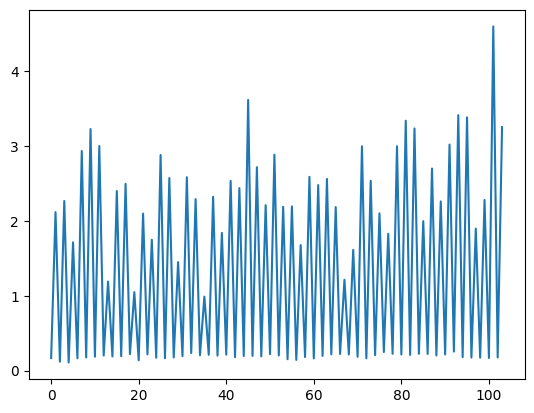

In [20]:
import numpy as np
a = [0.371541477615966, 6.959113253573011, 0.4536516261140658, 7.578817068493711, 0.39491090469610546, 6.091928428236468, 0.38314423480329135, 6.8561972026772215, 0.26702227201554635, 5.803822473420363, 0.3164121396031351, 6.215347942643202, 0.21604532868332332, 6.843473690223818, 0.33889351799185746, 3.770707732108445, 0.33690504903441953, 4.087939718405212, 0.4525075510695076, 4.201307852613159, 0.17904591447479298, 4.168846150839261, 0.390682784479791, 6.718162995683299, 0.25240652592438284, 6.681825836602974, 0.345591111031541, 5.049025867727563, 0.3395983886294351, 7.175398559969878, 0.2967626384649797, 4.829582679693312, 0.3044870888310612, 3.7923966222449854, 0.27763908024101847, 3.907540166908526, 0.2584591529052149, 2.5869085990235083, 0.22201320140748343, 4.738865478359925, 0.269137312036689, 4.406045810288633, 0.2094917633341811, 8.4777623243811, 0.37847035570090315, 3.6287844486886236, 0.3463107749768989, 2.4384996071503706, 0.4103110718593859, 2.816047660360689, 0.3342998820764092, 3.575380168842801, 0.23149342064283115, 3.9406763778847798, 0.3693425174750124, 2.2861749279871573, 0.17848652009819774, 3.6728222591895827, 0.32633151172237906, 3.8988581688389665, 0.3024775914750008, 3.3003772712366817, 0.34346187907823167, 3.567528749115445, 0.30384578008628293, 5.959653079505134, 0.2966360559855427, 2.6410235777303273, 0.4195814902994905, 5.006835988290404, 0.34606313269515315, 7.2487689310043955, 0.28192042446582044, 3.718968751028073, 0.33707835725124724, 3.3403883130650867, 0.4441078707026677, 5.859886045251789, 0.3681562150921675, 4.648103186520064, 0.38910852709921895, 4.013800256678438, 0.3523439552366879, 3.7307754379625546, 0.23765925159810486, 3.3102087795628425, 0.4143424154153315, 4.726093181170256, 0.5115362915137727, 9.366291300628072, 0.4995979907117295, 6.1432613617797855, 0.5606741097863611, 5.4116838966102225, 0.24295820871953241, 7.3759251710260845]
a = [0.09487785172170128, 0.35000257341999563, 0.08364311279308988, 0.6097952187106696, 0.07983496779944539, 0.4788782374761683, 0.10238355416317067, 0.26859865016947, 0.08772230300315058, 0.2682323957858738, 0.09457879549265727, 0.2313118549799119, 0.10374900565793055, -0.45171569360407215, 0.09457181069930908, 0.21401324672662309, 0.08689446589421632, 0.1975940986329416, 0.1031999244141531, 0.0745698294164514, 0.07885633311941734, 0.20784872605794663, 0.08748412639857431, 0.26768285681849063, 0.08753387573854816, 0.1756565068678892, 0.0848171271515181, 0.4363256894018447, 0.08931167993781747, 0.7284333650334036, 0.08770731321265136, 0.2634590542566392, 0.08831430545391795, -0.14050723274013702, 0.11846814196149033, -0.2842367086224823, 0.0975902230395211, 0.1855188234459105, 0.09395187390415342, 0.217541324808405, 0.12303594642968124, 0.3161076896960235, 0.12182157871527831, 0.36823478351703104, 0.12285636699480426, 0.37439845577467534, 0.10874959020287864, 0.060219712486434235, 0.11677775223262123, -0.251910955122233, 0.11947839658706556, 0.19668701280681755, 0.11416076618352701, 0.15835426281519213, 0.09763590094922642, -0.18393237290008088, 0.07632593021302922, 0.043534557585615974, 0.12511229910895671, 0.36956720686506084, 0.09258256346437817, 0.11886488885180876, 0.09368447933219208, 0.014633792426105213, 0.09021797167603696, 0.18887050629098867, 0.09819323738161387, 0.26924225930637813, 0.10882120474065422, 0.2742472216074125, 0.09201256976658068, 0.02196302895697566, 0.08809634483050169, 0.17566220531539092, 0.08627172053739572, 0.17402058170606494, 0.09037417587861411, 0.18699078716631612, 0.08220338119435575, 0.22565592772446666, 0.0882503191567164, 0.22242748667432202, 0.09481508906934523, 0.3169289075672266, 0.10755976765351974, 0.2494443750462439, 0.07526836405338527, 0.2396563312567718, 0.003367049087294119, 0.5641923896390884, 0.002157906623391953, 0.22338081765692852, -9.943130731719274e-28, 0.25408569582245255, 5.066953438306897e-26, 0.26453945349355595]
a  = [0.1673091457132755, 2.117333868193374, 0.11943912812017114, 2.2662231966111532, 0.10881152045852631, 1.7136874929378048, 0.1646346594330279, 2.9338576768528726, 0.17551213125505358, 3.22701312844342, 0.1858174811140983, 3.0004723124716315, 0.20122461310211864, 1.1897198518974315, 0.1882828240603099, 2.399481417160142, 0.19219851847107292, 2.495304375927053, 0.2206598299204268, 1.0487294433187415, 0.1382646551530294, 2.0975568176921926, 0.21712041225151302, 1.7486043789123995, 0.17155763357982973, 2.8808489837587428, 0.16524081690149997, 2.572802277719832, 0.175759511812405, 1.4496623715614076, 0.19392619953410462, 2.5837157064659206, 0.2344729820629039, 2.2913830761968628, 0.20583315968011315, 0.988545104898023, 0.21097495797937152, 2.322795454054396, 0.20047552758276022, 1.8394831648550922, 0.21302519943429943, 2.535109916041026, 0.17884041401052425, 2.438611908296411, 0.1949965655235108, 3.6157745195021667, 0.1965574056543585, 2.717225089723018, 0.19011521684771845, 2.209990178648906, 0.21979650833223702, 2.8850458387591087, 0.20298950297463184, 2.188514990949184, 0.15297929408717129, 2.194003248686968, 0.14357882007532835, 1.6773096888743009, 0.181734814316975, 2.5886687963670485, 0.16325671822635163, 2.4788156008455324, 0.1964391409126945, 2.560772571511251, 0.21767066682397548, 2.184589671602196, 0.22168290775844388, 1.2138316170533487, 0.21514390896997682, 1.6130947919261096, 0.18439175142012326, 2.9974989365182463, 0.16428361631034316, 2.535583809382022, 0.2069555266462064, 2.101407981800336, 0.2484663011574478, 1.8275465404541857, 0.2245673193991042, 2.99771884296401, 0.215073465459485, 3.338534598945684, 0.20968725636250152, 3.235710136453768, 0.22372289304571966, 1.9970797968758514, 0.22281815923795179, 2.6996423651776933, 0.2028202850537349, 2.260376115168111, 0.21628308567899043, 3.0198067240510573, 0.25421173528913643, 3.4135578878620714, 0.17956757421653194, 3.38397322667211, 0.17441406061467063, 1.8975683374895786, 0.1725410324589618, 2.2796220469464683, 0.1684257764678912, 4.597594513377544, 0.17538876047971136, 3.2529078852945337]
plt.plot(a)

In [25]:
import numpy as np
num_nodes = 12
mat = np.zeros((num_nodes, num_nodes))
for i in range(num_nodes):
        for j in range(num_nodes):
            kernelParams = params.get(cols[i] + "->" + cols[j], None)
            if kernelParams is None: continue
            if np.isnan(kernelParams[1][2]): continue
            # print(cols[i] + "->" + cols[j])
            # print((kernelParams[0]*np.exp(kernelParams[1][0]) , kernelParams[1][1] , kernelParams[1][2]))
            mat[i][j]  = kernelParams[0]*kernelParams[1][0]/((-1 + kernelParams[1][1])*kernelParams[1][2]) # alpha/(beta -1)*gamma
        # baselines[i] = params[cols[i]]

In [27]:
(500000)**(-0.7)

0.0001024993230105208

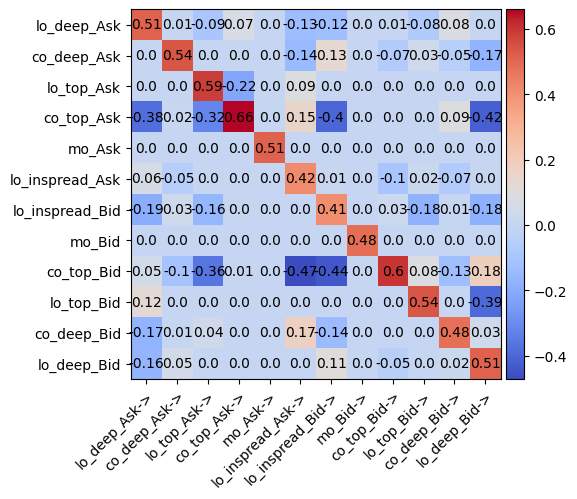

In [28]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig, ax = plt.subplots()
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
im = ax.imshow(mat.transpose(), cmap='coolwarm')
fig.colorbar(im, cax=cax, orientation='vertical')
# Show all ticks and label them with the respective list entries
ax.set_xticks(np.arange(len(cols)), labels=[c +"->" for c in cols])
ax.set_yticks(np.arange(len(cols)), labels=cols)

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(len(cols)):
    for j in range(len(cols)):
        text = ax.text(i,j, np.round(mat[i][j], decimals=2),
                               ha="center", va="center")
# fig.savefig("heatmap.png")
plt.show()


In [66]:
with open("/SAN/fca/Konark_PhD_Experiments/AAPL.OQ_2019-01-02_2019-03-31_graph", "rb") as f:
    aaplGraph = pickle.load(f)

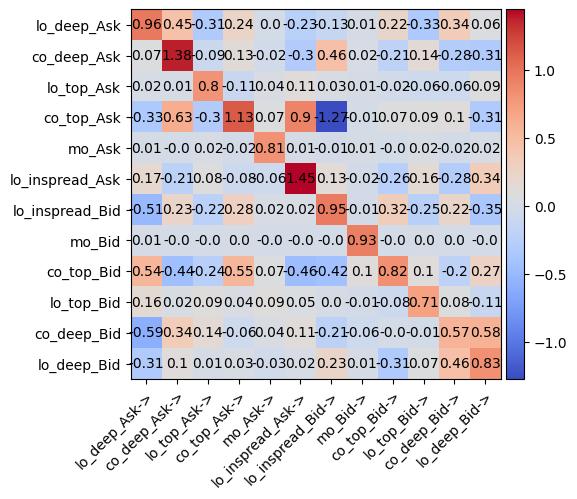

In [68]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig, ax = plt.subplots()
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
im = ax.imshow(aaplGraph, cmap='coolwarm')
fig.colorbar(im, cax=cax, orientation='vertical')
# Show all ticks and label them with the respective list entries
ax.set_xticks(np.arange(len(cols)), labels=[c +"->" for c in cols])
ax.set_yticks(np.arange(len(cols)), labels=cols)

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(len(cols)):
    for j in range(len(cols)):
        text = ax.text(i,j, np.round(aaplGraph[j][i], decimals=2),
                               ha="center", va="center")
# fig.savefig("heatmap.png")
plt.show()

In [332]:
statsmodels.tsa.stattools.acf(x)

array([1.        , 0.94      , 0.88009604, 0.82038415, 0.76096038,
       0.70192077, 0.64336134, 0.58537815, 0.52806723, 0.47152461,
       0.41584634, 0.36112845, 0.30746699, 0.25495798, 0.20369748,
       0.15378151, 0.10530612])

In [131]:
np.max(np.linalg.eig(mat)[0]).real

0.816010753826938

In [30]:
np.isnan(params['lo_deep_Bid->co_deep_Bid'][1][2])

True

In [31]:
with open("/SAN/fca/Konark_PhD_Experiments/extracted/AAPL.OQ_Params_2019-01-02_2019-03-29_dictTOD", "rb") as f:
    tod=pickle.load(f)

In [ ]:
tod

In [34]:
m = {}
for k, v in tod.items():
    m[k] = np.max(list(v.values()))

In [35]:
m

{'lo_deep_Bid': 1.4925101753382186,
 'co_deep_Bid': 1.4053817763046552,
 'lo_top_Bid': 1.8416272255932555,
 'co_top_Bid': 1.6491539912896889,
 'mo_Bid': 1.9824861638553208,
 'lo_inspread_Bid': 2.42307948704813,
 'lo_deep_Ask': 1.492630043149286,
 'co_deep_Ask': 1.3996496724205876,
 'lo_top_Ask': 1.701669739360263,
 'co_top_Ask': 1.5057351339228102,
 'mo_Ask': 1.9147712003984139,
 'lo_inspread_Ask': 2.3903419312566854}

In [81]:
2.42*0.42

1.0164

In [4]:
import datetime
import time

In [294]:
resPath = "/SAN/fca/Konark_PhD_Experiments/simulated/AAPL.OQ_ResultsWCutoff_2019-01-02_2019-03-31_CLSLogLin_10_tmp"
with open(resPath, 'rb') as f:
    # results = pickle.load(f)
    res = []
    while True:
                    try:
                        res.append(pickle.load(f))
                    except EOFError:
                        break
results = ([i[0] for i in res],[i[1] for i in res])

ask_t = []
bid_t = []
ask_d = []
bid_d= []
spread = []
for r in results[1]:
    ask_t.append(r['Ask_touch'][0])
    bid_t.append(r['Bid_touch'][0])
    ask_d.append(r['Ask_deep'][0])
    bid_d.append(r['Bid_deep'][0])
    spread.append(100*(r['Ask_touch'][0] - r['Bid_touch'][0]))
t = np.append([0], np.array(results[0][1:])[:,1])
t = t.astype(float) + 9.5*3600

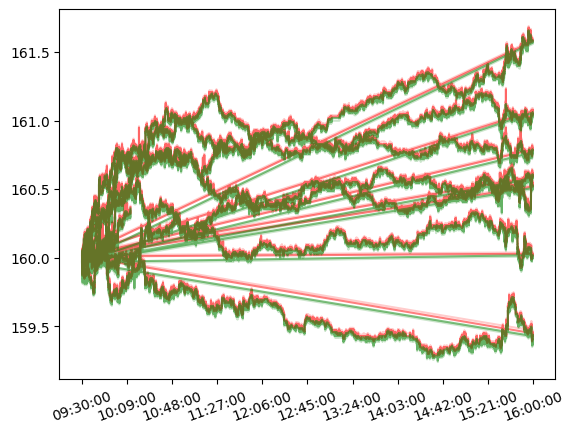

In [295]:
plt.plot(t, ask_t, color = "r", alpha =0.5)
plt.plot(t, ask_d, color="r", alpha = 0.2)
plt.plot(t, bid_t, color="g", alpha =0.5)
plt.plot(t, bid_d, color="g", alpha = 0.2)
count = int((max(t) - min(t))/10)
plt.xticks(ticks = np.arange(min(t), max(t), count), labels = [time.strftime('%H:%M:%S', time.gmtime(x)) for x in np.arange(min(t), max(t), count)], rotation = 20)
plt.show()

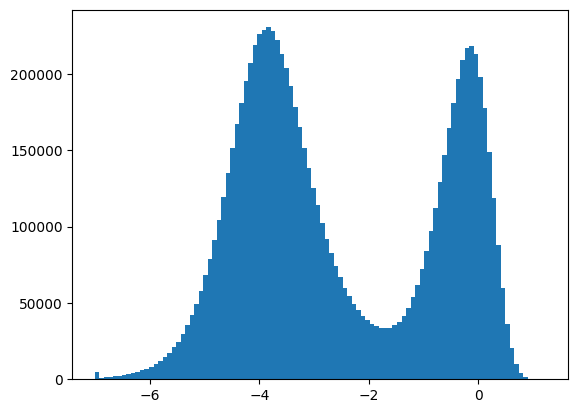

In [15]:
import os
dataPath = "/SAN/fca/Konark_PhD_Experiments/simulated"
ric = "AAPL.OQ"
suffix = "CLSLogLin_10"
paths = [dataPath + "/" + i for i in os.listdir(dataPath) if (ric in i)&(suffix in i)&(~("tmp" in i))]
t = []
for p in paths:
    resPath = p
    with open(resPath, 'rb') as f:
        results = pickle.load(f)
    t += [np.diff(np.append([0], np.array(results[0][1:])[:,1]).astype("float"))]
t = np.hstack(t)
fig = plt.hist(np.log(t)/np.log(10), bins =100,density=True)

Text(0.5, 0, 'Time Log(10) Scale (in secs)')

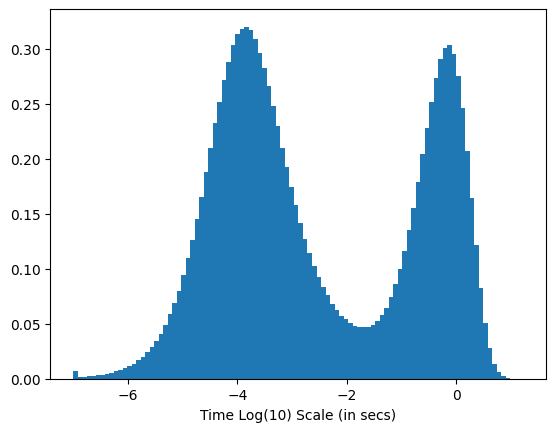

In [16]:
fig = plt.hist(np.log(t)/np.log(10), bins =100,density=True)
plt.xlabel("Time Log(10) Scale (in secs)")

In [43]:
df = pd.DataFrame(np.array(results[0][1:]), columns = ["event","time","C"])
df['tod'] = df.time.astype(float).apply(lambda x: np.min([12,int(np.floor(x/1800))]))
n = df.groupby(["event","tod"]).count()
n

time    C
event       tod           
co_deep_Ask 0     452  452
            1     574  574
            2     356  356
            3     351  351
            4     331  331
...               ...  ...
mo_Bid      8     136  136
            9     190  190
            10    215  215
            11    230  230
            12    489  489

[156 rows x 2 columns]

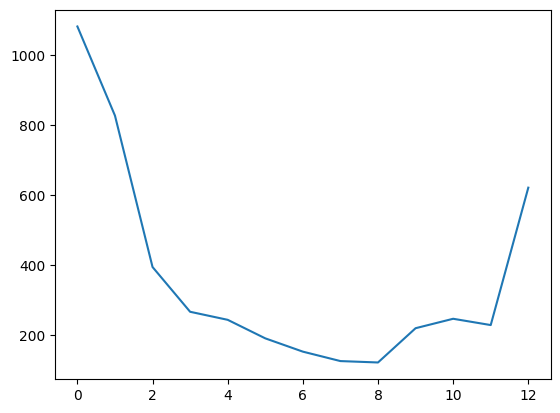

In [51]:
plt.plot(n.loc["mo_Ask"].reset_index().tod, n.loc["mo_Ask"].reset_index().time)

In [42]:
df.time.iloc[0]

'0.0629531528351952'

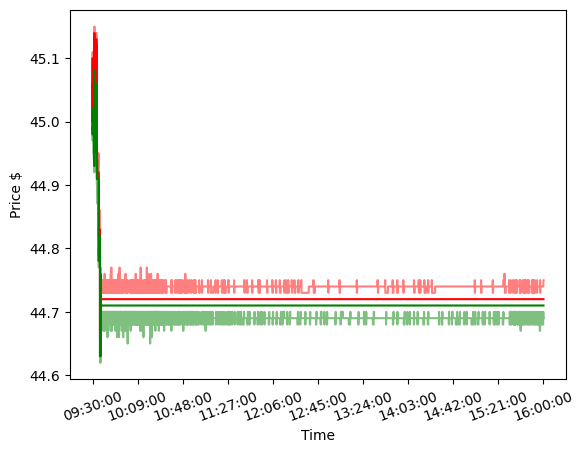

In [6]:
import time
import os
import matplotlib.pyplot as plt
import pickle
import numpy as np
dataPath = "/SAN/fca/Konark_PhD_Experiments/simulated"
ric = "INTC.OQ"
suffix = "CLSLogLin_10"
paths = [dataPath + "/" + i for i in os.listdir(dataPath) if (ric in i)&(suffix in i)&(~("tmp" in i))]
for p in [paths[1]]:
    resPath = p
    with open(resPath, 'rb') as f:
        results = pickle.load(f)
        
    #     res = []
    #     while True:
    #                     try:
    #                         res.append(pickle.load(f))
    #                     except EOFError:
    #                         break
    # results = ([i[0] for i in res],[i[1] for i in res])
    
    ask_t = []
    bid_t = []
    ask_d = []
    bid_d= []
    spread = []
    for r in results[1]:
        ask_t.append(r['Ask_touch'][0])
        bid_t.append(r['Bid_touch'][0])
        ask_d.append(r['Ask_deep'][0])
        bid_d.append(r['Bid_deep'][0])
        spread.append(100*(r['Ask_touch'][0] - r['Bid_touch'][0]))
    t = np.append([0], np.array(results[0][1:])[:,1])
    t = t.astype(float) + 9.5*3600
    plt.plot(t, ask_t, color = "r")
    plt.plot(t, ask_d, color="r", alpha = 0.5)
    plt.plot(t, bid_t, color="g")
    plt.plot(t, bid_d, color="g", alpha = 0.5)
count = int((max(t) - min(t))/10)
plt.xticks(ticks = np.arange(min(t), max(t), count), labels = [time.strftime('%H:%M:%S', time.gmtime(x)) for x in np.arange(min(t), max(t), count)], rotation = 20)
plt.xlabel("Time")
plt.ylabel("Price $")
plt.show()

In [36]:
simDf = pd.DataFrame(results[1])
simDf['Ask'] = simDf['Ask_touch'].apply(lambda x: x[0])
simDf['Bid'] =  simDf['Bid_touch'].apply(lambda x: x[0])
simDf['Mid'] = 0.5*(simDf['Ask'] + simDf['Bid'])
simDf['Spread'] = simDf['Ask'] - simDf['Bid']
simDf['Returns'] = simDf['Mid'].apply(np.log).diff().apply(np.exp) - 1
simDf.head()

,Ask_touch,Bid_touch,Ask_deep,Bid_deep,Ask,Bid,Mid,Spread,Returns
0,"(260.01, 221)","(259.98, 471)","(260.02, 1108)","(259.97, 294)",260.01,259.98,259.995,0.03,NaN
1,"(260.0, 161)","(259.98, 471)","(260.01, 221)","(259.97, 294)",260.00,259.98,259.990,0.02,-0.000019
2,"(259.99, 100)","(259.98, 471)","(260.0, 161)","(259.97, 294)",259.99,259.98,259.985,0.01,-0.000019
3,"(259.99, 110)","(259.98, 471)","(260.0, 161)","(259.97, 294)",259.99,259.98,259.985,0.01,0.000000
4,"(259.99, 110)","(259.98, 571)","(260.0, 161)","(259.97, 294)",259.99,259.98,259.985,0.01,0.000000


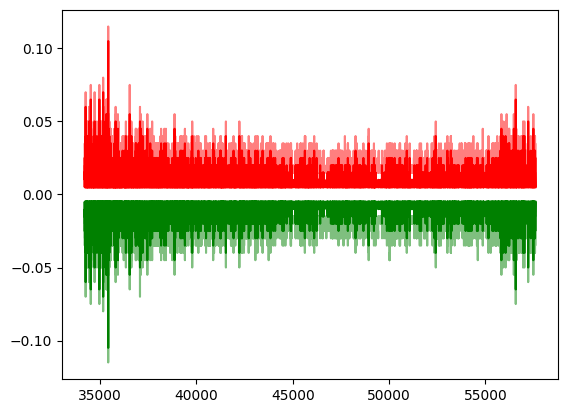

In [37]:
import time
import os
dataPath = "/SAN/fca/Konark_PhD_Experiments/simulated"
ric = "AAPL.OQ"
suffix = "CLSLogLin_10"
paths = [dataPath + "/" + i for i in os.listdir(dataPath) if (ric in i)&(suffix in i)&(~("tmp" in i))]
plt.plot(t, ask_t - simDf['Mid'].values, color = "r")
plt.plot(t, ask_d - simDf['Mid'].values, color="r", alpha = 0.5)
plt.plot(t, bid_t - simDf['Mid'].values, color="g")
plt.plot(t, bid_d - simDf['Mid'].values, color="g", alpha = 0.5)

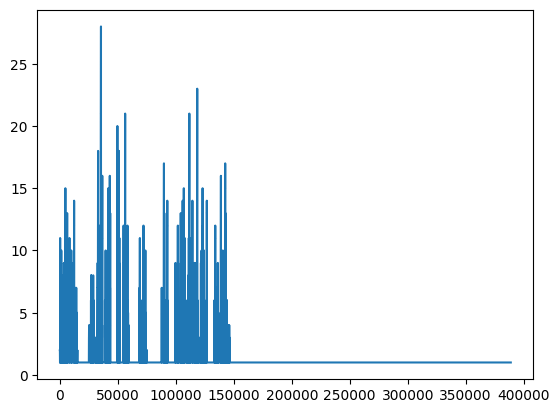

In [13]:
plt.plot(spread)

In [9]:
import time
import os
import matplotlib.pyplot as plt
import pickle
import numpy as np
dataPath = "/SAN/fca/Konark_PhD_Experiments/simulated"
ric = "INTC.OQ"
suffix = "CLSLogLin_10"
paths = [dataPath + "/" + i for i in os.listdir(dataPath) if (ric in i)&(suffix in i)&(~("tmp" in i))]

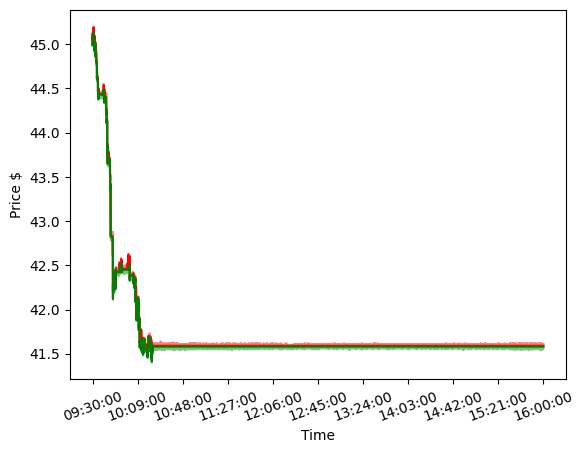

In [12]:
path = '/SAN/fca/Konark_PhD_Experiments/simulated/INTC.OQ_ResultsWCutoff_2019-01-02_2019-03-31_CLSLogLin_10_noAdj_62'
for p in [path]:
    resPath = p
    with open(resPath, 'rb') as f:
        results = pickle.load(f)
        
    #     res = []
    #     while True:
    #                     try:
    #                         res.append(pickle.load(f))
    #                     except EOFError:
    #                         break
    # results = ([i[0] for i in res],[i[1] for i in res])
    
    ask_t = []
    bid_t = []
    ask_d = []
    bid_d= []
    spread = []
    for r in results[1]:
        ask_t.append(r['Ask_touch'][0])
        bid_t.append(r['Bid_touch'][0])
        ask_d.append(r['Ask_deep'][0])
        bid_d.append(r['Bid_deep'][0])
        spread.append(100*(r['Ask_touch'][0] - r['Bid_touch'][0]))
    t = np.append([0], np.array(results[0][1:])[:,1])
    t = t.astype(float) + 9.5*3600
    plt.plot(t, ask_t, color = "r")
    plt.plot(t, ask_d, color="r", alpha = 0.5)
    plt.plot(t, bid_t, color="g")
    plt.plot(t, bid_d, color="g", alpha = 0.5)
count = int((max(t) - min(t))/10)
plt.xticks(ticks = np.arange(min(t), max(t), count), labels = [time.strftime('%H:%M:%S', time.gmtime(x)) for x in np.arange(min(t), max(t), count)], rotation = 20)
plt.xlabel("Time")
plt.ylabel("Price $")
plt.show()

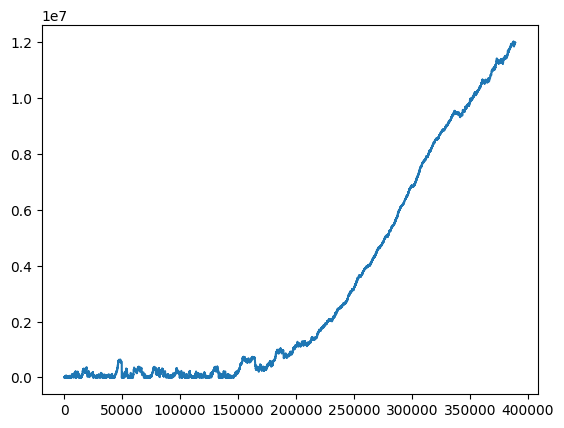

In [27]:
ask_t_q = []
for r in results[1]:
        ask_t_q.append(r['Ask_touch'][1])
plt.plot(ask_t_q)

In [ ]:
results[2][-1]

In [188]:
dfs = []
for d in pd.date_range(dt.date(2019,1,2), dt.date(2019,4,30)):
    try:
        df = pd.read_csv("/SAN/fca/Konark_PhD_Experiments/extracted/AMZN.OQ_"+d.strftime("%Y-%m-%d")+"_12D.csv")
        dfs.append(df)
    except:
        continue
df = pd.concat(dfs)

/SAN/fca/Konark_PhD_Experiments/extracted/AAPL_2019-01-08_34200000_57600000_message_10.csv


/tmp/ipykernel_15815/1917031692.py:4: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  data = l.load()
/home/konajain/code/lobSimulations/hawkes/dataLoader.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  theOrderBookFiltered[theOrderBookFiltered.columns[i]]  = theOrderBookFiltered[theOrderBookFiltered.columns[i]]/10000


In [108]:
data = pd.read_csv("/SAN/fca/Konark_PhD_Experiments/extracted/AAPL.OQ_2019-01-02_12D.csv")
data["Q"] = (data.Time//1800).astype(int)
avgEvents = data.groupby(["event", "Q"]).count()

/home/konajain/.local/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3508: DtypeWarning: Columns (7) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
(data.groupby(["event", "Q"])["Time"].count()/1800).to_dict()

In [30]:
with open(l.dataPath + ric + "_Params_" + str(sDate.strftime("%Y-%m-%d")) + "_" + str(eDate.strftime("%Y-%m-%d")) + "_dictTOD", "rb") as f:
        tod = pickle.load(f)

NameError: name 'l' is not defined

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

/home/konajain/.local/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3508: DtypeWarning: Columns (7) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


Text(0.5, 0, 'Time Log(10) Scale (in secs)')

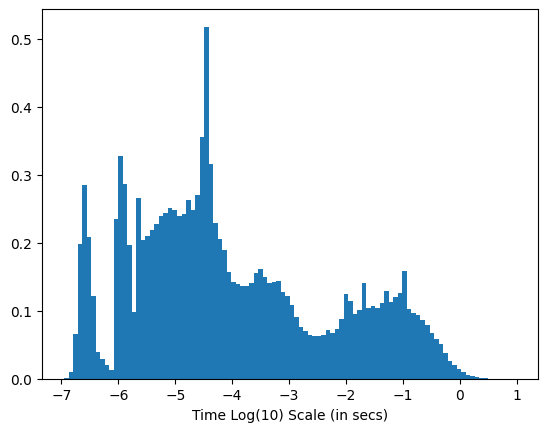

In [2]:
times = []
spreads = []
for d in ["2019-01-02", "2019-01-03", "2019-01-04", "2019-01-07", "2019-01-08", "2019-01-10", "2019-01-11", "2019-01-14", "2019-01-15", "2019-01-16", "2019-01-17", "2019-01-18", "2019-01-22", "2019-01-23", "2019-01-24", "2019-01-25", "2019-01-28", "2019-01-29", "2019-01-30", "2019-01-31"]:
    data = pd.read_csv("/SAN/fca/Konark_PhD_Experiments/extracted/INTC.OQ_"+ d +"_12D.csv")
    data =data.sort_values(["Time","OrderID"])
    times += [np.log(np.diff(data.Time)[np.diff(data.Time)>0])/np.log(10)]
    spreads += [(data['Ask Price 1'] - data['Bid Price 1']).values]
times = np.hstack(times)
fig = plt.hist(times, bins  = 100, density = True)
plt.xlabel("Time Log(10) Scale (in secs)") 

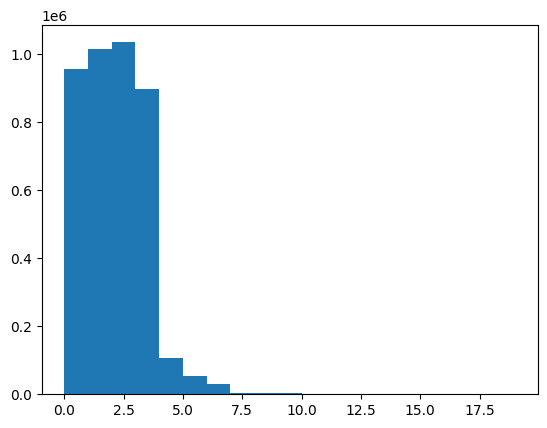

In [322]:
spreads = np.hstack(spreads)
pfig = plt.hist(spreads*100, bins =np.arange(20))

NameError: name 'time' is not defined

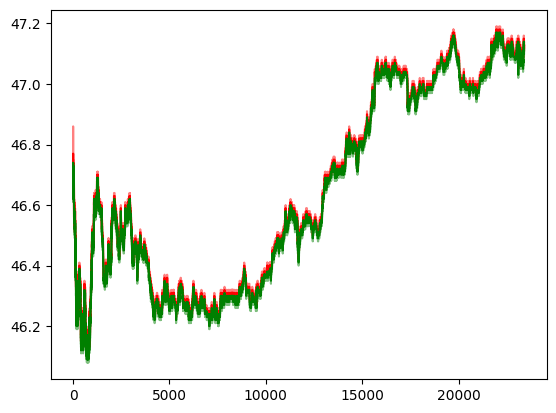

In [3]:
plt.plot(data.Time, data["Ask Price 1"], color = "r")
plt.plot(data.Time, data["Ask Price 2"], color="r", alpha = 0.5)
plt.plot(data.Time, data["Bid Price 1"], color="g")
plt.plot(data.Time, data["Bid Price 2"], color="g", alpha = 0.5)
t = data.Time.values
count = int((max(t) - min(t))/10)
plt.xticks(ticks = np.arange(min(t), max(t), count), labels = [time.strftime('%H:%M:%S', time.gmtime(x)) for x in np.arange(min(t), max(t), count)], rotation = 20)
plt.show()

In [308]:
32851.37061405182/3600

9.125380726125504

In [58]:
data = pd.read_csv("/SAN/fca/Konark_PhD_Experiments/extracted/AAPL.OQ_2019-01-02_12D.csv")

/home/konajain/.local/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3508: DtypeWarning: Columns (7) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [61]:
data["Tminus1"] = 0
data['Tminus1'].iloc[1:] = data['Time'].iloc[:-1] #floor T - Tminus1 to zero

/share/apps/python-3.8.5-shared/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [65]:
data = data.sort_values(["Time", "OrderID"])
data['prevSpread'] = data['Ask Price 1'] - data['Bid Price 1'] + data['BidDiff'] - data['AskDiff']

In [228]:
data

,Unnamed: 0,Time,Type,OrderID,Size,Price,TradeDirection,tmp,Ask Price 1,Ask Size 1,...,Ask Price 2,Ask Size 2,Bid Price 2,Bid Size 2,Date,BidDiff,AskDiff,BidDiff2,AskDiff2,event
681460,53,0.359834,1,2896681,20,1497500,-1,NaN,149.75,20,...,149.77,38,149.66,2360,2019-01-08,0.0,-0.02,0.0,-0.03,lo_inspread_Ask
441680,55,0.359834,1,3258361,25,1497500,-1,NaN,149.75,45,...,149.77,38,149.66,2360,2019-01-08,0.0,0.00,0.0,0.00,lo_top_Ask
333405,67,0.359834,1,3347585,50,1497700,-1,NaN,149.75,1685,...,149.77,88,149.66,2360,2019-01-08,0.0,0.00,0.0,0.00,lo_deep_Ask
441681,57,0.359834,1,3614613,50,1497500,-1,NaN,149.75,95,...,149.77,38,149.66,2360,2019-01-08,0.0,0.00,0.0,0.00,lo_top_Ask
441682,59,0.359834,1,3614729,70,1497500,-1,NaN,149.75,165,...,149.77,38,149.66,2360,2019-01-08,0.0,0.00,0.0,0.00,lo_top_Ask
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
645939,1245928,23399.977945,3,344066701,100,1507800,-1,NaN,150.78,16887,...,150.81,200,150.74,4800,2019-01-08,0.0,0.00,0.0,0.00,co_top_Ask
681458,1245929,23399.977966,4,344066409,9321,1507800,-1,NaN,150.78,7566,...,150.81,200,150.74,4800,2019-01-08,0.0,0.00,0.0,0.00,mo_Ask
645940,1245930,23399.977994,3,344071829,100,1507800,-1,NaN,150.78,7466,...,150.81,200,150.74,4800,2019-01-08,0.0,0.00,0.0,0.00,co_top_Ask
382866,1245931,23399.977997,1,344071857,100,1507900,-1,NaN,150.78,7466,...,150.79,100,150.74,4800,2019-01-08,0.0,0.00,0.0,-0.02,lo_deep_Ask


In [72]:
inputDataPath = "/SAN/fca/Konark_PhD_Experiments/extracted"
ric = "AAPL.OQ"
if True:
    paramsPath = inputDataPath + "/"+ric+"_ParamsInferredWCutoff_2019-01-02_2019-03-31_CLSLogLin_10"
    todPath = inputDataPath + "/"+ric+"_Params_2019-01-02_2019-03-29_dictTOD"
    with open(paramsPath, "rb") as f:
        params = pickle.load(f)
    with open(todPath, "rb") as f:
        tod = pickle.load(f)
    cols = ["lo_deep_Ask", "co_deep_Ask", "lo_top_Ask","co_top_Ask", "mo_Ask", "lo_inspread_Ask" ,
            "lo_inspread_Bid" , "mo_Bid", "co_top_Bid", "lo_top_Bid", "co_deep_Bid","lo_deep_Bid" ]
    num_nodes = len(cols)
    baselines = {}
    paramsDict = {}
    for i in range(num_nodes):
        for j in range(num_nodes):
            kernelParams = params.get(cols[i] + "->" + cols[j], None)
            if kernelParams is None: continue
            paramsDict[cols[i] + "->" + cols[j]]  = (kernelParams[0]*np.exp(kernelParams[1][0]), kernelParams[1][1] , kernelParams[1][2])
        baselines[cols[i]] = params[cols[i]]

In [96]:
tracked_intensities = [list(baselines.values())]
for t in np.linspace(0, 23400, int(23400/1e-1)):
    df = data.loc[(data.Time < t)&(data.Time >= t-10)]
    if len(df) == 0: continue
    tracked_intensity = []
    for col in cols:
        intensity = baselines[col]
        for r in df.iterrows():
            r = r[1]
            if r.event + '->' + col in paramsDict.keys():
                _params = paramsDict[r.event + "->" + col]
                if np.isnan(_params[2]): continue
                intensity += _params[0]*(t - r.Time + _params[2])**_params[1]
        tracked_intensity = tracked_intensity + [np.max([0,intensity])]
    print(t)
    print(tracked_intensity)
    tracked_intensities = tracked_intensities + [tracked_intensity]

0.8000034188180292
[0.0, 0.0, 1050.0977891807138, 0.0, 0.08897412698184373, 965.5555859179676, 0.0, 5008.363848627923, 0.0, 0.0, 51.523478027801815, 472.28506604695485]
0.9000038461702828
[0.10668167450138052, 0.0, 0.3345873059156286, 0.0, 0.08897412698184373, 0.5159244256944008, 0.0, 1.4556869548727045, 2.9063449540506126, 0.0, 3.3332845767540853, 12.810737775794841]
1.0000042735225365
[0.0, 29.32539471252373, 188.48674324370535, 0.0, 0.53181740251672, 8.778657554690415, 0.0, 202.5402700929181, 0.0, 1.5808744959520378, 25.720448507893394, 10.135780660840156]
1.1000047008747902
[0.05706239935674516, 0.3489937980517163, 0.27685393498838856, 0.04439991350404349, 0.13580656014918452, 0.25786722885475344, 0.07867720602674391, 0.4197636413021333, 0.0, 0.15640245170272293, 0.357981428627544, 0.20696158292772127]
1.2000051282270436
[0.0, 0.0, 86.61984650634906, 0.0, 0.10740153475031446, 31.07129663489284, 0.0, 6.925746504429674, 0.0, 7.339844194747256, 30.46394216494907, 0.0]
1.30000555557929

KeyboardInterrupt: 

In [101]:
tracked_intensities

[[0.04749560563268837,
  0.05192862476908565,
  0.18260796865188783,
  0.22565993650147217,
  0.08897412698184373,
  0.09751023614741482,
  0.12026419251561768,
  0.09470619653929904,
  0.25876950819645156,
  0.19172964214292926,
  0.04307418605186676,
  0.04149752060775365],
 [0.0,
  0.0,
  1050.0977891807138,
  0.0,
  0.08897412698184373,
  965.5555859179676,
  0.0,
  5008.363848627923,
  0.0,
  0.0,
  51.523478027801815,
  472.28506604695485],
 [0.10668167450138052,
  0.0,
  0.3345873059156286,
  0.0,
  0.08897412698184373,
  0.5159244256944008,
  0.0,
  1.4556869548727045,
  2.9063449540506126,
  0.0,
  3.3332845767540853,
  12.810737775794841],
 [0.0,
  29.32539471252373,
  188.48674324370535,
  0.0,
  0.53181740251672,
  8.778657554690415,
  0.0,
  202.5402700929181,
  0.0,
  1.5808744959520378,
  25.720448507893394,
  10.135780660840156],
 [0.05706239935674516,
  0.3489937980517163,
  0.27685393498838856,
  0.04439991350404349,
  0.13580656014918452,
  0.25786722885475344,
  0.0

In [104]:
tracked_intensities = np.array(tracked_intensities)
if True:
        def calc(event, Time, Tminus1):
            i_end = np.argmax(np.linspace(0, 23400, int(23400/1e-1)) > Time)
            i_start = np.argmax(np.linspace(0, 23400, int(23400/1e-1)) > Tminus1)
            idx = np.argmax(cols == event)
            return 1e-1*np.sum(tracked_intensities[i_start:i_end, idx])

In [105]:
tracked_intensities.shape

(29, 12)

In [108]:
np.argmax(np.linspace(0, 23400, int(23400/1e-1)) > 0.8)

8

In [109]:
np.linspace(0, 23400, int(23400/1e-1))[8]

0.8000034188180292

In [116]:
import pandas as pd
import numpy as np
import os
import pickle
import time
import datetime as dt
from scipy import stats
import statsmodels.api as sm
from hawkes import dataLoader
import matplotlib.pyplot as plt

In [140]:
ric = "TSLA.OQ"
sDate = dt.date(2019,1,2)
eDate = dt.date(2019,3,31)
suffix = "_CLSLogLin_10"

In [141]:
dataPath = "/SAN/fca/Konark_PhD_Experiments/simulated"
resultsPath = "/SAN/fca/Konark_PhD_Experiments/results"

In [147]:
rvs = {}
for d in pd.date_range(sDate,eDate):

        l = dataLoader.Loader(ric, d, d, nlevels = 2, dataPath = "/SAN/fca/Konark_PhD_Experiments/extracted/")
        data = l.load()
        if len(data): data = data[0]
        else: continue
        data['mid'] = 0.5*(data['Ask Price 1'] + data['Bid Price 1'])
        times = data.Time.values - 34200
        mid = data.mid.values
        # rv = []
        for t in range(1,2001):
            sample_x = np.linspace(0, 23400, int(23400/t))
            idxs = np.searchsorted(times, sample_x)[1:-1] - 1
            # print(idxs)
            sample_y = mid[idxs]
            rvs[t] =  np.hstack([rvs.get(t, np.array([])), np.square(np.diff(sample_y))])
        # rvs[d.strftime("%Y-%m-%d")] = rv

/SAN/fca/Konark_PhD_Experiments/extracted/TSLA_2019-01-02_34200000_57600000_message_10.csv


/home/konajain/code/lobSimulations/hawkes/dataLoader.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  theOrderBookFiltered[theOrderBookFiltered.columns[i]]  = theOrderBookFiltered[theOrderBookFiltered.columns[i]]/10000


/SAN/fca/Konark_PhD_Experiments/extracted/TSLA_2019-01-03_34200000_57600000_message_10.csv


/tmp/ipykernel_15815/741608891.py:5: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  data = l.load()
/home/konajain/code/lobSimulations/hawkes/dataLoader.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  theOrderBookFiltered[theOrderBookFiltered.columns[i]]  = theOrderBookFiltered[theOrderBookFiltered.columns[i]]/10000


/SAN/fca/Konark_PhD_Experiments/extracted/TSLA_2019-01-04_34200000_57600000_message_10.csv


/tmp/ipykernel_15815/741608891.py:5: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  data = l.load()


/SAN/fca/Konark_PhD_Experiments/extracted/TSLA_2019-01-07_34200000_57600000_message_10.csv


/tmp/ipykernel_15815/741608891.py:5: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  data = l.load()
/home/konajain/code/lobSimulations/hawkes/dataLoader.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  theOrderBookFiltered[theOrderBookFiltered.columns[i]]  = theOrderBookFiltered[theOrderBookFiltered.columns[i]]/10000


/SAN/fca/Konark_PhD_Experiments/extracted/TSLA_2019-01-08_34200000_57600000_message_10.csv


ParserError: Error tokenizing data. C error: Calling read(nbytes) on source failed. Try engine='python'.

In [177]:
with open("/SAN/fca/Konark_PhD_Experiments/results/AAPL.OQ_2019-01-02_2019-03-31_signatureDictSimulated", "rb") as f:
    rvsSim = pickle.load(f)

In [178]:
with open("/SAN/fca/Konark_PhD_Experiments/results/AAPL.OQ_2019-01-02_2019-03-31_signatureDictEmpirical", "rb") as f:
    rvs = pickle.load(f)

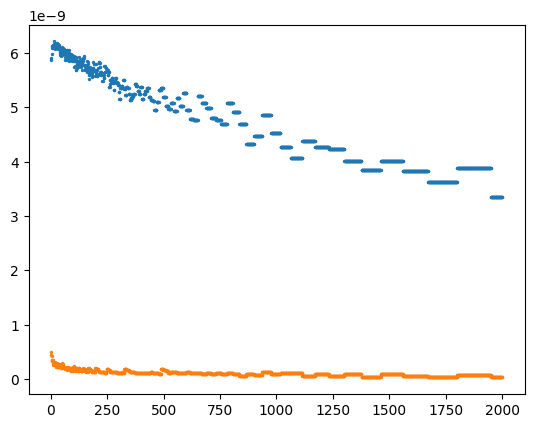

In [176]:
fig = plt.figure()
plt.scatter(list(rvs.keys()), [np.sum(l)/(61*23400) for l in list(rvs.values())], s = 2)
plt.scatter(list(rvsSim.keys()), [np.sum(l)/(14*23400) for l in list(rvsSim.values())], s = 2)
fig.savefig("/SAN/fca/Konark_PhD_Experiments/results/AAPL.OQ_2019-01-02_2019-03-31_signatureDictEmpirical.png")

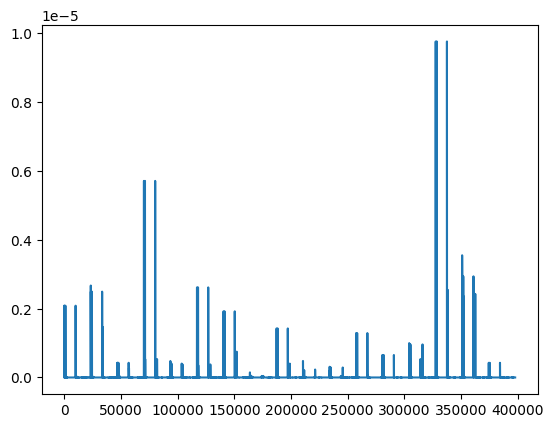

In [182]:
plt.plot(rvsSim[1])

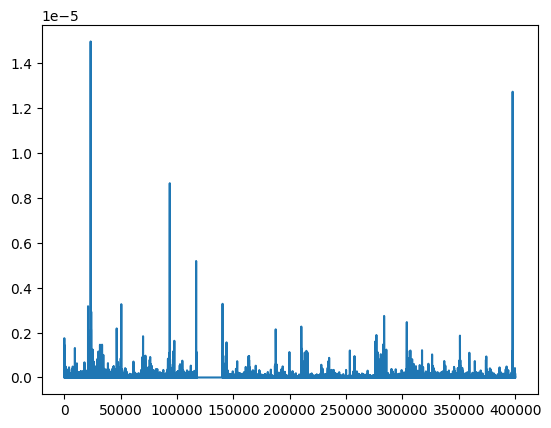

In [185]:
plt.plot(rvs[1][:400000])

In [ ]:
for d in pd.date_range(dt.date(2019,1,2), dt.date(2019,3,31)):
            l = dataLoader.Loader("AAPL.OQ", d, d, nlevels = 2, dataPath = "/SAN/fca/Konark_PhD_Experiments/extracted/")
            data = l.load()
            if len(data):
                # ask price new < ask price prev or bid price new > bid price prev and event type = LO
                for i in range(len(data)):
                    df = data[i]
                    df['BidDiff'] = df['Bid Price 1'].diff()
                    df['AskDiff'] = df['Ask Price 1'].diff()
                    df['prev spread'] = df.BidDiff - df.AskDiff + df['Ask Price 1'] - df['Bid Price 1']
                    

In [22]:
import os
listParams = [i  for i in os.listdir("/SAN/fca/Konark_PhD_Experiments/extracted") if ("INTC.OQ_Params_" in i)&("osqp" in i)]

In [33]:
t= {}
for l in listParams:
    if l == "INTC.OQ_Params_2019-01-02_2019-03-31_IS_osqpSparse_bounds": continue
    print(l)
    with open("/SAN/fca/Konark_PhD_Experiments/extracted/"+l, "rb") as f:
        res = pickle.load(f)
    t[l.split("_")[2]] = res
with open("/SAN/fca/Konark_PhD_Experiments/extracted/INTC.OQ_Params_2019-01-02_2019-03-31_IS_osqpSparseTODNorm_bounds", "wb") as f:
    pickle.dump(t, f)

INTC.OQ_Params_2019-01-02_2019-01-02_IS_osqpSparse_bounds
INTC.OQ_Params_2019-01-03_2019-01-03_IS_osqpSparse_bounds
INTC.OQ_Params_2019-01-04_2019-01-04_IS_osqpSparse_bounds
INTC.OQ_Params_2019-01-07_2019-01-07_IS_osqpSparse_bounds
INTC.OQ_Params_2019-01-08_2019-01-08_IS_osqpSparse_bounds
INTC.OQ_Params_2019-01-09_2019-01-09_IS_osqpSparse_bounds
INTC.OQ_Params_2019-01-10_2019-01-10_IS_osqpSparse_bounds
INTC.OQ_Params_2019-01-11_2019-01-11_IS_osqpSparse_bounds
INTC.OQ_Params_2019-01-14_2019-01-14_IS_osqpSparse_bounds
INTC.OQ_Params_2019-01-15_2019-01-15_IS_osqpSparse_bounds
INTC.OQ_Params_2019-01-16_2019-01-16_IS_osqpSparse_bounds
INTC.OQ_Params_2019-01-17_2019-01-17_IS_osqpSparse_bounds
INTC.OQ_Params_2019-01-18_2019-01-18_IS_osqpSparse_bounds
INTC.OQ_Params_2019-01-22_2019-01-22_IS_osqpSparse_bounds
INTC.OQ_Params_2019-01-23_2019-01-23_IS_osqpSparse_bounds
INTC.OQ_Params_2019-01-24_2019-01-24_IS_osqpSparse_bounds
INTC.OQ_Params_2019-01-25_2019-01-25_IS_osqpSparse_bounds
INTC.OQ_Params

In [23]:
!qstat

job-ID  prior   name       user         state submit/start at     queue                          slots ja-task-ID 
-----------------------------------------------------------------------------------------------------------------
3260429 0.50009 qqAaplTrap konajain     r     01/30/2024 15:21:48 cpu.q@saunders-608-22.local        1 73
3260429 0.50009 qqAaplTrap konajain     r     01/30/2024 15:21:48 cpu.q@burns-610-47.local           1 76
3260429 0.50009 qqAaplTrap konajain     r     01/30/2024 15:21:48 cpu.q@fry-611-161.local            1 77
3260429 0.50009 qqAaplTrap konajain     r     01/30/2024 15:21:48 cpu.q@burns-609-100.local          1 78
3260429 0.50009 qqAaplTrap konajain     r     01/30/2024 15:21:48 cpu.q@fry-611-161.local            1 79
3260429 0.50009 qqAaplTrap konajain     r     01/30/2024 15:24:50 cpu.q@burns-610-229.local          1 80
3260429 0.50009 qqAaplTrap konajain     r     01/30/2024 15:24:50 cpu.q@burns-610-202.local          1 83
3260429 0.50009 qqAaplTrap ko

In [37]:
import statsmodels.api as sm
from scipy import stats

In [47]:
import pickle
import os
dictComp = {}
for d in pd.date_range(dt.date(2019,1,2), dt.date(2019,3,31)):
    if "AAPL.OQ_"+d.strftime("%Y-%m-%d")+"_" +d.strftime("%Y-%m-%d")+ "_qq" not in os.listdir("/SAN/fca/Konark_PhD_Experiments/results"):
        continue
    with open("/SAN/fca/Konark_PhD_Experiments/results/AAPL.OQ_"+d.strftime("%Y-%m-%d")+"_" +d.strftime("%Y-%m-%d")+ "_qq", 'rb') as f:
        # results = pickle.load(f)
        res = []
        while True:
                        try:
                            res.append(pickle.load(f))
                        except EOFError:
                            break
    p = []
    for i, j in res:
        p += [np.array([i.event] + j)]
    df = pd.DataFrame(np.vstack(p))
    
    for i, col in zip(np.arange(12),cols):
        df_i = df.loc[df[0] == col]
        a = df_i[i+1].astype(float).diff().iloc[1:].values
        # a = a[a>0] # .apply(lambda x: np.max([0,x]))
        dictComp[col] = np.append(dictComp.get(col, np.array([])) , a)

43767


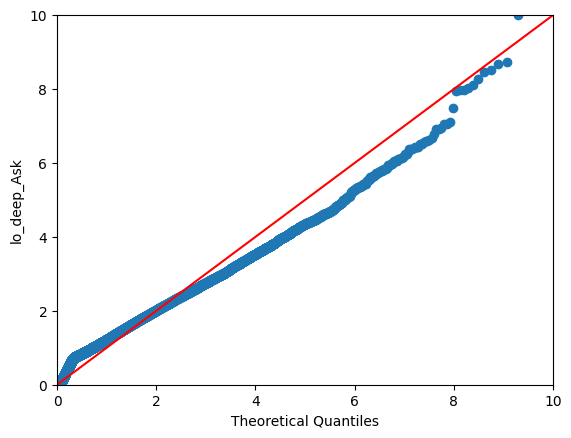

48155


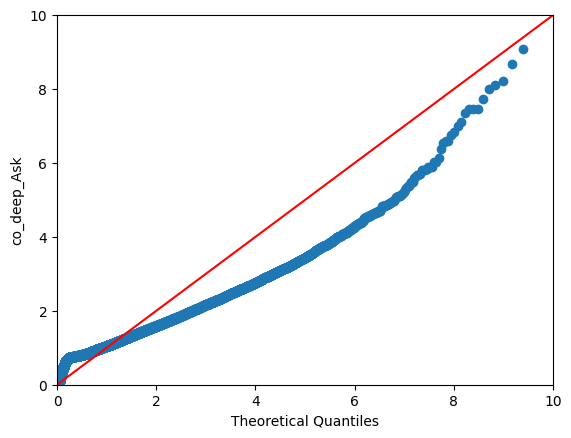

72797


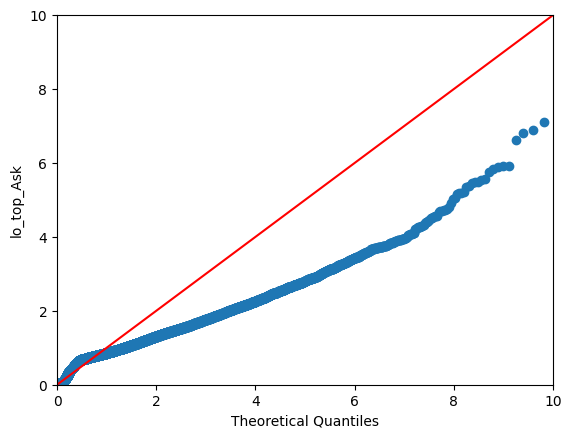

98970


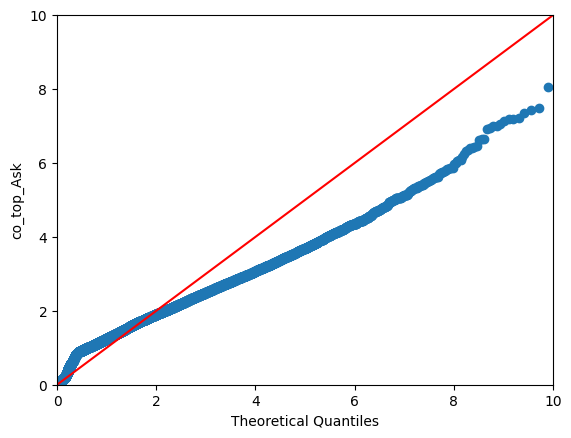

25159


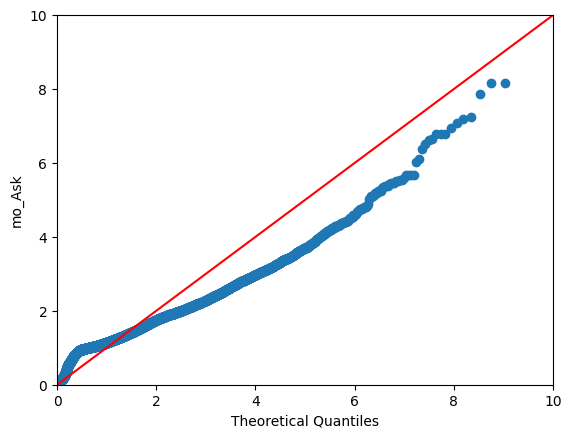

50691


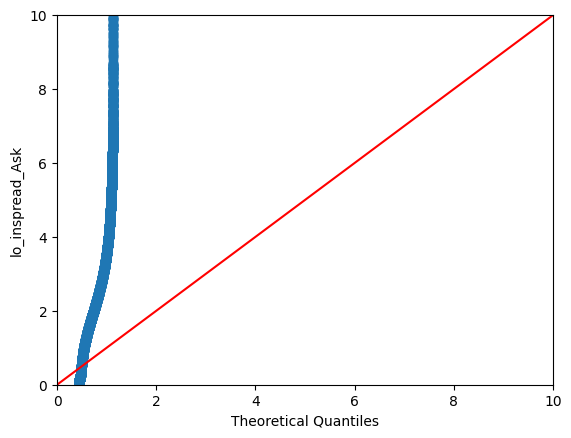

48835


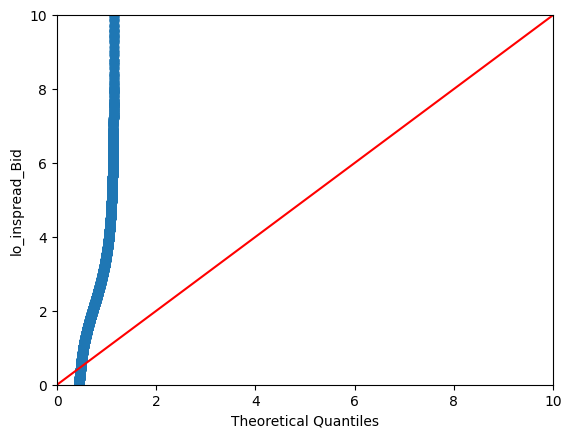

30225


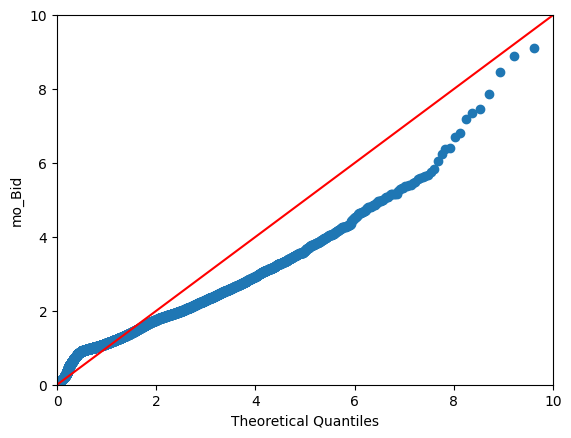

88765


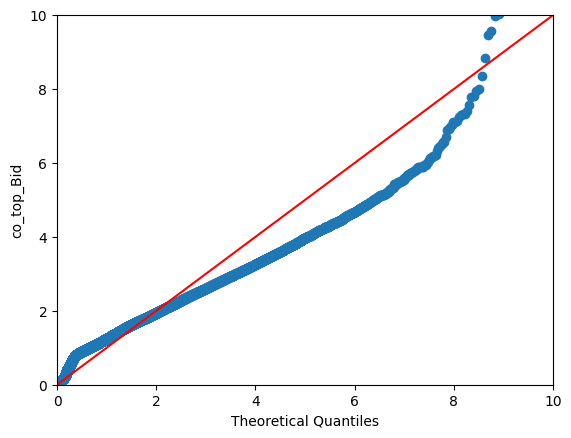

65866


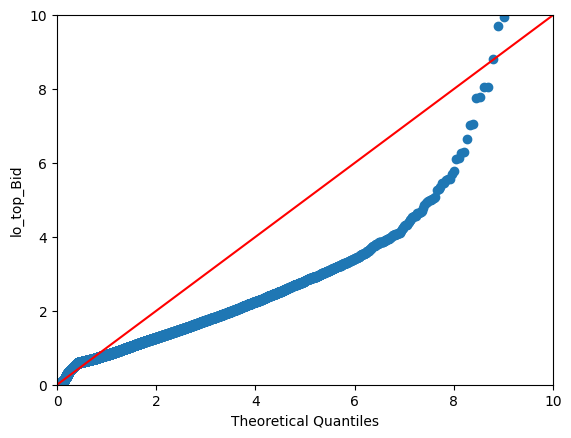

46204


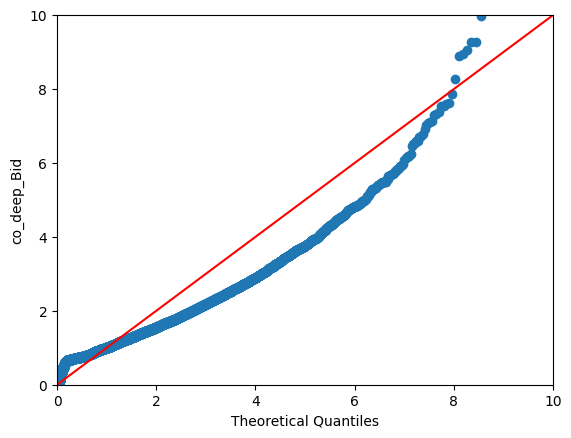

43379


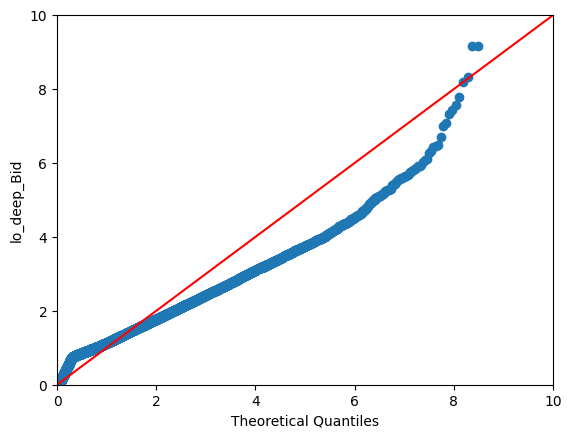

In [48]:

for k, v in dictComp.items():
    # plt.title(k)
    print(len(v))
    ppplot = sm.ProbPlot(1.25*np.array(v), stats.expon)
    fig = ppplot.qqplot(line="45", ylabel=k)
    plt.xlim(0, 10)
    plt.ylim(0, 10)
    plt.show()

In [4]:
import pickle
import os
import pandas as pd
dfs= []
for d in pd.date_range(dt.date(2019,1,2), dt.date(2019,3,31)):
    if "AAPL.OQ_"+d.strftime("%Y-%m-%d")+"_" +d.strftime("%Y-%m-%d")+ "_qqTrapezoid" not in os.listdir("/SAN/fca/Konark_PhD_Experiments/results"):
        continue
    with open("/SAN/fca/Konark_PhD_Experiments/results/AAPL.OQ_"+d.strftime("%Y-%m-%d")+"_" +d.strftime("%Y-%m-%d")+ "_qqTrapezoid", 'rb') as f:
        results = pickle.load(f)
    dfs += [pd.DataFrame(results)]

/share/apps/python-3.8.5-shared/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


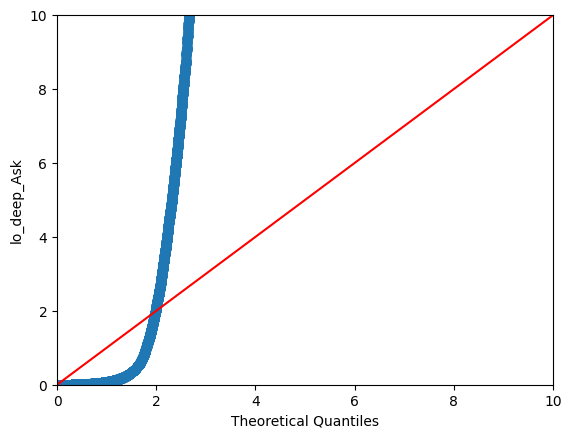

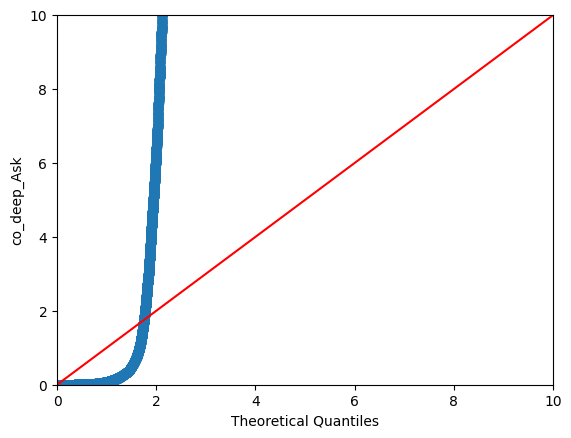

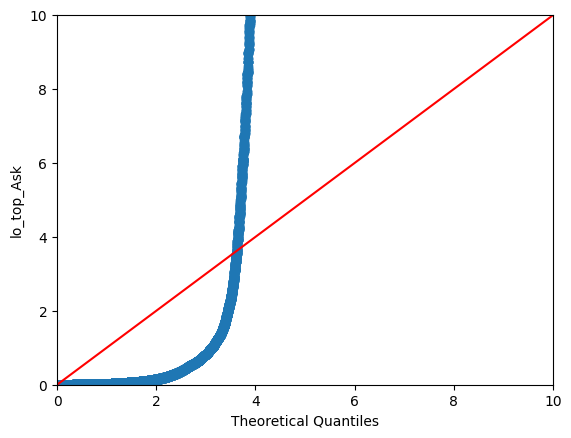

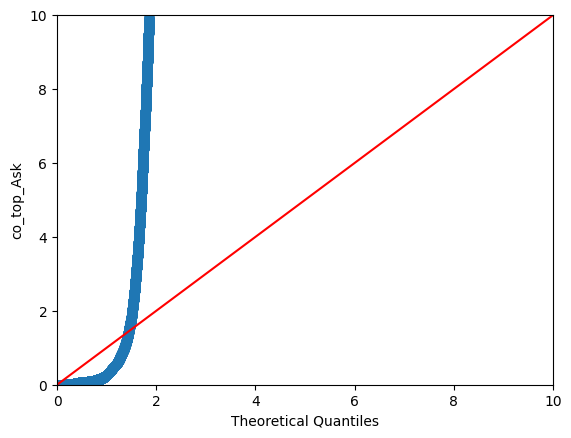

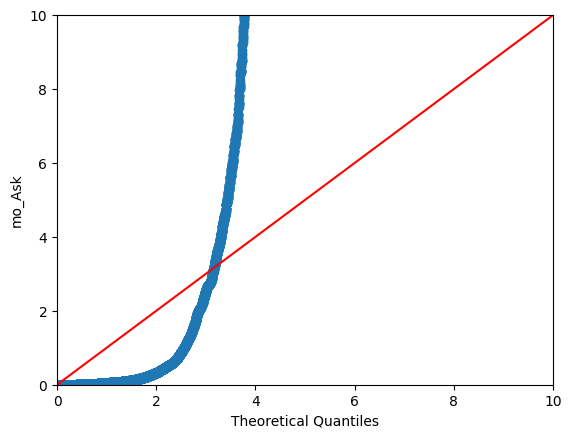

...

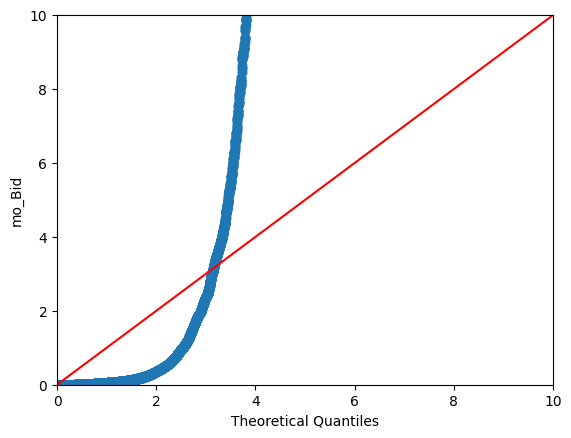

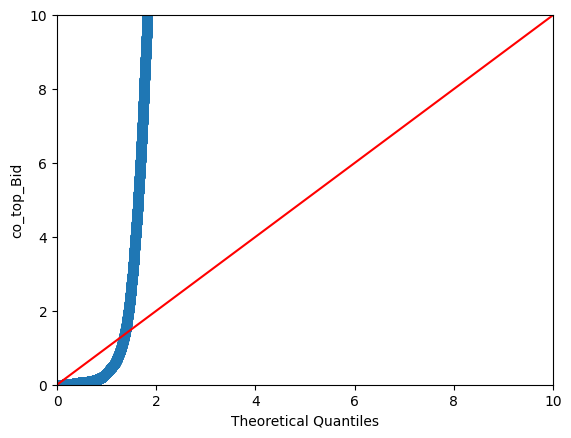

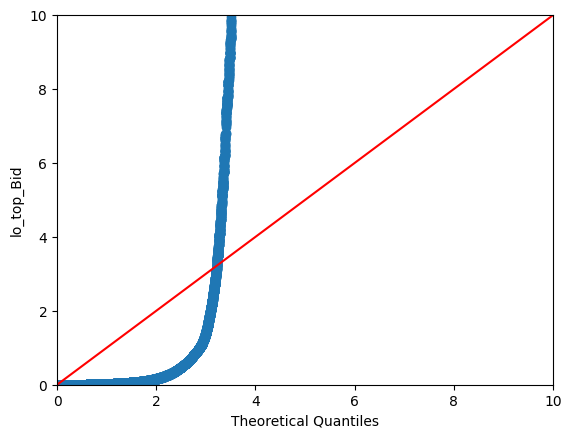

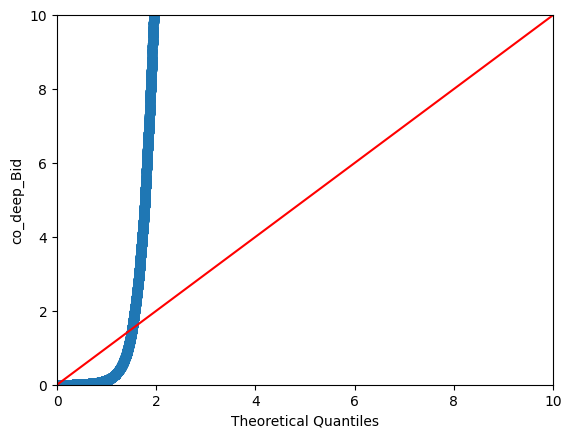

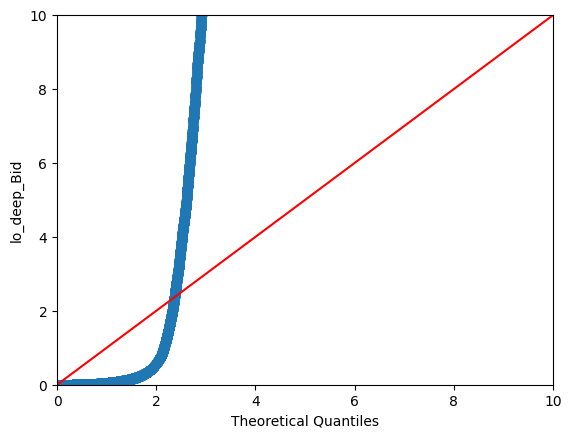

In [10]:
dictTrap = {}
for i in range(12):
    vs = []
    for df in dfs:
        df["2_1"] = 0
        df["2_1"].iloc[1:] = df[3 + 2*i].iloc[:-1]
        df["1 int"] = (df[1].diff()*0.5*(df[2 + 2*i] + df["2_1"]))
        vs += [df.groupby([0,1]).sum()["1 int"].loc[float(i)].iloc[1:-1].values]
    vs = np.hstack(vs)
    dictTrap[cols[i]] = vs
    ppplot = sm.ProbPlot(vs[vs>0], stats.expon)
    fig = ppplot.qqplot(line="45", ylabel=cols[i])
    plt.xlim(0,10)
    plt.ylim(0,10)
    plt.show()

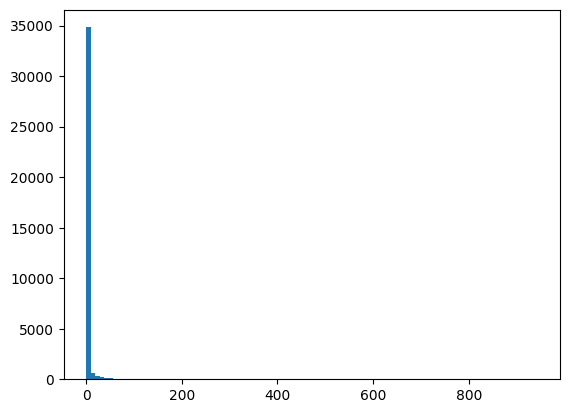

In [11]:
fig = plt.hist(np.hstack(vs), bins=100)

In [12]:
df.iloc[-300:-1].loc[df[0] == 4.0][1]

21987    579.997801
21989    579.997835
21990    579.997863
21991    579.997865
22051    584.461314
22091    585.020408
22135    587.381330
22137    587.381674
22202    590.868977
22231    592.731534
22239    592.732504
22244    592.763923
22254    592.845389
22262    593.308902
22275    593.597298
Name: 1, dtype: float64

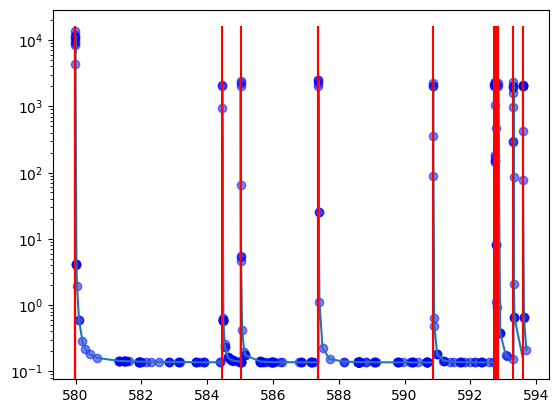

In [13]:
plt.plot(df[1].iloc[-300:-1], df[10].iloc[-300:-1])
plt.scatter(df[1].iloc[-300:-1], df[11].iloc[-300:-1], color="blue", alpha=0.5)
plt.vlines(df.iloc[-300:-1].loc[df[0] == 4.0][1].values, 0, 16000, color="red")
plt.yscale("log")

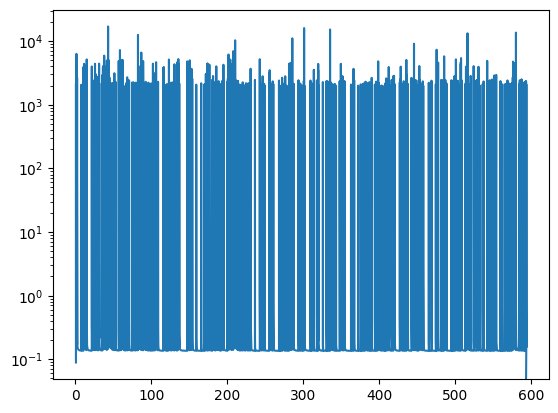

In [14]:
plt.plot(df[[1,1]].values.flatten(), df[[10,11]].values.flatten())
# plt.xscale("log")
plt.yscale("log")

In [15]:
df["2_1"] = 0
df["2_1"].iloc[1:] = df[11].iloc[:-1]

In [16]:
df["1 int"] = (df[1].diff()*0.5*(df[10] + df["2_1"]))
v =df.groupby([0,1]).sum()["1 int"].loc[4.0].iloc[1:-1].values

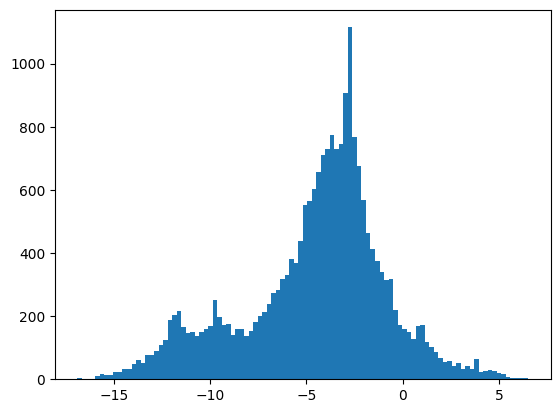

In [17]:
v= dictTrap["mo_Ask"]
fig = plt.hist(np.log(v[v>0]), bins = 100)

In [381]:
np.median(v)

0.023973967663099945

In [382]:
np.median(np.random.exponential(size=10000))

0.6995181885514046

In [385]:
np.log(2)

0.6931471805599453

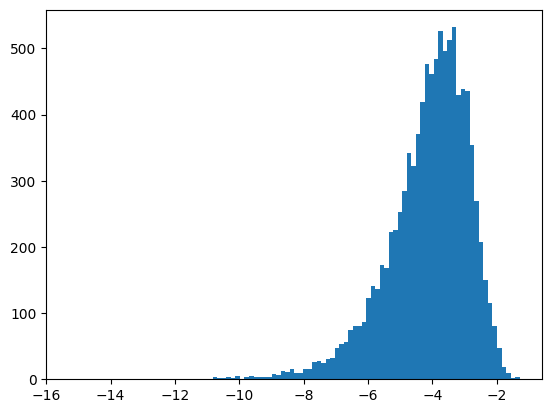

In [388]:
fig = plt.hist(np.log(np.random.exponential(scale= 0.02/np.log(2), size=10000)), bins = 100)

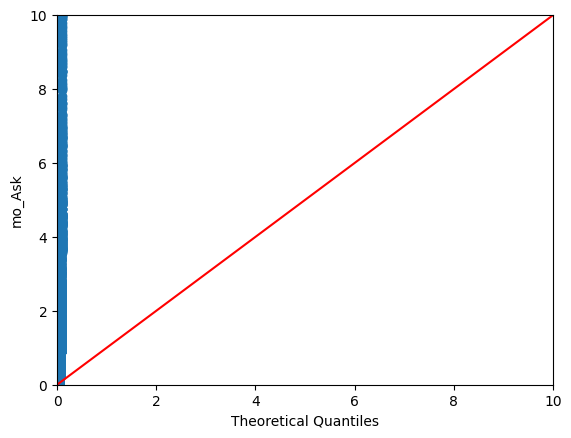

In [396]:
ppplot = sm.ProbPlot(v, stats.expon(scale= 0.02/np.log(2)))
fig = ppplot.qqplot(line="45", ylabel="mo_Ask")
plt.xlim(0,10)
plt.ylim(0,10)
plt.show()

In [330]:
df.groupby([0,1]).sum().loc[4.0]

,2,3,4,5,6,7,8,9,10,11,...,18,19,20,21,22,23,24,25,2_1,1 int
1,,,,,,,,,,,,,,,,,,,,,
0.636890,0.047496,0.047496,0.051929,0.051929,0.182608,0.182608,0.225660,0.225660,0.088974,0.088974,...,0.25877,0.25877,0.191730,0.191730,0.043074,0.043074,0.041498,0.041498,0.088974,0.000000
0.669173,2.132105,2.132105,0.057041,0.057041,0.000000,0.000000,36.935793,36.935793,0.580087,1992.123141,...,0.00000,0.00000,0.406720,0.406720,0.000000,0.000000,0.036887,0.036887,0.627392,0.001131
0.669993,1.261611,1.261611,0.000000,0.000000,0.000000,0.000000,18.744223,18.744223,165.558133,2157.101187,...,0.00000,0.00000,0.396836,0.396836,0.000000,0.000000,0.037207,0.037207,1992.123141,0.884204
0.723000,0.092330,0.092330,0.000000,0.000000,0.430120,0.430120,0.000000,0.000000,0.599112,1992.142166,...,0.00000,0.00000,0.217766,0.217766,0.000000,0.000000,0.045840,0.045840,0.676085,0.003158
1.107316,0.000000,0.000000,0.166969,0.166969,0.025541,0.025541,0.000000,0.000000,0.157141,1991.700195,...,0.00000,0.00000,0.162902,0.162902,0.000000,0.000000,0.461019,0.461019,0.160050,0.004749
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301.065659,54.265207,54.265207,1765.716227,1765.716227,0.168015,0.168015,30.386432,30.386432,14000.531979,15992.075032,...,0.00000,0.00000,0.194960,0.194960,24.907968,24.907968,309.588819,309.588819,13244.428303,0.035132
301.065706,25.115532,25.115532,1268.348235,1268.348235,0.168010,0.168010,24.675247,24.675247,12176.711159,14168.254213,...,0.00000,0.00000,0.194945,0.194945,18.475107,18.475107,180.311204,180.311204,15992.075032,0.667389
301.098307,0.000000,0.000000,0.000000,0.000000,436.623253,436.623253,231.322732,231.322732,4.070284,1995.613337,...,0.00000,0.00000,0.927509,0.927509,1182.362739,1182.362739,0.000000,0.000000,4.075504,0.000105


In [250]:
df.groupby([0,1]).sum().loc[1.0]

,2,3,4,5,6,7,8,9,10,11,...,18,19,20,21,22,23,24,25,2_1,1 int
1,,,,,,,,,,,,,,,,,,,,,
0.723055,0.092286,77.867791,0.000000,1902.992157,0.429881,0.429881,0.000000,30.253741,1930.139581,1930.139581,...,0.000000,0.000000,0.217720,0.217720,0.000000,26.035848,0.045844,362.250738,0.092330,0.000005
1.066971,1254.416345,1332.191850,5.230509,1908.274589,0.000000,0.000000,3014.948647,3045.834283,0.161206,0.161206,...,0.220809,0.000000,0.184207,0.184207,0.023190,26.225934,0.040319,362.245213,1221.413194,0.004117
1.370667,0.000000,75.900511,0.000000,1900.213046,0.284603,0.284603,0.000000,26.132019,9.580305,9.580305,...,0.000000,0.000000,0.000000,0.000000,0.217778,26.420523,3.167033,365.371927,0.000000,0.000000
3.886323,140.572098,218.347603,0.000000,1889.869760,0.000000,0.000000,1142.116712,1173.002347,0.141840,0.141840,...,0.000000,0.000000,11.343692,11.343692,0.000000,0.000000,0.000000,324.691515,1814.541301,0.245122
7.561484,0.000000,16.985192,0.000000,1840.789660,20.842527,20.842527,63.699576,94.585211,0.136534,0.136534,...,0.000000,0.000000,0.736109,0.736109,42.521862,68.724607,0.135921,362.340815,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43.057429,0.000000,0.000000,0.000000,1822.112861,0.000000,0.000000,0.000000,0.000000,397.208131,397.208131,...,0.000000,0.000000,78.243813,78.243813,333.240424,359.443168,1001.344185,1363.549079,416.747021,0.052313
43.057616,1215.856334,1293.631839,1742.417614,3645.461694,0.000000,0.000000,0.000000,0.000000,1910.840878,1910.840878,...,0.000000,0.000000,2886.005751,2886.005751,0.000000,0.000000,996.508087,1358.712981,1276.164662,0.004355
43.073785,0.000000,71.699531,0.000000,1901.823607,4.543048,4.543048,0.000000,10.178365,6.560471,6.560471,...,0.000000,0.000000,1.787896,1.787896,0.352420,26.555165,8.145631,370.350525,0.000000,0.000000


In [252]:
df["1 int"]

0              NaN
1         0.000000
2         0.000000
3         0.000000
4         0.000000
           ...    
2058      0.000000
2059      0.000000
2060      0.000000
2061      0.000486
2062   -586.568804
Name: 1 int, Length: 2063, dtype: float64

In [20]:
with open("/SAN/fca/Konark_PhD_Experiments/simulated/AAPL.OQ_ResultsWCutoff_2019-01-02_2019-03-31_CLSLogLin_10_85", "rb") as f:
    results = pickle.load(f)

In [23]:
results[0]

['mo_Bid', 23400.000997167084, 0.00031497158108458544]

In [350]:
simDf = pd.DataFrame(results[1])
if True:
        simDf['Ask'] = simDf['Ask_touch'].apply(lambda x: x[0])
        simDf['Bid'] =  simDf['Bid_touch'].apply(lambda x: x[0])
        simDf['Mid'] = 0.5*(simDf['Ask'] + simDf['Bid'])
        simDf['Spread'] = simDf['Ask'] - simDf['Bid']
        mid = simDf.Mid.values
        times = np.append([0], np.array(results[0][1:])[:,1])

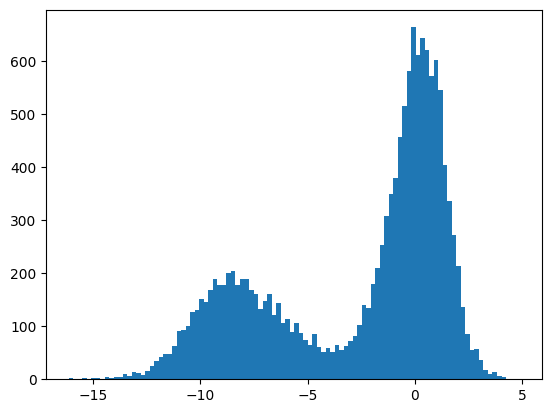

In [363]:
fig = plt.hist(np.log(np.diff(times[np.append([0], np.diff(mid)) !=0].astype(float))), bins = 100)

In [2]:
import datetime as dt
d = dt.date(2019,1,2)
import pickle
with open("/SAN/fca/Konark_PhD_Experiments/results/AAPL.OQ_"+d.strftime("%Y-%m-%d")+"_" +d.strftime("%Y-%m-%d")+ "_qqTrapezoid", 'rb') as f:
        results = pickle.load(f)

In [5]:
import pandas as pd
pd.DataFrame(results)

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
0,6.0,0.799292,0.047496,0.047496,0.051929,0.051929,0.182608,0.182608,0.22566,0.22566,...,0.094706,0.094706,0.258770,0.258770,0.191730,0.191730,0.043074,0.043074,0.041498,0.041498
1,11.0,0.799292,0.047496,0.047496,0.051929,0.051929,0.182608,0.182608,0.22566,0.22566,...,0.094706,0.094706,0.258770,0.258770,0.191730,0.191730,0.043074,0.043074,0.041498,0.041498
2,11.0,0.799292,0.047496,0.047496,0.051929,0.051929,0.182608,0.182608,0.22566,0.22566,...,0.094706,0.094706,0.258770,0.258770,0.191730,0.191730,0.043074,0.043074,0.041498,0.041498
3,0.0,0.799292,0.047496,0.047496,0.051929,0.051929,0.182608,0.182608,0.22566,0.22566,...,0.094706,0.094706,0.258770,0.258770,0.191730,0.191730,0.043074,0.043074,0.041498,0.041498
4,11.0,0.799292,0.047496,0.047496,0.051929,0.051929,0.182608,0.182608,0.22566,0.22566,...,0.094706,0.094706,0.258770,0.258770,0.191730,0.191730,0.043074,0.043074,0.041498,0.041498
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30659,8.0,621.288514,0.000000,0.000000,424.517843,342.824186,413.223814,413.223814,0.00000,0.00000,...,0.151852,0.151852,0.000000,1828.471972,1604.291553,1604.291553,956.440022,956.440022,380.064741,313.055298
30660,4.0,621.288531,0.000000,0.000000,229.708942,229.708942,323.526836,323.526836,0.00000,0.00000,...,0.151852,0.151852,1597.750362,1597.750362,1369.945977,1369.945977,685.310243,685.310243,245.027492,245.027492
30661,11.0,621.288537,0.000000,0.000000,200.287975,0.000000,298.050137,298.050137,0.00000,0.00000,...,0.151852,0.151852,1447.944374,1867.180801,1296.991931,599.120141,612.263625,1449.235260,228.132127,1498.631396
30662,4.0,621.288558,0.000000,0.000000,0.000000,0.000000,231.062731,231.062731,0.00000,0.00000,...,0.151852,0.151852,1454.248926,1454.248926,505.553624,505.553624,776.978886,776.978886,1508.000681,1508.000681


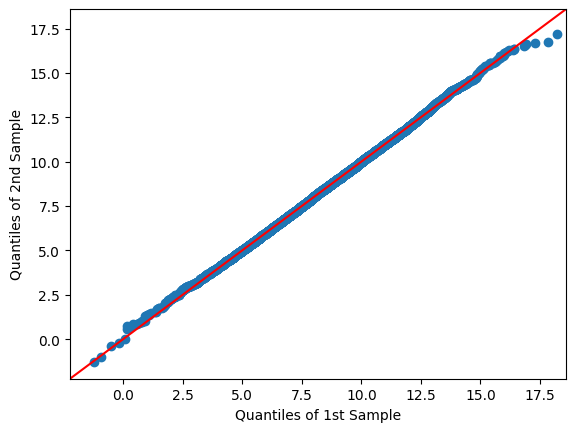

In [10]:
import statsmodels.api as sm
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.graphics.gofplots import qqplot_2samples
x = np.random.normal(loc=8.5, scale=2.5, size=10000)
y = np.random.normal(loc=8.5, scale=2.5, size=10000)
pp_x = sm.ProbPlot(x)
pp_y = sm.ProbPlot(y)
qqplot_2samples(pp_x, pp_y, line="45")
plt.show()


In [5]:
import statsmodels.api as sm
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.graphics.gofplots import qqplot_2samples
import pandas as pd
import datetime as dt

In [6]:
6.5*3600

23400.0

In [7]:
times = {}
for d in pd.date_range(dt.date(2019,1,2), dt.date(2019,2,1)):
    try:
        data = pd.read_csv("/SAN/fca/Konark_PhD_Experiments/extracted/AAPL.OQ_"+ d.strftime("%Y-%m-%d") +"_12D.csv")
    except: 
        continue
    # data = data.loc[(data.Time < 3*3600)&(data.Time > 2.5*3600)]
    data_times = data.groupby("event").Time.apply(lambda x: np.array(x)).to_dict()
    for k in data_times:
        tmp = times.get(k, [])
        times[k]=np.append(tmp, np.diff(data_times[k]) )

/home/konajain/.local/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3508: DtypeWarning: Columns (7) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [8]:
import pickle
import os
times_Sim = {}
ric = "AAPL.OQ"
suffix = "_CLSLogLin"
dataPath = "/SAN/fca/Konark_PhD_Experiments/simulated/newMu"
for l in [dataPath + "/" + i for i in os.listdir(dataPath) if (ric in i)&(suffix in i)]:
    with open(l, "rb") as f:
        results = pickle.load(f)
    data = pd.DataFrame(results[0][1:], columns = ["event", "Time", "tmp"])
    # data.loc[(data.Time < 3*3600)&(data.Time > 2.5*3600)]
    data_times = data.groupby("event").Time.apply(lambda x: np.array(x)).to_dict()
    for k in data_times:
        tmp = times_Sim.get(k, [])
        times_Sim[k]=np.append(tmp, np.diff(data_times[k]) )

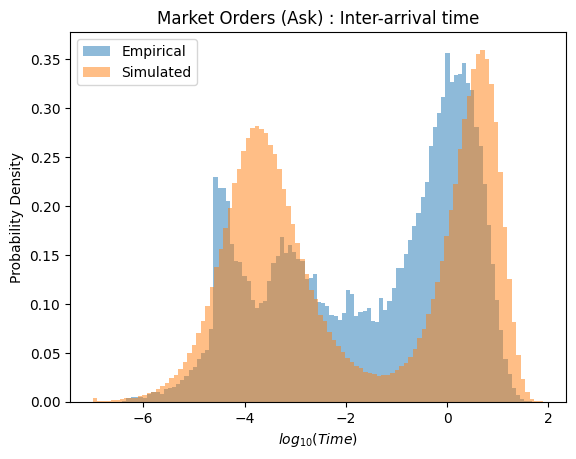

In [10]:
c = "mo_Bid"
plt.hist(np.log(times[c][times[c]>0])/np.log(10), bins = 100,alpha=.5, density = True, label = "Empirical")
plt.hist(np.log(times_Sim[c])/np.log(10), bins = 100, density = True, alpha=.5, label = "Simulated")
plt.legend()
plt.title("Market Orders (Ask) : Inter-arrival time")
plt.xlabel("$log_{10}(Time)$")
plt.ylabel("Probability Density")
# plt.hist(np.log(times_exo)/np.log(10), bins = 100, density = True, alpha = .5)
# plt.yscale("log")
plt.show()

6.6235146304484775


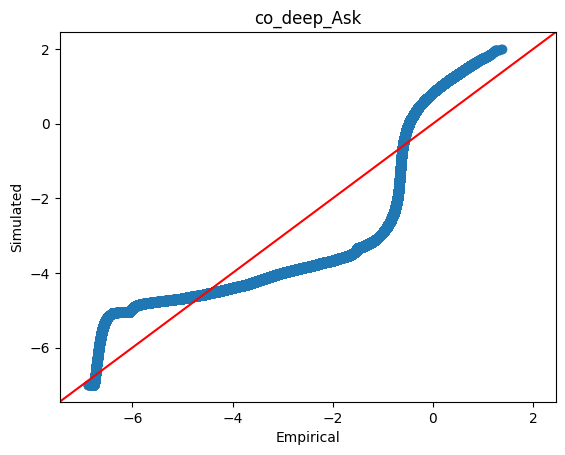

9.582577405070378


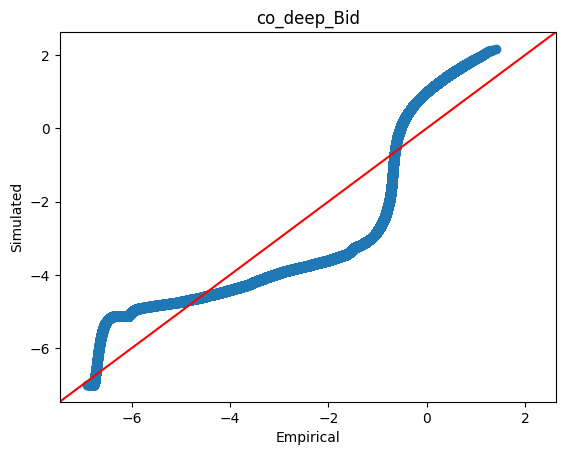

1.969818893891928


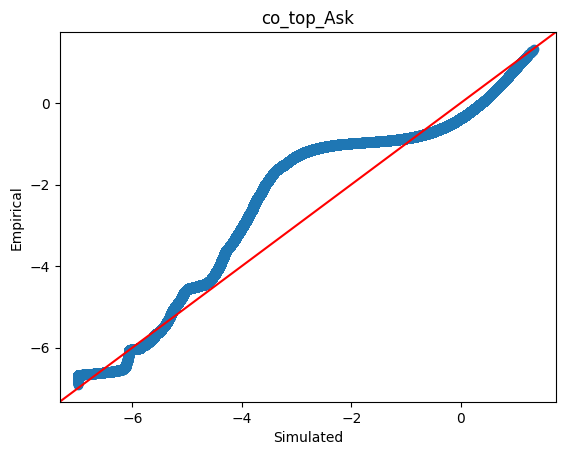

1.7052976751058586


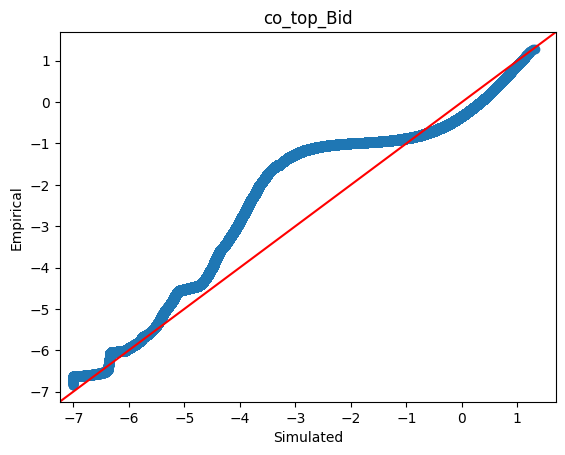

4.590470868480515


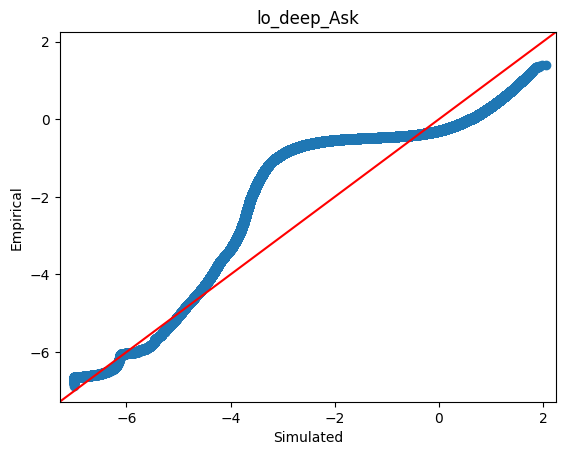

9.80893985998285


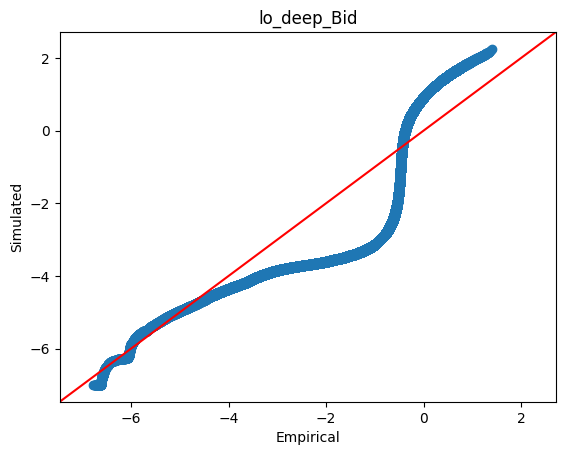

3.2774658813056567


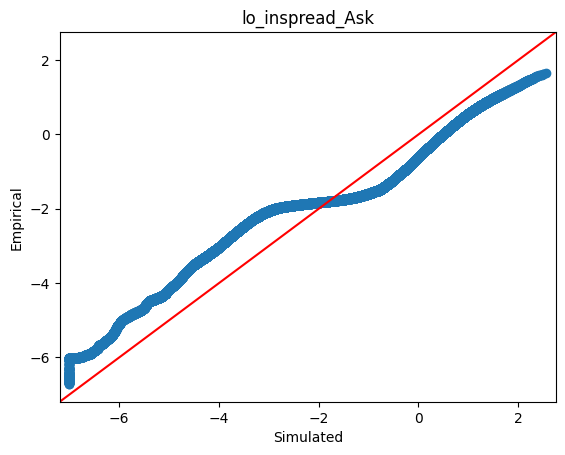

3.3109260802046228


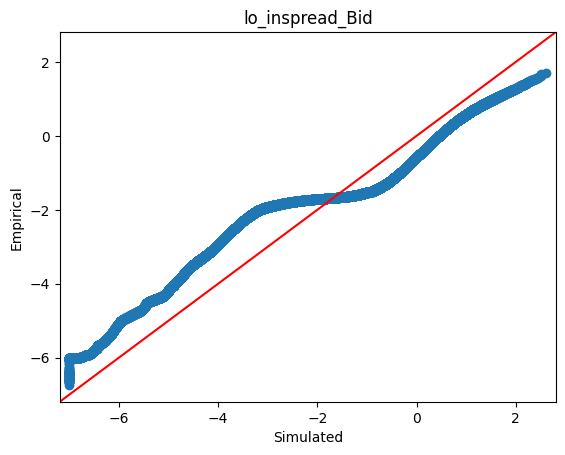

1.9975125961946714


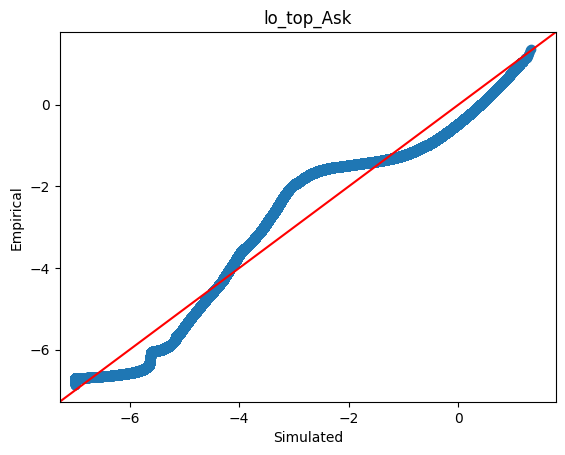

2.275357337667752


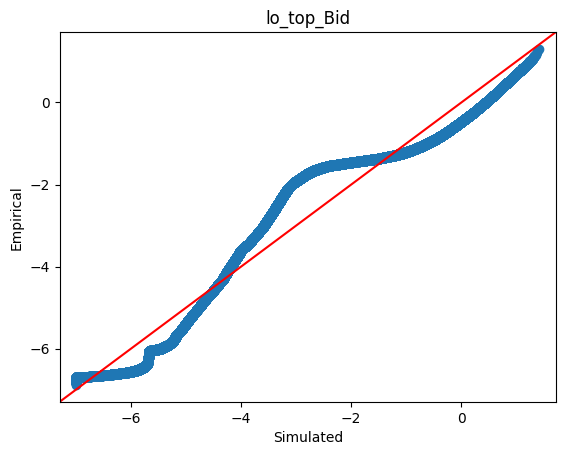

1.6811636227136557


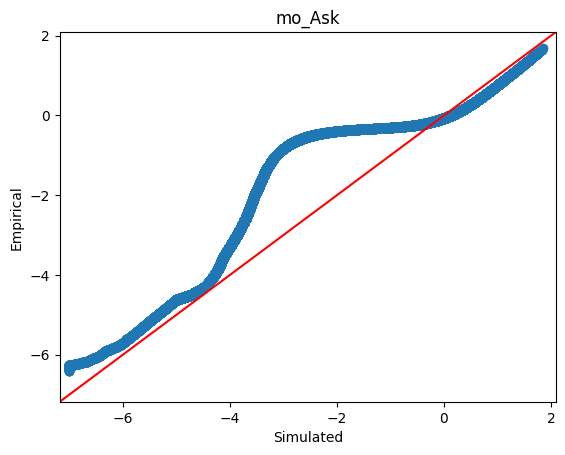

1.7566713826600209


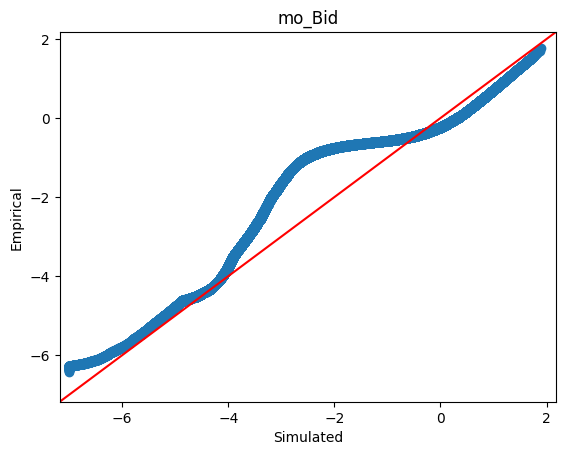

In [15]:
for c in times.keys():
    x = times[c]
    x = x[(x>0)]
    y = times_Sim[c]
    y= y[(y>0)]
    # y = np.random.choice(y, size = len(x))
    pp_x = sm.ProbPlot(np.log(x)/np.log(10))
    pp_y = sm.ProbPlot(np.log(y)/np.log(10))
    print(np.quantile(y, 0.99)/np.quantile(x, 0.99))
    qqplot_2samples(pp_x, pp_y, line="45", xlabel = "Empirical", ylabel = "Simulated")
    plt.title(c)
    # plt.xlim(0,10)
    # plt.ylim(0,10)
    # plt.xscale("log")
    # plt.yscale("log")
    plt.show()

In [70]:
np.random.choice(y, size = len(x))

array([1.56764760e-04, 5.47721142e+00, 1.74875569e-03, ...,
       8.55046303e+00, 2.17568029e+00, 2.13474085e+01])

In [32]:
for c in times.keys():
    x = times[c]
    x = x[x>0]
    y = times_Sim[c]
    # y = y[y < max(x)]
    pp_x = [(x<value).mean() for value in x]
    pp_y = [(y<value).mean() for value in y] #sm.ProbPlot(y,  dist = stats.expon)
    # qqplot_2samples(pp_x, pp_y, line="45")
    plt.scatter(pp_x, pp_y)
    plt.plot(np.arange(int(max(pp_y))), np.arange(int(max(pp_y))))
    plt.title(c)
    plt.xlabel("empirical")
    plt.ylabel("simulated")
    plt.xlim(0,10)
    plt.ylim(0,10)
    plt.xscale("log")
    plt.yscale("log")
    plt.show()

KeyboardInterrupt: 

In [36]:
np.random

dict_keys(['co_deep_Ask', 'co_deep_Bid', 'co_top_Ask', 'co_top_Bid', 'lo_deep_Ask', 'lo_deep_Bid', 'lo_inspread_Ask', 'lo_inspread_Bid', 'lo_top_Ask', 'lo_top_Bid', 'mo_Ask', 'mo_Bid'])

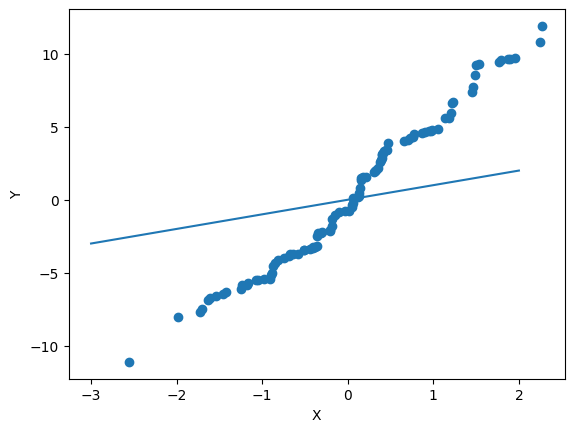

In [59]:
import numpy as np
import matplotlib.pyplot as plt

# Setup
rng = np.random.RandomState(0)  # Seed RNG for replicability
n = 100  # Number of samples to draw

# Generate data
x = rng.normal(size=n)  # Sample 1: X ~ N(0, 1)
y = rng.normal(size=n)*5 # Sample 2: Y ~ t(5)

# Quantile-quantile plot
plt.figure()
plt.scatter(np.sort(x), np.sort(y))
plt.plot(np.arange(-3,3,1), np.arange(-3,3,1))
plt.xlabel('X')
plt.ylabel('Y')
plt.show()
plt.close()

In [57]:
np.arange(-3,3,1)

array([-3, -2, -1,  0,  1,  2])